In [164]:
from datetime import date

import pandas as pd
import numpy as np
import math
from functools import reduce
from scipy import stats
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.dates as mdates

In [165]:
import warnings
warnings.simplefilter(action='ignore', category=Warning)

In [166]:
#Load the data set into dataframe
df_Renewable= pd.read_excel('Renewable_Energy_Production_and_Consumption_by_Source.xlsx','Monthly Data')

In [167]:
df_Renewable['Month'] = df_Renewable['Month'].apply(lambda x: pd.Timestamp(x.year, x.month, 1) + pd.offsets.MonthEnd(0))


In [168]:
df_Renewable.head()

,Month,Wood Energy Production,Biofuels Production,Total Biomass Energy Production,Total Renewable Energy Production,Hydroelectric Power Consumption,Geothermal Energy Consumption,Solar Energy Consumption,Wind Energy Consumption,Wood Energy Consumption,Waste Energy Consumption,Biofuels Consumption,Total Biomass Energy Consumption,Total Renewable Energy Consumption
0,1973-01-31,129.630,Not Available,129.787,403.981,272.703,1.491,Not Available,Not Available,129.630,0.157,Not Available,129.787,403.981
1,1973-02-28,117.194,Not Available,117.338,360.900,242.199,1.363,Not Available,Not Available,117.194,0.144,Not Available,117.338,360.900
2,1973-03-31,129.763,Not Available,129.938,400.161,268.810,1.412,Not Available,Not Available,129.763,0.176,Not Available,129.938,400.161
3,1973-04-30,125.462,Not Available,125.636,380.470,253.185,1.649,Not Available,Not Available,125.462,0.174,Not Available,125.636,380.470
4,1973-05-31,129.624,Not Available,129.834,392.141,260.770,1.537,Not Available,Not Available,129.624,0.210,Not Available,129.834,392.141


In [169]:
df_Renewable['Year'] = pd.to_datetime(df_Renewable['Month']).dt.year
df_Renewable[df_Renewable['Month'] > '2012-12-31']

df_Renewable=df_Renewable[df_Renewable['Month'] > '2012-12-31']

In [170]:
df_Renewable.head()

,Month,Wood Energy Production,Biofuels Production,Total Biomass Energy Production,Total Renewable Energy Production,Hydroelectric Power Consumption,Geothermal Energy Consumption,Solar Energy Consumption,Wind Energy Consumption,Wood Energy Consumption,Waste Energy Consumption,Biofuels Consumption,Total Biomass Energy Consumption,Total Renewable Energy Consumption,Year
480,2013-01-31,199.658,150.623,391.713,798.301,236.889,18.578,10.501,140.62,199.658,41.432,149.653,390.743,797.331,2013
481,2013-02-28,179.530,137.729,354.251,712.286,194.813,16.666,12.261,134.295,179.530,36.992,139.735,356.257,714.292,2013
482,2013-03-31,195.918,159.758,397.835,779.737,195.918,18.543,17.116,150.325,195.918,42.160,161.574,399.652,781.553,2013
483,2013-04-30,185.361,160.339,386.469,828.750,239.451,17.376,18.712,166.741,185.361,40.770,162.337,388.467,830.748,2013
484,2013-05-31,193.120,170.191,404.782,869.844,271.442,17.870,20.817,154.933,193.120,41.470,170.652,405.242,870.304,2013


In [171]:
pip install jedi

Note: you may need to restart the kernel to use updated packages.


In [172]:
df_Renewable.describe()

,Wood Energy Production,Total Biomass Energy Production,Total Renewable Energy Production,Hydroelectric Power Consumption,Geothermal Energy Consumption,Wood Energy Consumption,Waste Energy Consumption,Total Biomass Energy Consumption,Total Renewable Energy Consumption,Year
count,123.000000,123.000000,123.000000,123.000000,123.000000,123.000000,123.000000,123.000000,123.000000,123.000000
mean,190.825228,422.813626,932.912927,206.571268,17.424919,184.775902,39.368764,413.130268,923.229553,2017.634146
std,8.782480,22.102454,117.186183,34.873897,0.807019,11.180349,3.571755,20.662989,111.629037,2.973292
min,168.768000,332.568000,708.225000,129.460000,13.972000,160.485000,31.625000,324.918000,712.154000,2013.000000
25%,184.962500,410.891000,839.386000,178.942500,17.023000,176.775500,36.363000,403.709500,835.786000,2015.000000
50%,190.617000,425.120000,927.668000,204.127000,17.515000,184.035000,40.044000,418.492000,909.319000,2018.000000
75%,196.650000,437.516500,1011.647500,231.719500,18.020500,192.952500,42.181000,425.656000,998.278000,2020.000000
max,215.808000,469.360000,1223.446000,300.246000,19.243000,208.331000,46.745000,460.758000,1204.039000,2023.000000


In [173]:
df_REN_New =df_Renewable[['Month','Solar Energy Consumption','Wind Energy Consumption','Hydroelectric Power Consumption','Geothermal Energy Consumption','Total Biomass Energy Consumption']]

In [174]:
df_REN_New.columns

Index(['Month', 'Solar Energy Consumption', 'Wind Energy Consumption',
       'Hydroelectric Power Consumption', 'Geothermal Energy Consumption',
       'Total Biomass Energy Consumption'],
      dtype='object')

In [175]:
energy_types = ['Solar Energy Consumption', 'Wind Energy Consumption', 'Hydroelectric Power Consumption', 
                'Geothermal Energy Consumption', 'Total Biomass Energy Consumption']


In [176]:
development_Rates={}

In [177]:
for energy in energy_types:
    initial_year=df_Renewable[df_Renewable['Year']==2013][energy].sum()
    final_year=df_Renewable[df_Renewable['Year']==2023][energy].sum()
    developed_Rate=((final_year-initial_year)/initial_year)*100
    development_Rates[energy]=developed_Rate
    

In [178]:
development_Rates

{'Solar Energy Consumption': 79.6515082976327,
 'Wind Energy Consumption': -30.71878323349106,
 'Hydroelectric Power Consumption': -78.2823475509692,
 'Geothermal Energy Consumption': -75.7419149840893,
 'Total Biomass Energy Consumption': -74.50242551425819}

In [179]:
df_Renewable['Solar Energy Consumption'] = pd.to_numeric(df_Renewable['Solar Energy Consumption'], errors='coerce')
annual_solar_production = df_Renewable.groupby('Year')['Solar Energy Consumption'].sum()
solar_growth_rate = annual_solar_production.pct_change()

In [180]:
solar_growth_rate


Year
2013         NaN
2014    0.496306
2015    0.264218
2016    0.336312
2017    0.362333
2018    0.177698
2019    0.111283
2020    0.191926
2021    0.254829
2022    0.230256
2023   -0.783375
Name: Solar Energy Consumption, dtype: float64

In [181]:
df_Renewable['Wind Energy Consumption'] = pd.to_numeric(df_Renewable['Wind Energy Consumption'], errors='coerce')
annual_solar_production = df_Renewable.groupby('Year')['Wind Energy Consumption'].sum()
Wind_growth_rate = annual_solar_production.pct_change()
Wind_growth_rate

Year
2013         NaN
2014    0.078683
2015    0.028363
2016    0.179207
2017    0.117885
2018    0.059408
2019    0.061405
2020    0.125194
2021    0.128960
2022    0.149697
2023   -0.711494
Name: Wind Energy Consumption, dtype: float64

In [182]:
df_Renewable['Hydroelectric Power Consumption'] = pd.to_numeric(df_Renewable['Hydroelectric Power Consumption'], errors='coerce')
annual_solar_production = df_Renewable.groupby('Year')['Hydroelectric Power Consumption'].sum()
Wind_growth_rate = annual_solar_production.pct_change()
Wind_growth_rate

Year
2013         NaN
2014   -0.037490
2015   -0.059354
2016    0.065277
2017    0.119000
2018   -0.037636
2019   -0.037423
2020   -0.023730
2021   -0.110348
2022    0.041397
2023   -0.759836
Name: Hydroelectric Power Consumption, dtype: float64

In [183]:
df_Renewable['Geothermal Energy Consumption'] = pd.to_numeric(df_Renewable['Geothermal Energy Consumption'], errors='coerce')
annual_solar_production = df_Renewable.groupby('Year')['Geothermal Energy Consumption'].sum()
Wind_growth_rate = annual_solar_production.pct_change()
Wind_growth_rate

Year
2013         NaN
2014    0.002187
2015   -0.012673
2016   -0.010470
2017    0.002940
2018   -0.006600
2019   -0.036294
2020    0.008012
2021    0.009768
2022    0.044344
2023   -0.757259
Name: Geothermal Energy Consumption, dtype: float64

In [184]:
df_Renewable['Total Biomass Energy Consumption'] = pd.to_numeric(df_Renewable['Total Biomass Energy Consumption'], errors='coerce')
annual_solar_production = df_Renewable.groupby('Year')['Total Biomass Energy Consumption'].sum()
Wind_growth_rate = annual_solar_production.pct_change()
Wind_growth_rate

Year
2013         NaN
2014    0.031784
2015   -0.000124
2016    0.009601
2017   -0.003646
2018    0.011876
2019   -0.009502
2020   -0.082240
2021    0.044225
2022    0.017515
2023   -0.748606
Name: Total Biomass Energy Consumption, dtype: float64

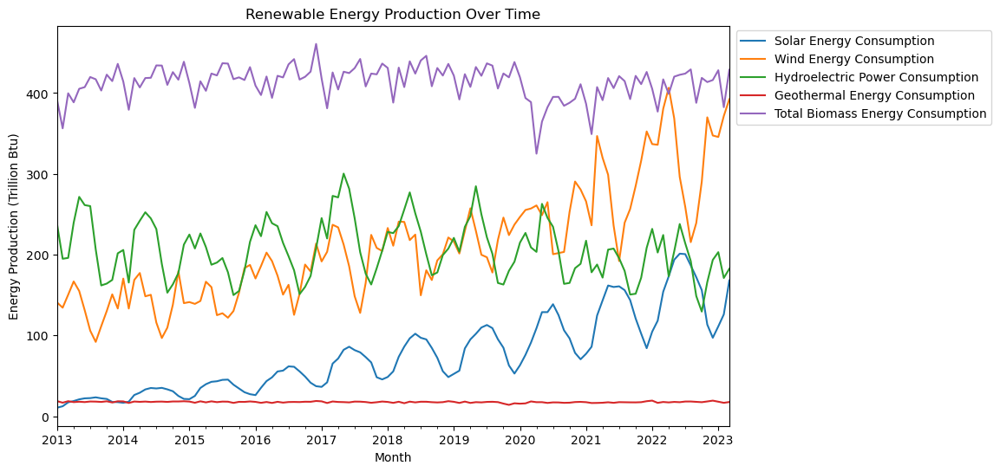

In [185]:
# List of energy sources
energy_sources = ['Solar Energy Consumption', 'Wind Energy Consumption', 'Hydroelectric Power Consumption', 
                'Geothermal Energy Consumption', 'Total Biomass Energy Consumption']

# Create a figure and axes
fig, ax = plt.subplots(figsize=(10, 6))

# Loop through each energy source
for source in energy_sources:
    # Group by month and sum over all production values, then plot
    df_Renewable.groupby('Month')[source].sum().plot(ax=ax, label=source)
    # Format x-axis labels to display  months
    #ax.xaxis.set_major_locator(mdates.MonthLocator(interval=2))
    #ax.xaxis.set_major_formatter(mdates.DateFormatter('%y'))  
    ax.set_xlabel('Month')
      
    
# Add a legend
plt.legend(loc ='upper center', bbox_to_anchor =(1.2,1.0), ncol=1, borderaxespad =0.4)

# Set the title and labels
ax.set_title('Renewable Energy Production Over Time')

ax.set_ylabel('Energy Production (Trillion Btu)')

# Display the plot
plt.show()


* Development Rate*

In [186]:
annual_solar_production_btu = df_Renewable.groupby('Year')['Solar Energy Consumption'].sum()
hours_per_year = 24 * 365
annual_solar_production_mwh = annual_solar_production_btu * 0.29307107  # Convert Btu to MWh
estimated_solar_capacity_mw = annual_solar_production_mwh / hours_per_year


In [187]:
annual_solar_production_mwh


Year
2013     66.083423
2014     98.881007
2015    125.007120
2016    167.048458
2017    227.575547
2018    268.015252
2019    297.840802
2020    355.004314
2021    445.469785
2022    548.042022
2023    118.719867
Name: Solar Energy Consumption, dtype: float64

In [188]:
estimated_solar_capacity_mw

Year
2013    0.007544
2014    0.011288
2015    0.014270
2016    0.019069
2017    0.025979
2018    0.030595
2019    0.034000
2020    0.040526
2021    0.050853
2022    0.062562
2023    0.013552
Name: Solar Energy Consumption, dtype: float64

In [189]:
annual_wind_production_btu = df_Renewable.groupby('Year')['Wind Energy Consumption'].sum()
hours_per_year = 24 * 365
annual_wind_production_mwh = annual_wind_production_btu * 0.29307107  # Convert Btu to MWh
estimated_wind_capacity_mw = annual_wind_production_mwh / hours_per_year

In [190]:
annual_wind_production_mwh

Year
2013     469.311996
2014     506.238950
2015     520.597381
2016     613.892160
2017     686.261079
2018     727.030195
2019     771.673419
2020     868.282245
2021     980.256202
2022    1126.997180
2023     325.145061
Name: Wind Energy Consumption, dtype: float64

In [191]:
estimated_wind_capacity_mw

Year
2013    0.053574
2014    0.057790
2015    0.059429
2016    0.070079
2017    0.078340
2018    0.082994
2019    0.088091
2020    0.099119
2021    0.111901
2022    0.128653
2023    0.037117
Name: Wind Energy Consumption, dtype: float64

In [192]:
annual_Hydroelectric_production_btu = df_Renewable.groupby('Year')['Hydroelectric Power Consumption'].sum()
hours_per_year = 24 * 365
annual_Hydroelectric_production_mwh = annual_Hydroelectric_production_btu * 0.29307107  # Convert Btu to MWh
estimated_Hydroelectric_capacity_mw = annual_Hydroelectric_production_mwh / hours_per_year

In [193]:
annual_Hydroelectric_production_mwh

Year
2013    750.959741
2014    722.806455
2015    679.905247
2016    724.287343
2017    810.477787
2018    779.974950
2019    750.785950
2020    732.969574
2021    652.087820
2022    679.082010
2023    163.090827
Name: Hydroelectric Power Consumption, dtype: float64

In [194]:
estimated_Hydroelectric_capacity_mw

Year
2013    0.085726
2014    0.082512
2015    0.077615
2016    0.082681
2017    0.092520
2018    0.089038
2019    0.085706
2020    0.083672
2021    0.074439
2022    0.077521
2023    0.018618
Name: Hydroelectric Power Consumption, dtype: float64

In [195]:
annual_Geothermal_production_btu = df_Renewable.groupby('Year')['Geothermal Energy Consumption'].sum()
hours_per_year = 24 * 365
annual_Geothermal_production_mwh = annual_Geothermal_production_btu * 0.29307107  # Convert Btu to MWh
estimated_Geothermal_capacity_mw = annual_Geothermal_production_mwh / hours_per_year

In [196]:
annual_Geothermal_production_mwh

Year
2013    62.719260
2014    62.856418
2015    62.059851
2016    61.410112
2017    61.590644
2018    61.184154
2019    58.963555
2020    59.435985
2021    60.016559
2022    62.677937
2023    15.214492
Name: Geothermal Energy Consumption, dtype: float64

In [197]:
estimated_Geothermal_capacity_mw

Year
2013    0.007160
2014    0.007175
2015    0.007084
2016    0.007010
2017    0.007031
2018    0.006984
2019    0.006731
2020    0.006785
2021    0.006851
2022    0.007155
2023    0.001737
Name: Geothermal Energy Consumption, dtype: float64

In [198]:
annual_Biomass_production_btu = df_Renewable.groupby('Year')['Total Biomass Energy Consumption'].sum()
hours_per_year = 24 * 365
annual_Biomass_production_mwh = annual_Biomass_production_btu * 0.29307107  # Convert Btu to MWh
estimated_Biomass_capacity_mw = annual_Biomass_production_mwh / hours_per_year

In [199]:
annual_Biomass_production_mwh

Year
2013    1424.627556
2014    1469.908209
2015    1469.726505
2016    1483.837584
2017    1478.426906
2018    1495.984794
2019    1481.770261
2020    1359.909844
2021    1420.052131
2022    1444.923900
2023     363.245472
Name: Total Biomass Energy Consumption, dtype: float64

In [200]:
estimated_Biomass_capacity_mw

Year
2013    0.162629
2014    0.167798
2015    0.167777
2016    0.169388
2017    0.168770
2018    0.170775
2019    0.169152
2020    0.155241
2021    0.162106
2022    0.164946
2023    0.041466
Name: Total Biomass Energy Consumption, dtype: float64

Text(0.5, 1.0, 'Total Biomass Energy Consumption')

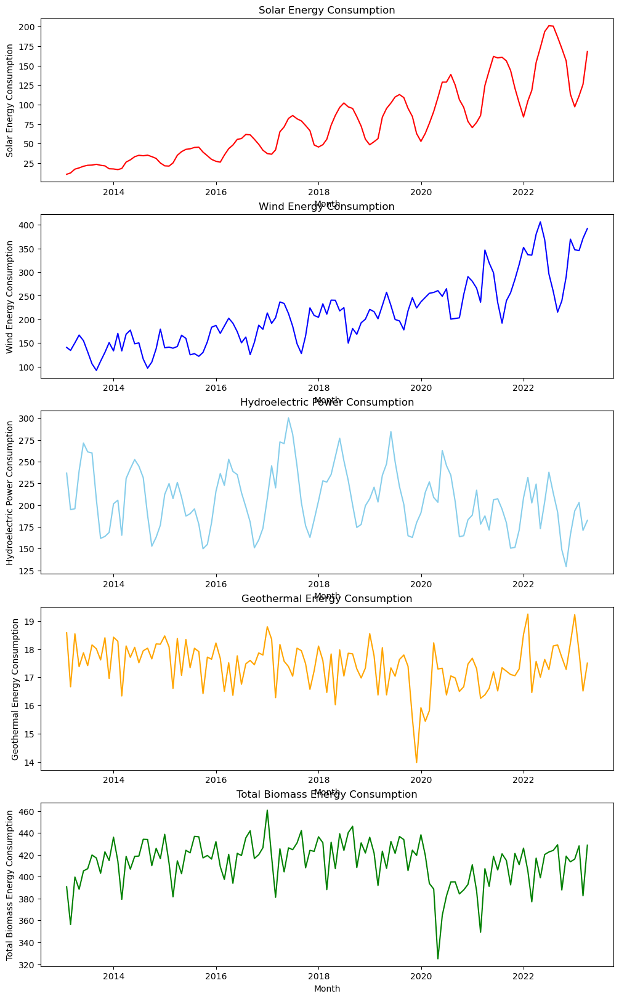

In [201]:
#Check different graph for generate output

# create a figure with 5 subplots
fig, axes = plt.subplots(5,1, figsize=(12,20))
#plt.title('Energy consumption')

#by usuing seaborn library line graph

#each plot in separate subplot
sns.lineplot(ax=axes[0], data=df_Renewable,x='Month', y='Solar Energy Consumption', color ='red' )
axes[0].set_title('Solar Energy Consumption')

sns.lineplot(ax=axes[1], data=df_Renewable,x='Month', y='Wind Energy Consumption', color ='blue' )
axes[1].set_title('Wind Energy Consumption')

sns.lineplot(ax=axes[2], data=df_Renewable,x='Month', y='Hydroelectric Power Consumption', color ='skyblue' )
axes[2].set_title('Hydroelectric Power Consumption')

sns.lineplot(ax=axes[3], data=df_Renewable,x='Month', y='Geothermal Energy Consumption', color ='orange' )
axes[3].set_title('Geothermal Energy Consumption')

sns.lineplot(ax=axes[4], data=df_Renewable,x='Month', y='Total Biomass Energy Consumption',color ='green' )
axes[4].set_title('Total Biomass Energy Consumption')


Text(0.5, 1.0, 'Total Biomass Energy Consumption')

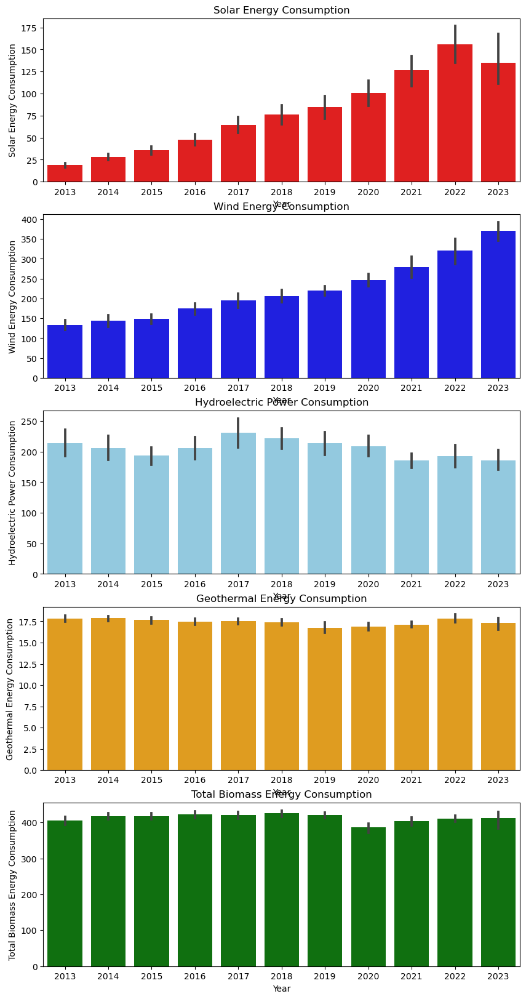

In [202]:
#Check different graph for generate output

# create a figure with 4 subplots
fig, axes = plt.subplots(5,1, figsize=(10,20))
#plt.title('Energy consumption')

#by usuing seaborn library line graph

#each plot in separate subplot
sns.barplot(ax=axes[0], data=df_Renewable,x='Year', y='Solar Energy Consumption', color ='red' )
axes[0].set_title('Solar Energy Consumption')

sns.barplot(ax=axes[1], data=df_Renewable,x='Year', y='Wind Energy Consumption', color ='blue' )
axes[1].set_title('Wind Energy Consumption')

sns.barplot(ax=axes[2], data=df_Renewable,x='Year', y='Hydroelectric Power Consumption', color ='skyblue' )
axes[2].set_title('Hydroelectric Power Consumption')

sns.barplot(ax=axes[3], data=df_Renewable,x='Year', y='Geothermal Energy Consumption', color ='orange' )
axes[3].set_title('Geothermal Energy Consumption')

sns.barplot(ax=axes[4], data=df_Renewable,x='Year', y='Total Biomass Energy Consumption',color ='green' )
axes[4].set_title('Total Biomass Energy Consumption')


Text(0.5, 1.0, 'Total Biomass Energy Consumption')

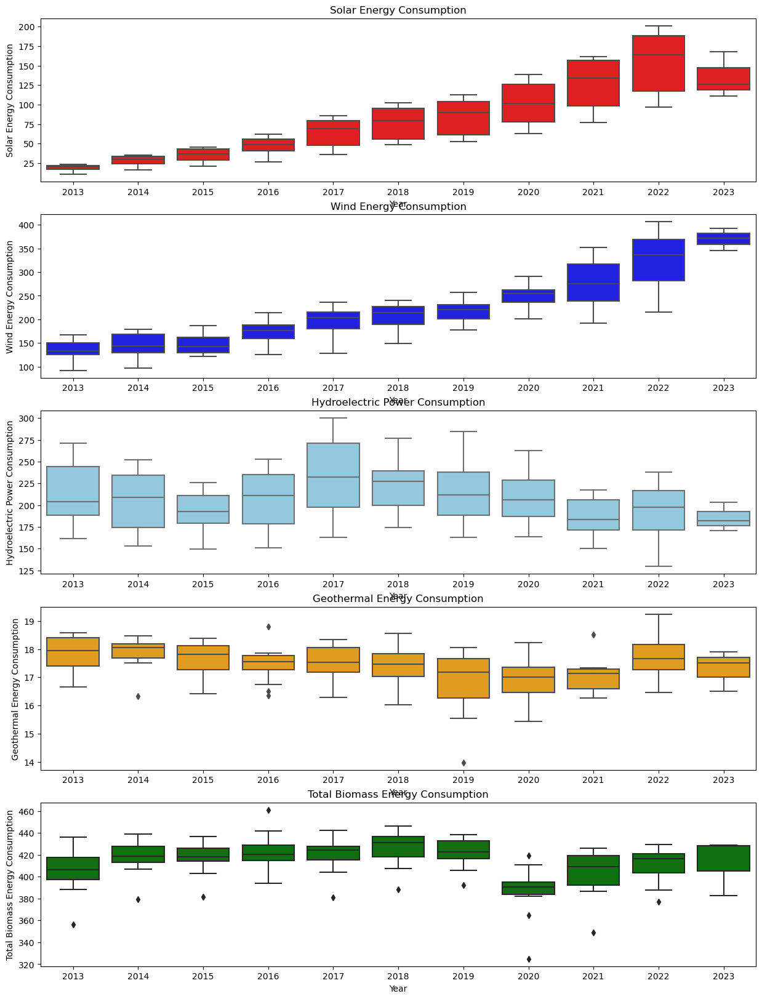

In [203]:
# create a figure with 4 subplots
fig, axes = plt.subplots(5,1, figsize=(15,20))
#plt.title('Energy consumption')

#by usuing seaborn library line graph

#each plot in separate subplot
sns.boxplot(ax=axes[0], data=df_Renewable,x='Year', y='Solar Energy Consumption', color ='red' )
axes[0].set_title('Solar Energy Consumption')

sns.boxplot(ax=axes[1], data=df_Renewable,x='Year', y='Wind Energy Consumption', color ='blue' )
axes[1].set_title('Wind Energy Consumption')

sns.boxplot(ax=axes[2], data=df_Renewable,x='Year', y='Hydroelectric Power Consumption', color ='skyblue' )
axes[2].set_title('Hydroelectric Power Consumption')

sns.boxplot(ax=axes[3], data=df_Renewable,x='Year', y='Geothermal Energy Consumption', color ='orange' )
axes[3].set_title('Geothermal Energy Consumption')

sns.boxplot(ax=axes[4], data=df_Renewable,x='Year', y='Total Biomass Energy Consumption',color ='green' )
axes[4].set_title('Total Biomass Energy Consumption')


In [204]:
df_REN_New =df_Renewable[['Month','Solar Energy Consumption','Wind Energy Consumption','Hydroelectric Power Consumption','Geothermal Energy Consumption','Total Biomass Energy Consumption']]

In [205]:
df_REN_New.head()

,Month,Solar Energy Consumption,Wind Energy Consumption,Hydroelectric Power Consumption,Geothermal Energy Consumption,Total Biomass Energy Consumption
480,2013-01-31,10.501,140.620,236.889,18.578,390.743
481,2013-02-28,12.261,134.295,194.813,16.666,356.257
482,2013-03-31,17.116,150.325,195.918,18.543,399.652
483,2013-04-30,18.712,166.741,239.451,17.376,388.467
484,2013-05-31,20.817,154.933,271.442,17.870,405.242


In [206]:
df_REN_New.reset_index(drop =True , inplace=True)

In [207]:
df_REN_New.head()

,Month,Solar Energy Consumption,Wind Energy Consumption,Hydroelectric Power Consumption,Geothermal Energy Consumption,Total Biomass Energy Consumption
0,2013-01-31,10.501,140.620,236.889,18.578,390.743
1,2013-02-28,12.261,134.295,194.813,16.666,356.257
2,2013-03-31,17.116,150.325,195.918,18.543,399.652
3,2013-04-30,18.712,166.741,239.451,17.376,388.467
4,2013-05-31,20.817,154.933,271.442,17.870,405.242


In [208]:
df_REN_New.shape

(123, 6)

In [209]:
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from sklearn.metrics import mean_squared_error

In [210]:
# 5. Dickey-Fuller Test
def test_stationarity(timeseries):
    result = adfuller(timeseries)
    if result[1] <= 0.05:
        print("Data is stationary")
    else:
        print("Data is not stationary")

test_stationarity(df_REN_New['Solar Energy Consumption'])

Data is not stationary


In [211]:
def test_stationarity_RE(timeseries):
    print('Results of Dickey-Fuller Test:')
    dftest = adfuller(timeseries, autolag='AIC')
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic', 'p-value', '#Lags Used', 'Number of Observations Used'])
    for key,value in dftest[4].items():
        dfoutput['Critical Value (%s)' % key] = value
    print(dfoutput)

for column in df_REN_New.columns:
    print(f"\nTesting stationarity of '{column}' series")
    test_stationarity_RE(df_REN_New[column])


Testing stationarity of 'Month' series
Results of Dickey-Fuller Test:
Test Statistic                  -0.299570
p-value                          0.925565
#Lags Used                      12.000000
Number of Observations Used    110.000000
Critical Value (1%)             -3.491245
Critical Value (5%)             -2.888195
Critical Value (10%)            -2.580988
dtype: float64

Testing stationarity of 'Solar Energy Consumption' series
Results of Dickey-Fuller Test:
Test Statistic                   2.001287
p-value                          0.998675
#Lags Used                      13.000000
Number of Observations Used    109.000000
Critical Value (1%)             -3.491818
Critical Value (5%)             -2.888444
Critical Value (10%)            -2.581120
dtype: float64

Testing stationarity of 'Wind Energy Consumption' series
Results of Dickey-Fuller Test:
Test Statistic                   2.631552
p-value                          0.999080
#Lags Used                      12.000000
Number

In [212]:
df_RE_diff = df_REN_New.diff().dropna()

In [213]:
for column in df_REN_New.columns:
    if column != 'Month':
        print(f"\nTesting stationarity of '{column}' series")
        test_stationarity_RE(df_RE_diff[column])


Testing stationarity of 'Solar Energy Consumption' series
Results of Dickey-Fuller Test:
Test Statistic                  -1.679320
p-value                          0.441798
#Lags Used                      13.000000
Number of Observations Used    108.000000
Critical Value (1%)             -3.492401
Critical Value (5%)             -2.888697
Critical Value (10%)            -2.581255
dtype: float64

Testing stationarity of 'Wind Energy Consumption' series
Results of Dickey-Fuller Test:
Test Statistic                  -3.661129
p-value                          0.004694
#Lags Used                      13.000000
Number of Observations Used    108.000000
Critical Value (1%)             -3.492401
Critical Value (5%)             -2.888697
Critical Value (10%)            -2.581255
dtype: float64

Testing stationarity of 'Hydroelectric Power Consumption' series
Results of Dickey-Fuller Test:
Test Statistic                  -4.282504
p-value                          0.000476
#Lags Used            

In [214]:
df_solar_diff2 = df_REN_New['Solar Energy Consumption'].diff().diff().dropna()


In [215]:
test_stationarity(df_solar_diff2)

Data is stationary



ACF and PACF plots for differenced 'Wind Energy Consumption' series


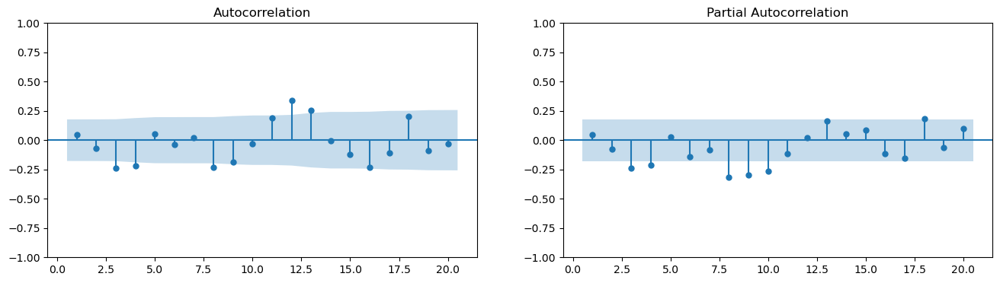


ACF and PACF plots for differenced 'Hydroelectric Power Consumption' series


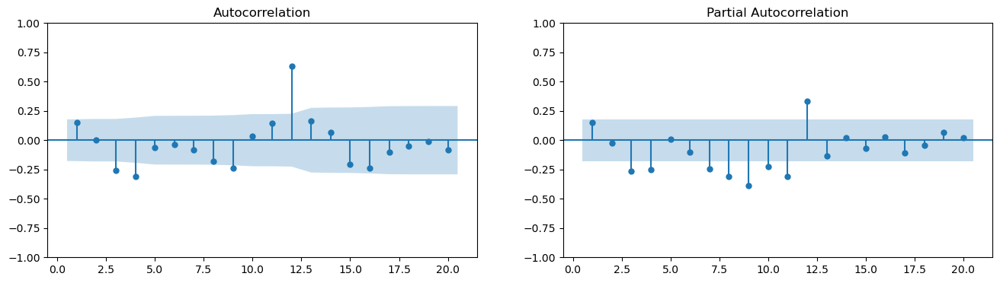


ACF and PACF plots for differenced 'Geothermal Energy Consumption' series


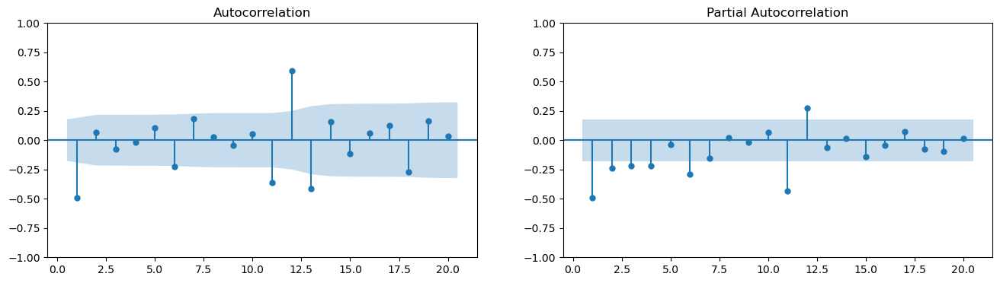


ACF and PACF plots for differenced 'Total Biomass Energy Consumption' series


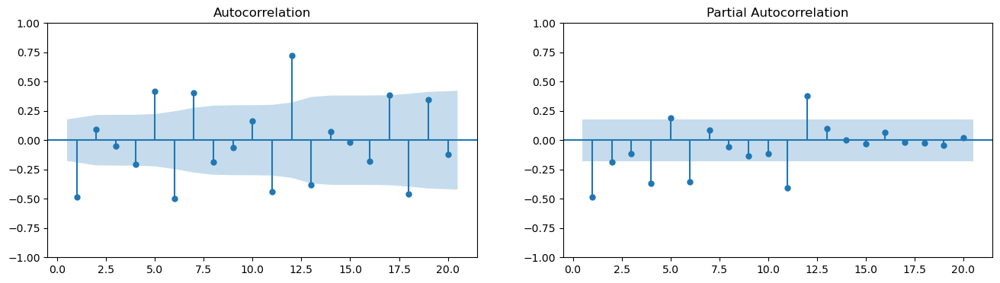

In [216]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

# Generate ACF and PACF plots for each series
for column in df_RE_diff.columns:
    if column != 'Month' and column != 'Solar Energy Consumption' :
        print(f"\nACF and PACF plots for differenced '{column}' series")
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 4))

        plot_acf(df_RE_diff[column], lags=20, zero=False, ax=ax1)
        plot_pacf(df_RE_diff[column], lags=20, zero=False, ax=ax2)

        plt.show()

In [217]:
df_solar_diff2.head()

2    3.095
3   -3.259
4    0.509
5   -0.857
6   -0.962
Name: Solar Energy Consumption, dtype: float64


ACF and PACF plots for differenced Solar series


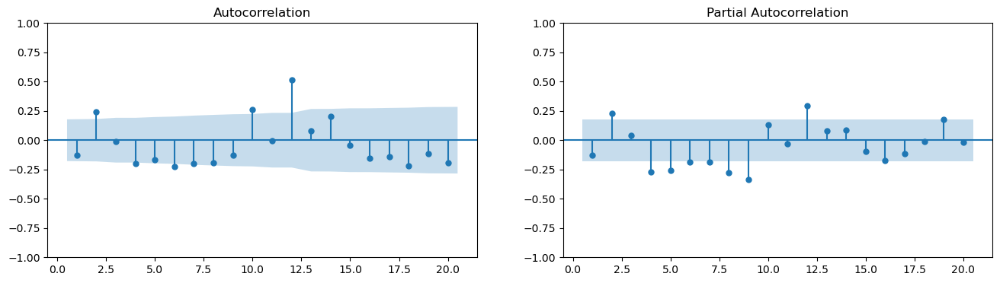

In [218]:
print("\nACF and PACF plots for differenced Solar series")
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 4))

plot_acf(df_solar_diff2, lags=20, zero=False, ax=ax1)
plot_pacf(df_solar_diff2, lags=20, zero=False, ax=ax2)

plt.show()

In [219]:
import matplotlib.pyplot as plt
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error
from math import sqrt

# Define a list of ARIMA orders to try
orders = [(1, 1, 1), (1,1, 2), (2,1, 1), (2, 1, 2),(0, 1, 1),(0, 1, 2),(1,1,0),(2,1,0)]

# Define a function to fit an ARIMA model and compute the RMSE
def compute_rmse(data, order):
    # Split the data into training and testing sets
    train_size = int(len(data) * 0.8)
    train, test = data[0:train_size], data[train_size:len(data)]

    # Fit the model
    model = ARIMA(train, order=order)
    model_fit = model.fit()

    # Make predictions (in-sample + out-of-sample forecasting)
    forecast = model_fit.forecast(steps=len(test))

    # Compute the root mean squared error (RMSE)
    rmse = sqrt(mean_squared_error(test, forecast))
    return rmse, forecast, test

# Define a function to plot actual vs predicted values
def plot_predictions(test, predictions, column, order, rmse):
    plt.figure(figsize=(12, 6))
    plt.plot(test.index, test.values, label='Actual')
    plt.plot(test.index, predictions, color='red', label='Predicted')
    plt.legend()
    plt.title(f'{column} - ARIMA{order} - RMSE: {rmse}')
    plt.show()




ARIMA Results for Month:
Failed to fit ARIMA(1, 1, 1) for Month. Reason: ufunc 'subtract' cannot use operands with types dtype('<m8[ns]') and dtype('O')
Failed to fit ARIMA(1, 1, 2) for Month. Reason: ufunc 'subtract' cannot use operands with types dtype('<m8[ns]') and dtype('O')
Failed to fit ARIMA(2, 1, 1) for Month. Reason: ufunc 'subtract' cannot use operands with types dtype('<m8[ns]') and dtype('O')
Failed to fit ARIMA(2, 1, 2) for Month. Reason: ufunc 'subtract' cannot use operands with types dtype('<m8[ns]') and dtype('O')
Failed to fit ARIMA(0, 1, 1) for Month. Reason: ufunc 'subtract' cannot use operands with types dtype('<m8[ns]') and dtype('O')
Failed to fit ARIMA(0, 1, 2) for Month. Reason: ufunc 'subtract' cannot use operands with types dtype('<m8[ns]') and dtype('O')
Failed to fit ARIMA(1, 1, 0) for Month. Reason: ufunc 'subtract' cannot use operands with types dtype('<m8[ns]') and dtype('O')
Failed to fit ARIMA(2, 1, 0) for Month. Reason: ufunc 'subtract' cannot use op

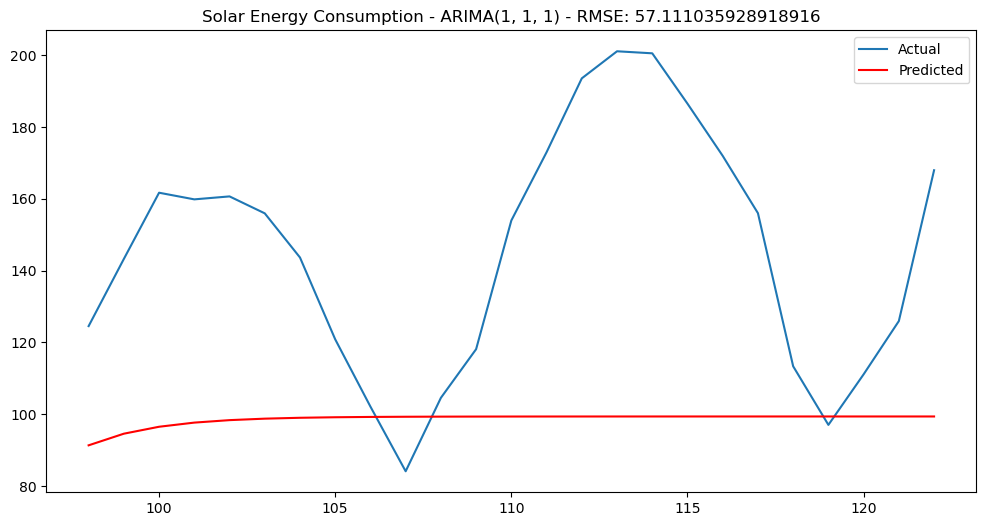

ARIMA(1, 1, 2) RMSE: 64.95934747056576


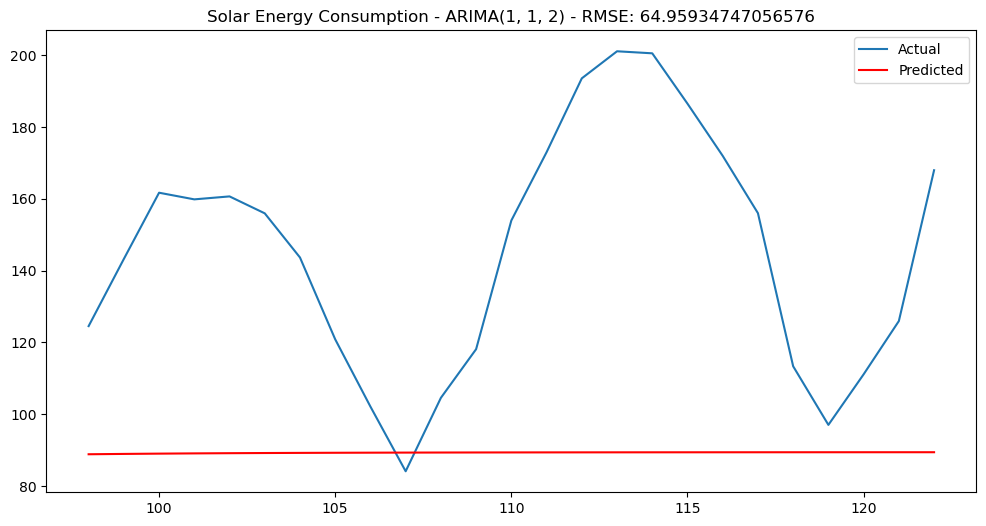

ARIMA(2, 1, 1) RMSE: 56.31471910444944


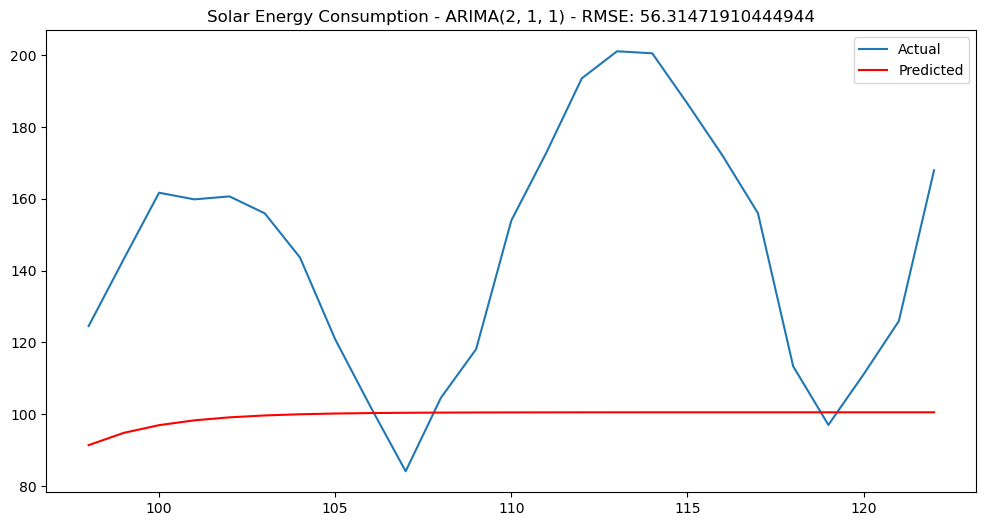

ARIMA(2, 1, 2) RMSE: 42.94084340378297


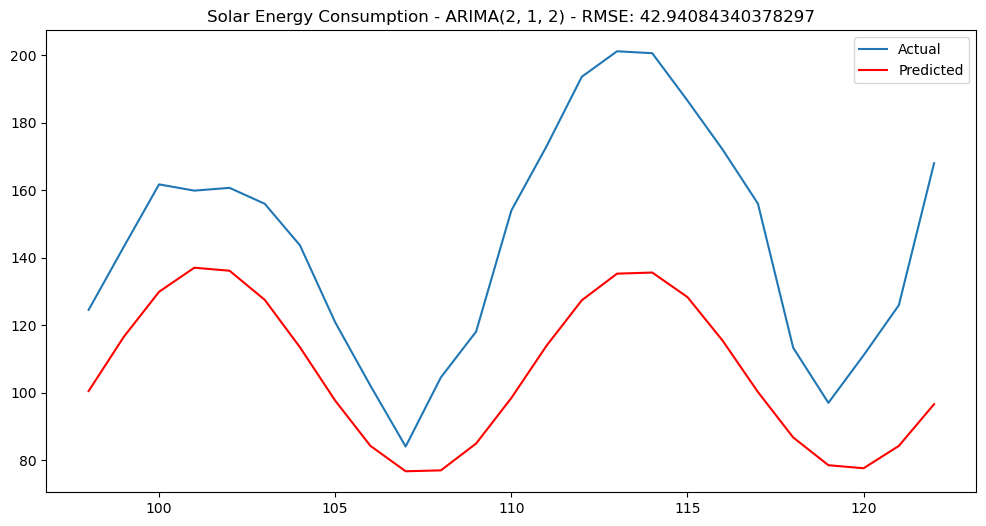

ARIMA(0, 1, 1) RMSE: 65.4733872892413


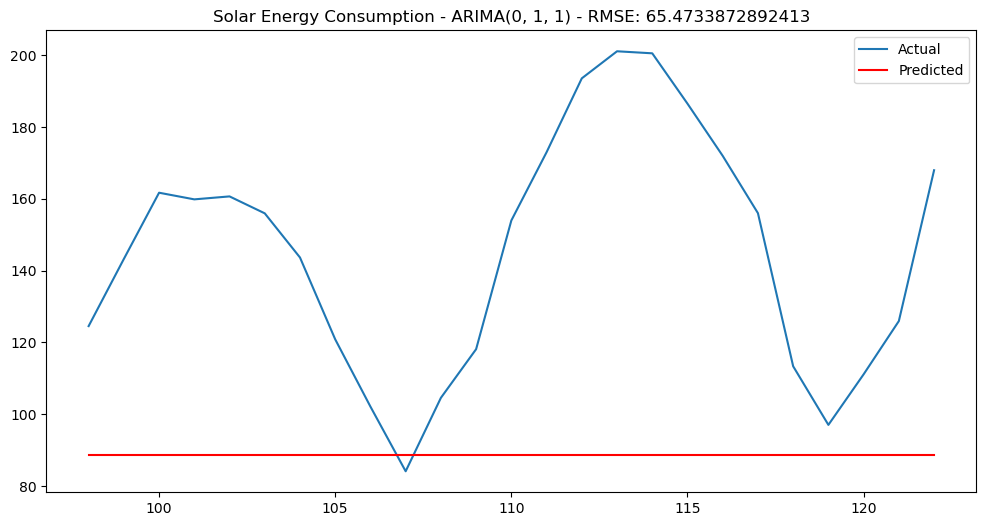

ARIMA(0, 1, 2) RMSE: 62.28011702901929


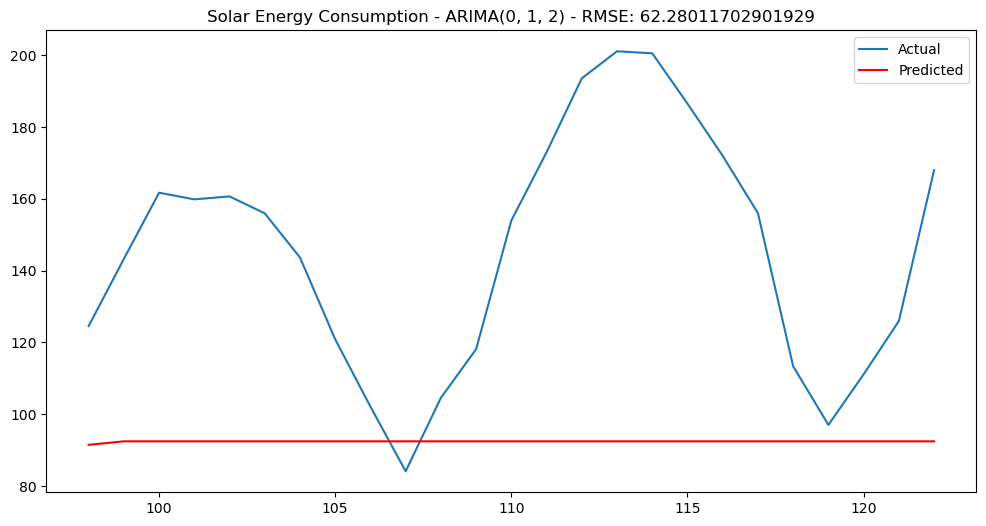

ARIMA(1, 1, 0) RMSE: 56.267780042151514


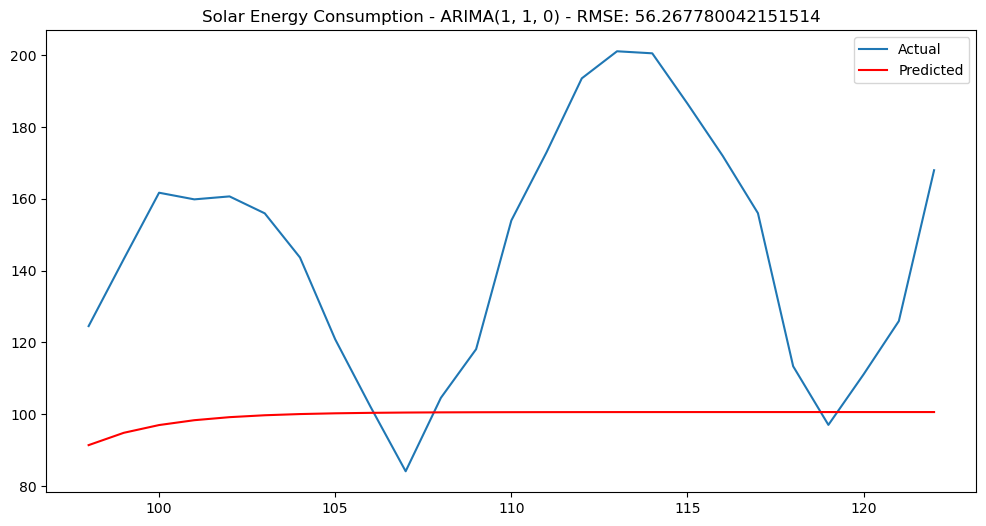

ARIMA(2, 1, 0) RMSE: 57.93543047126761


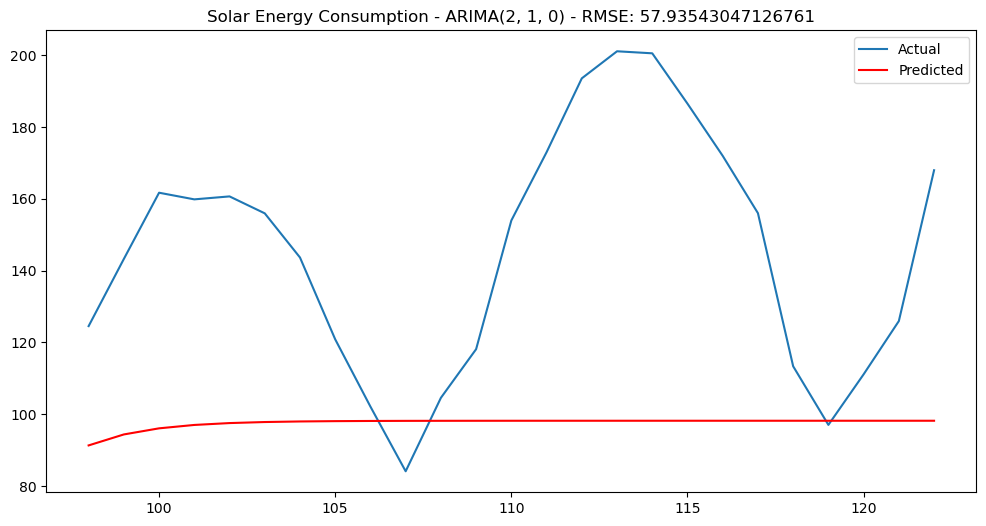


ARIMA Results for Wind Energy Consumption:
ARIMA(1, 1, 1) RMSE: 92.58127968991478


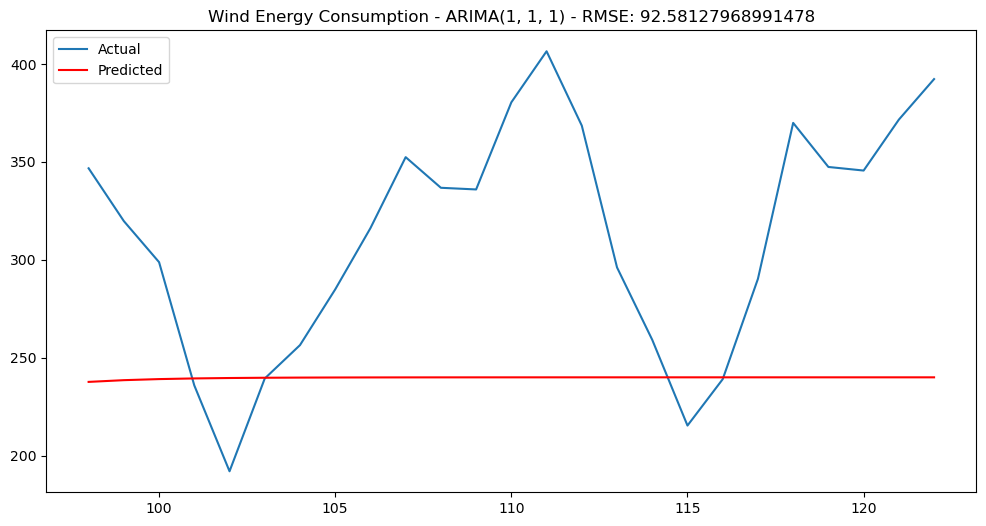

ARIMA(1, 1, 2) RMSE: 92.18844740180401


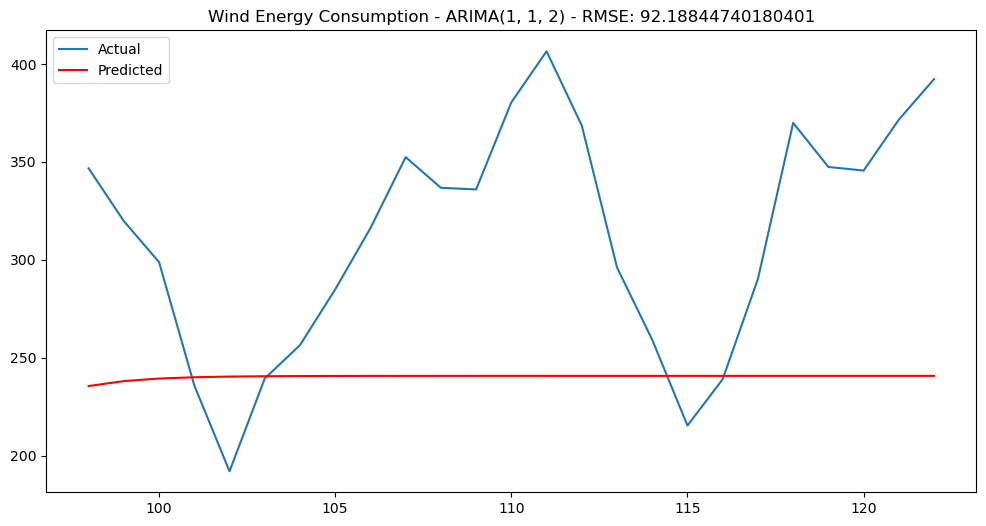

ARIMA(2, 1, 1) RMSE: 91.7799671309936


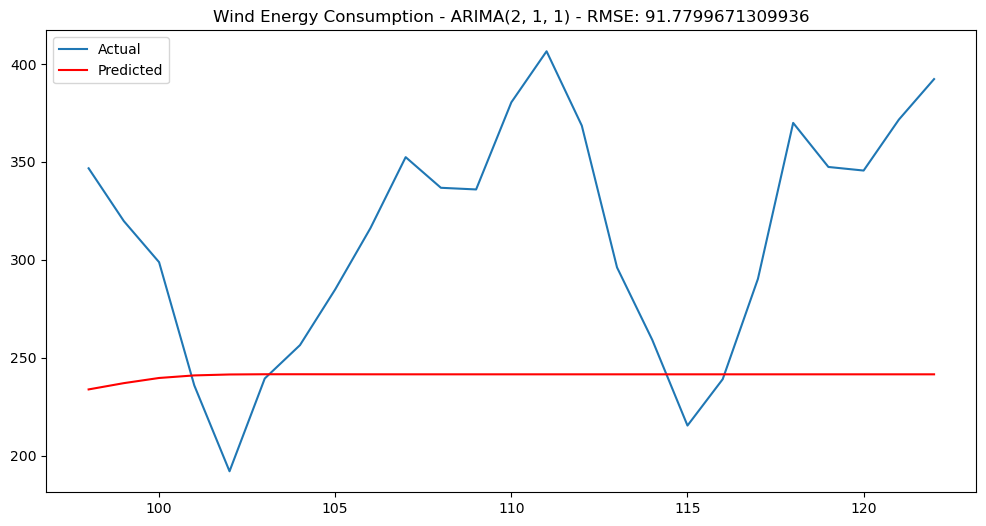

ARIMA(2, 1, 2) RMSE: 94.97866800655616


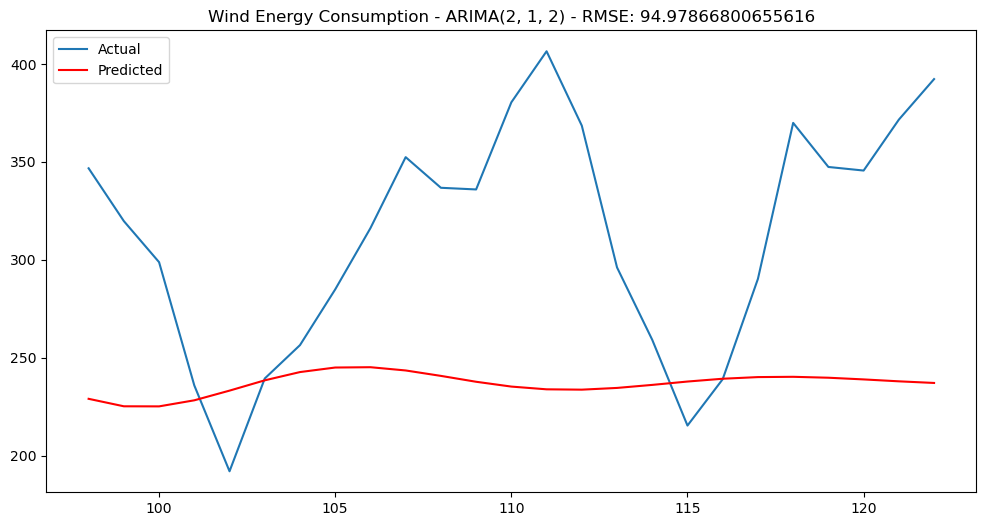

ARIMA(0, 1, 1) RMSE: 93.84773305453174


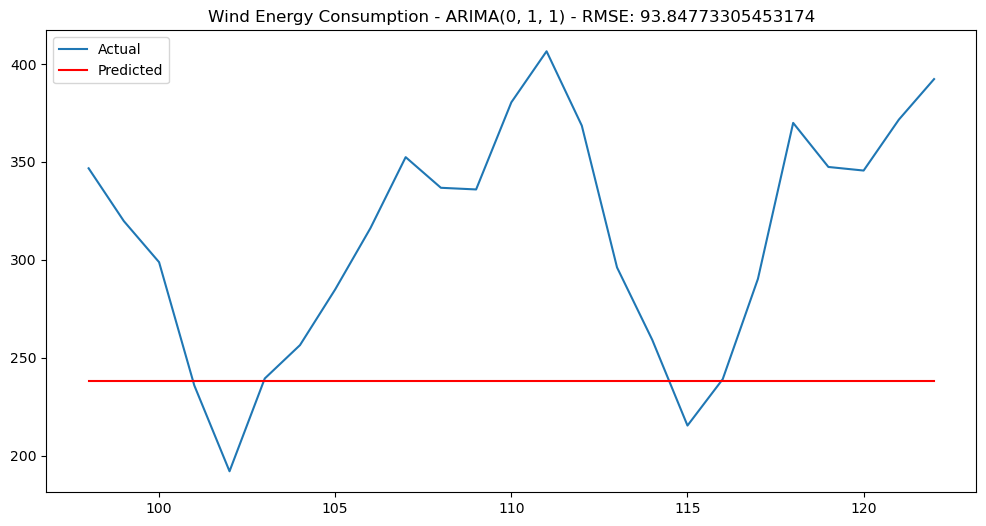

ARIMA(0, 1, 2) RMSE: 87.45711702027491


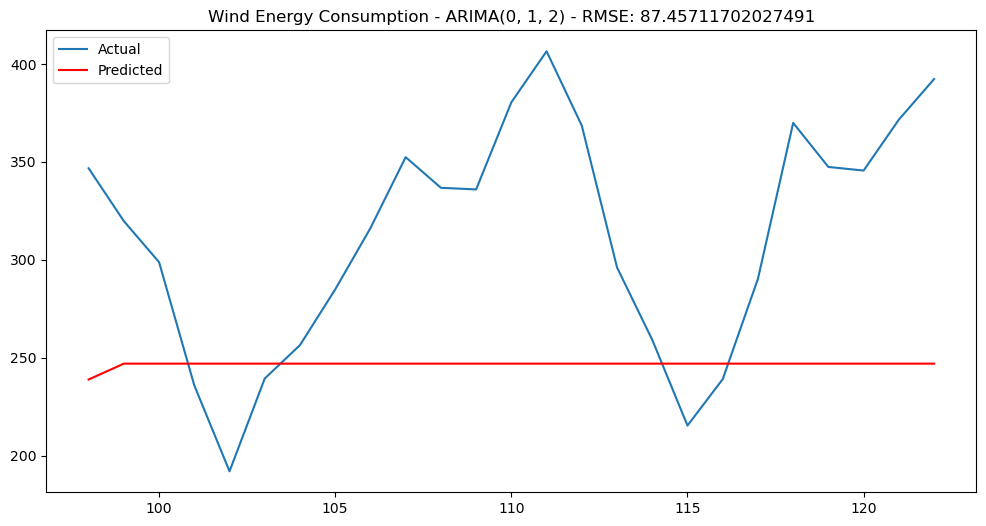

ARIMA(1, 1, 0) RMSE: 94.1410398226842


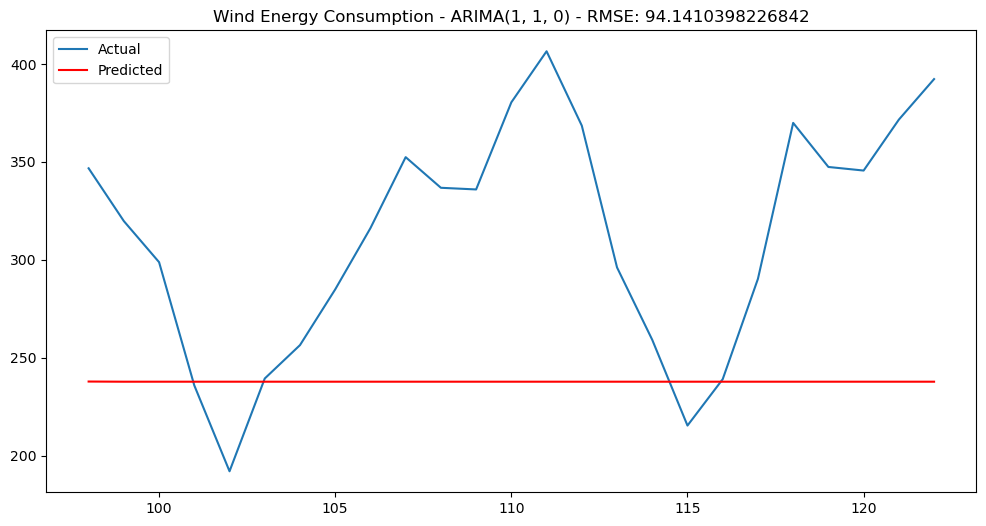

ARIMA(2, 1, 0) RMSE: 92.71106828303004


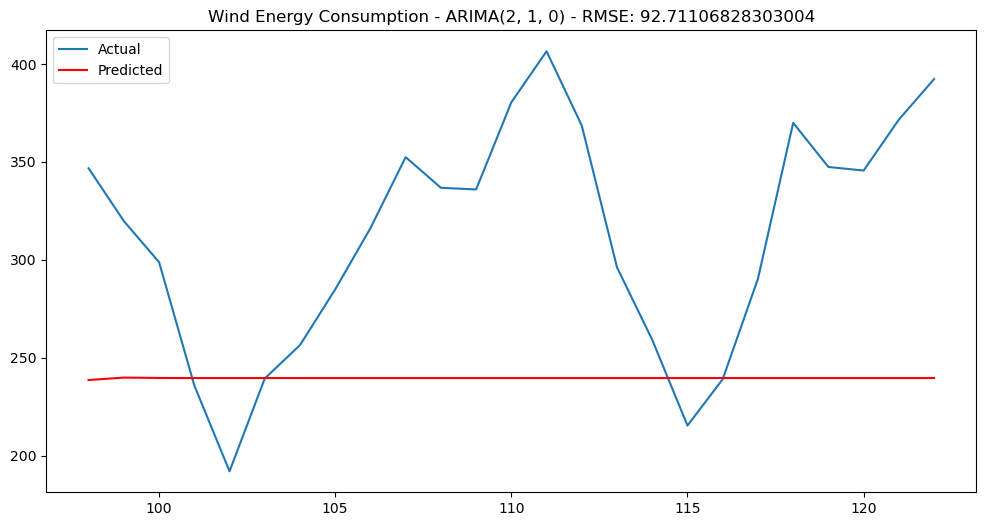


ARIMA Results for Hydroelectric Power Consumption:
ARIMA(1, 1, 1) RMSE: 33.352896559120964


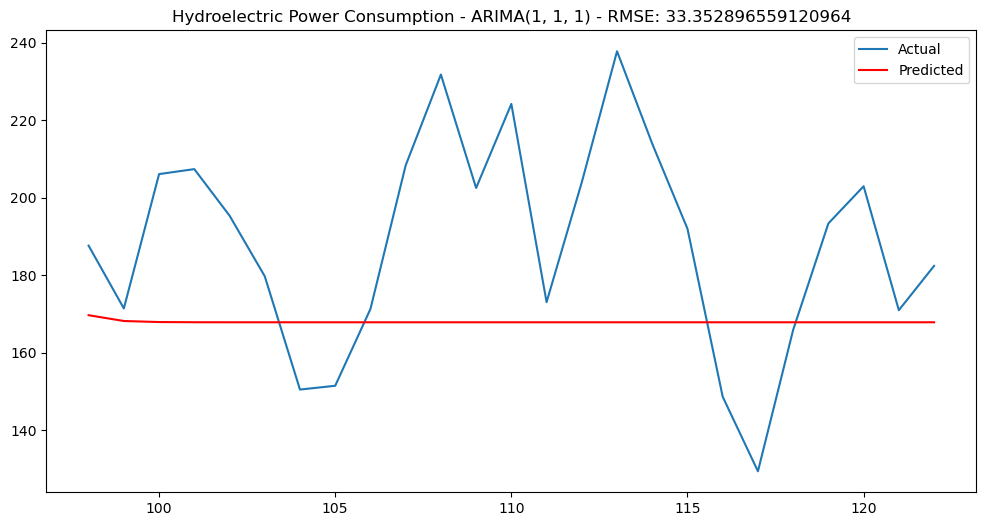

ARIMA(1, 1, 2) RMSE: 33.70188203954461


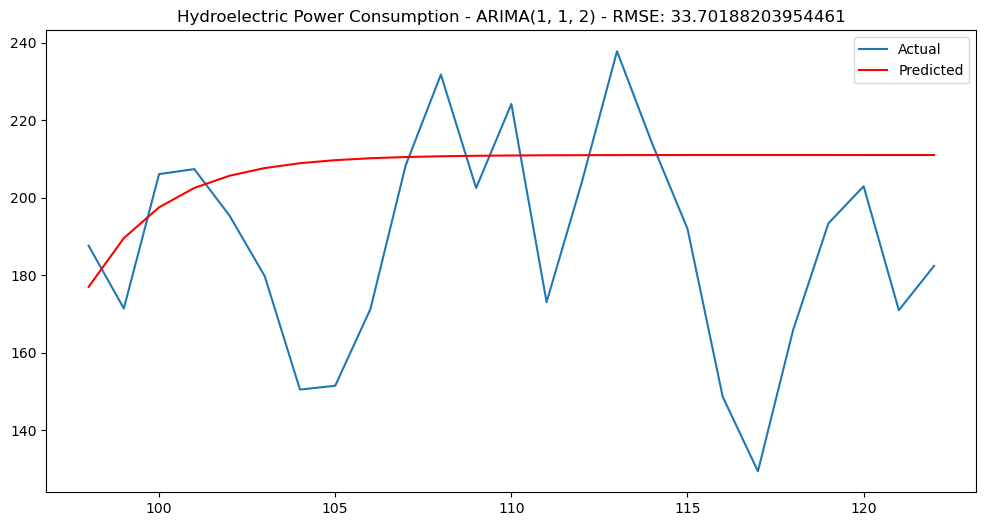

ARIMA(2, 1, 1) RMSE: 33.45701947998675


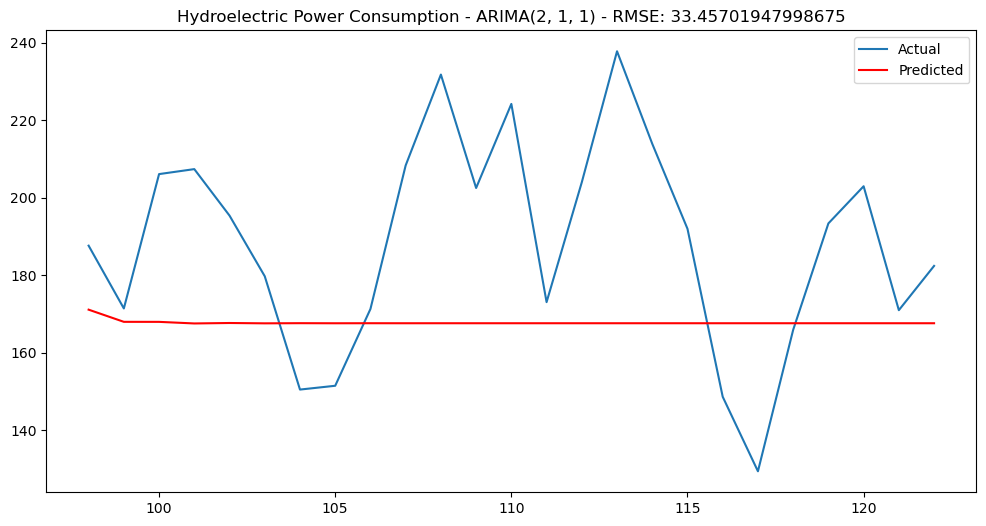

ARIMA(2, 1, 2) RMSE: 28.690422786141326


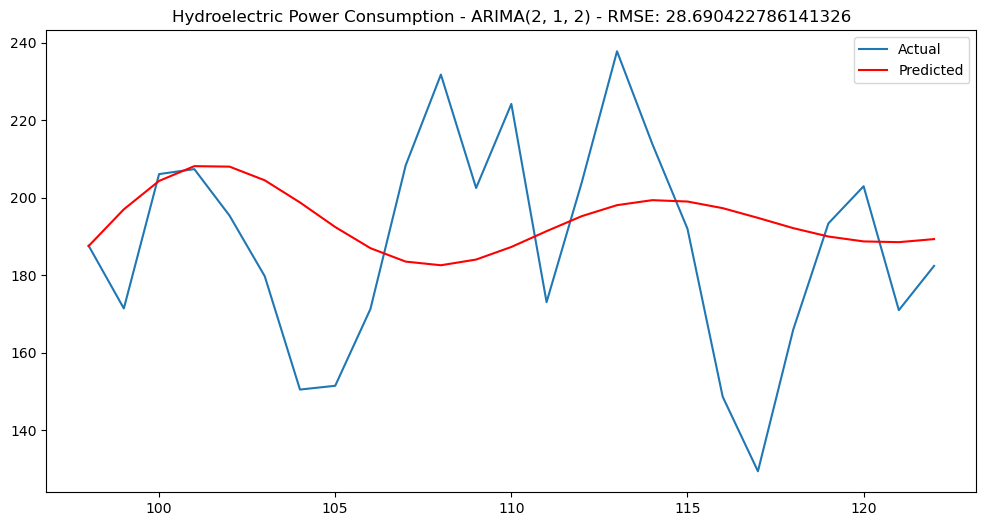

ARIMA(0, 1, 1) RMSE: 32.39478440633614


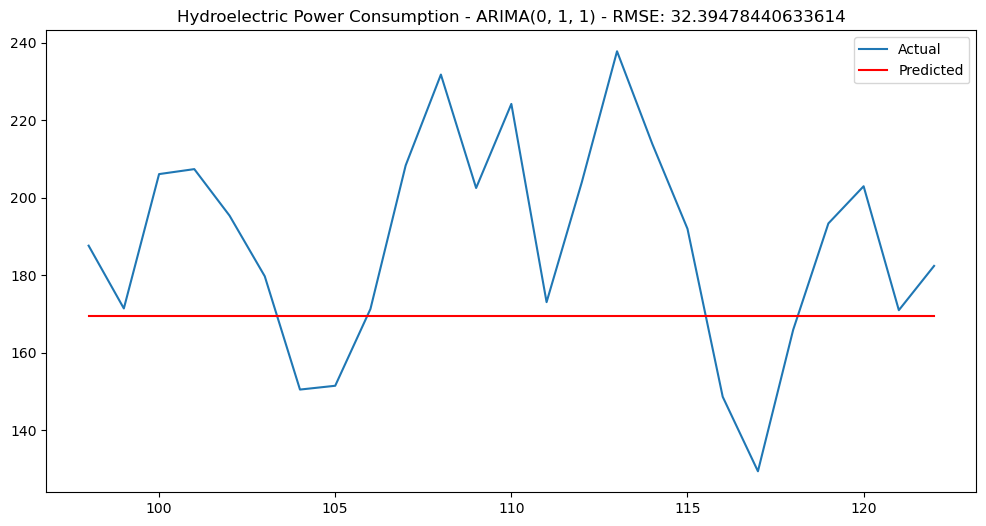

ARIMA(0, 1, 2) RMSE: 35.52399752282555


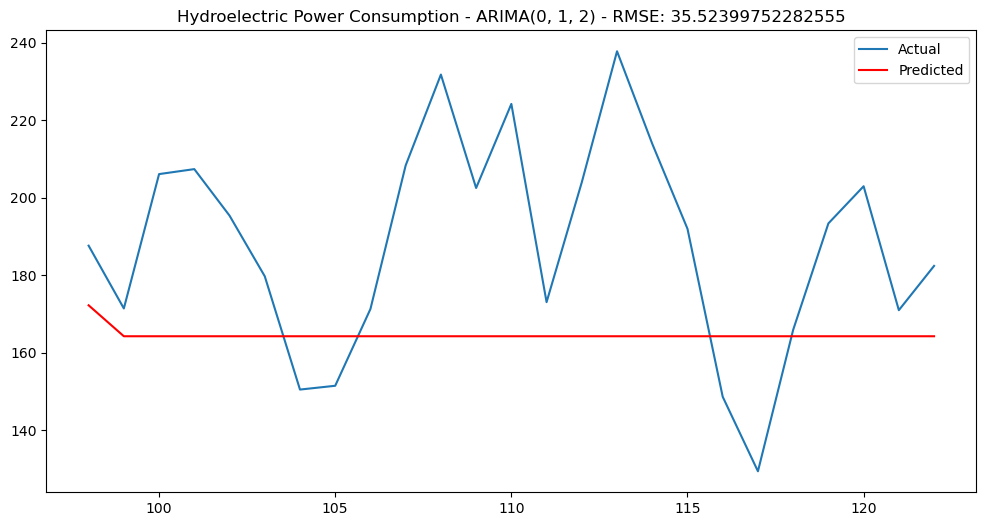

ARIMA(1, 1, 0) RMSE: 33.378961318338106


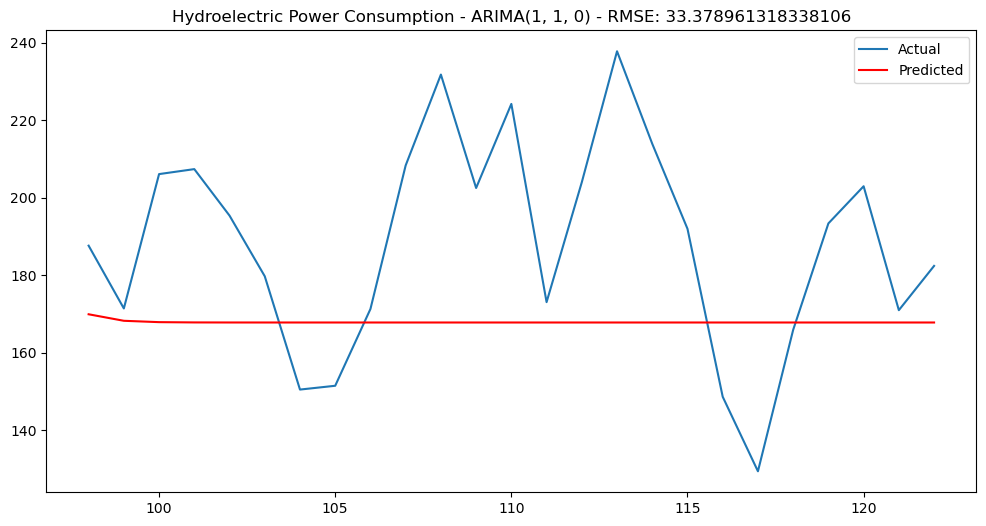

ARIMA(2, 1, 0) RMSE: 33.27201854713847


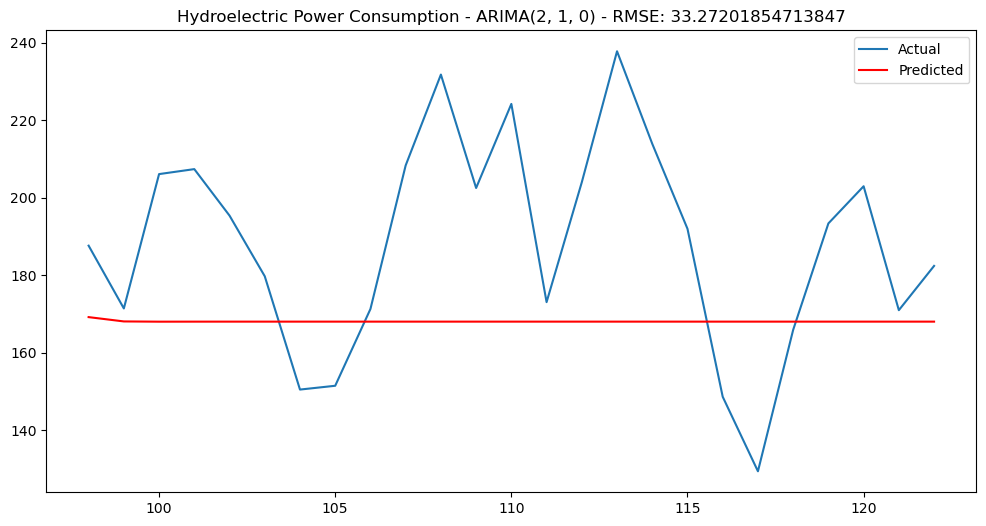


ARIMA Results for Geothermal Energy Consumption:
ARIMA(1, 1, 1) RMSE: 0.9556384503423774


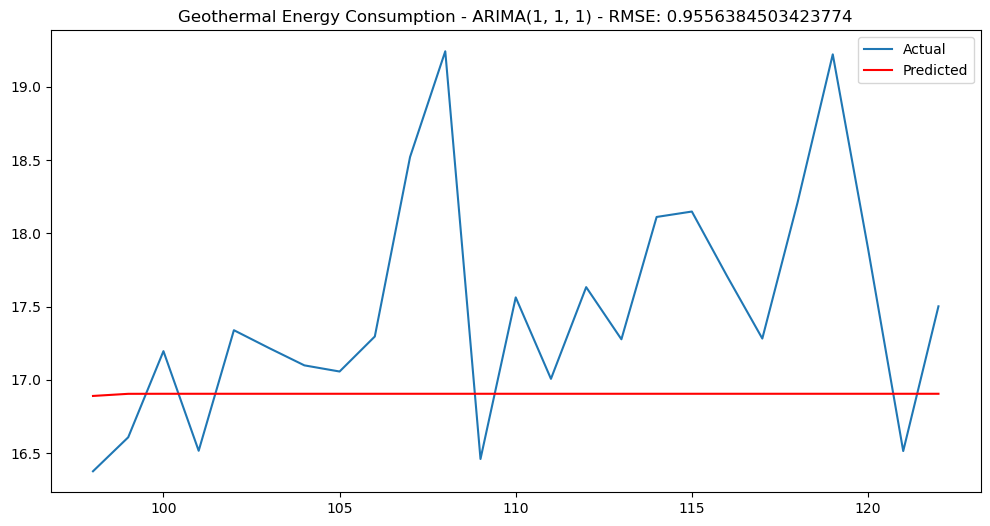

ARIMA(1, 1, 2) RMSE: 0.9563374959505532


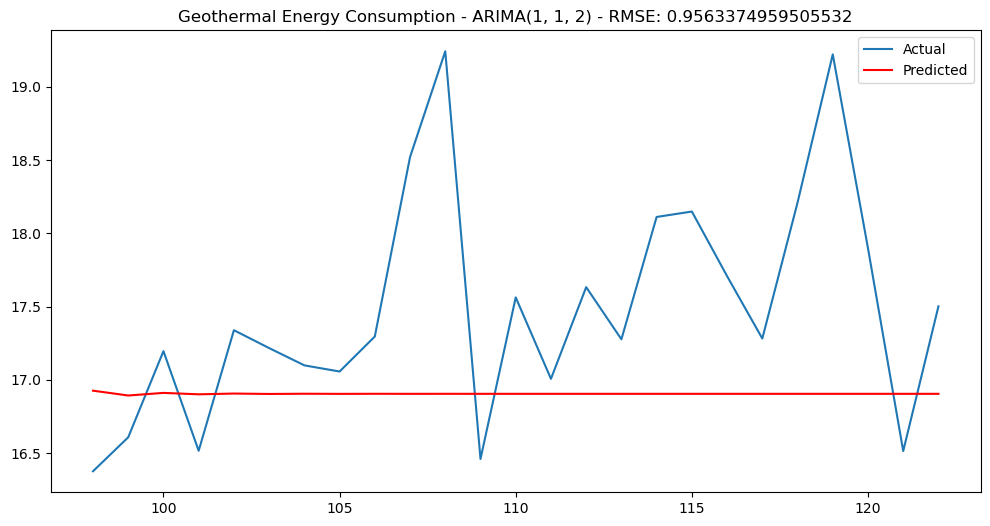

ARIMA(2, 1, 1) RMSE: 0.9446000619951722


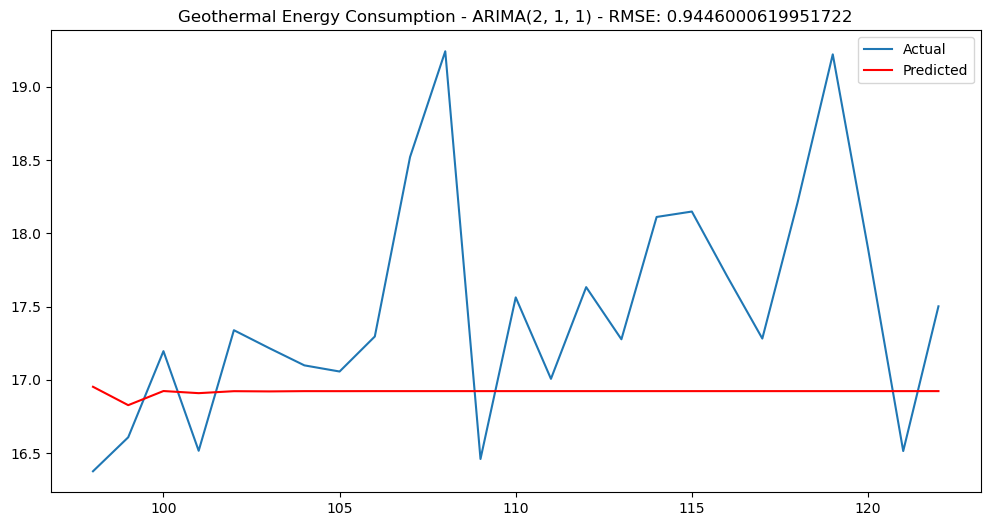

ARIMA(2, 1, 2) RMSE: 0.9461972215562959


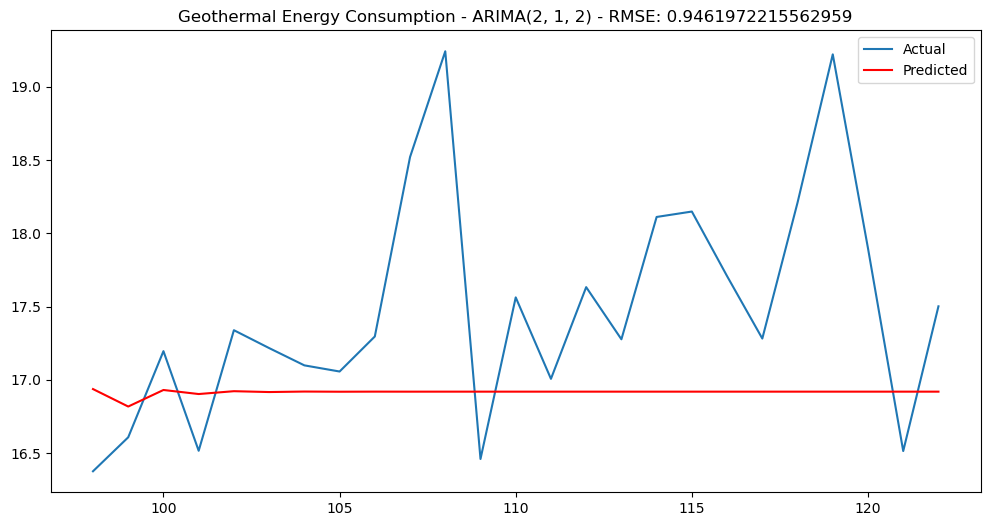

ARIMA(0, 1, 1) RMSE: 0.9562465348468802


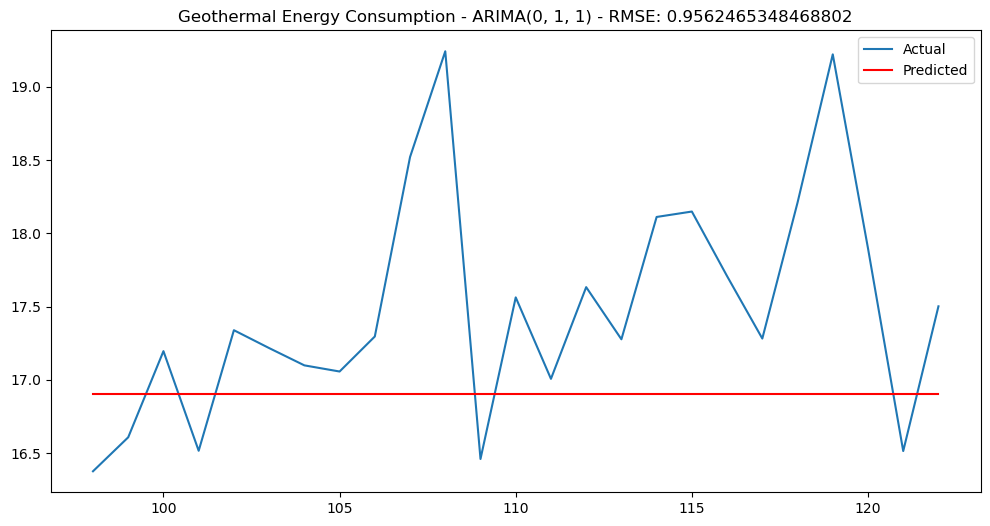

ARIMA(0, 1, 2) RMSE: 0.9558249743083382


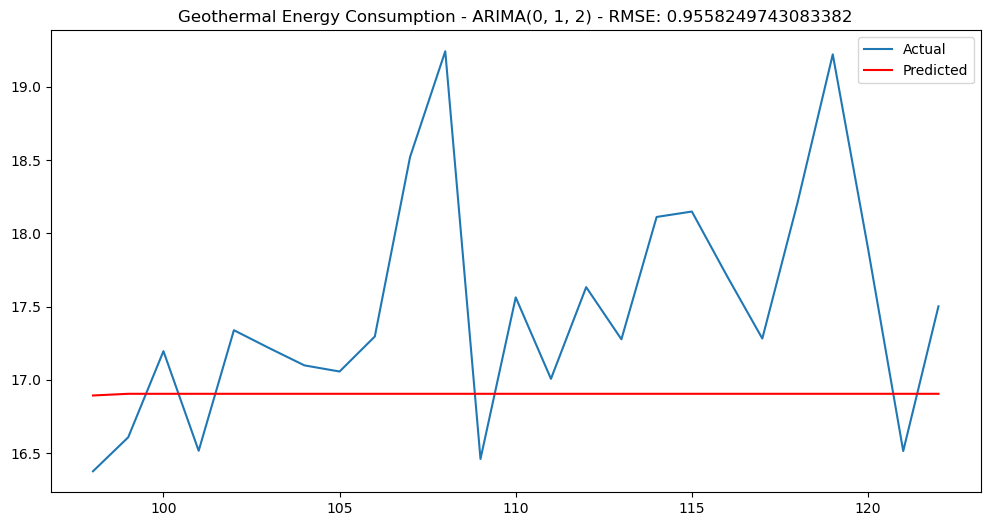

ARIMA(1, 1, 0) RMSE: 1.1444733625525398


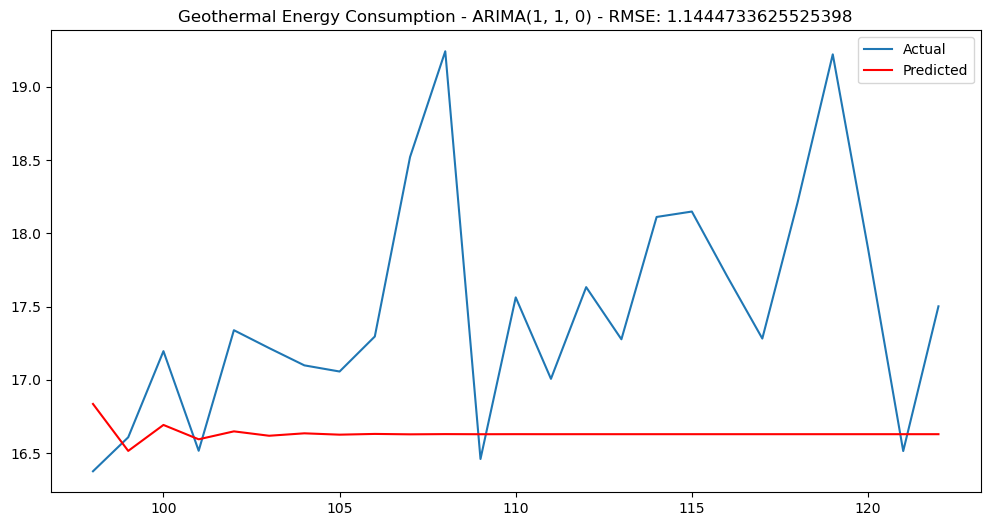

ARIMA(2, 1, 0) RMSE: 1.028870675442578


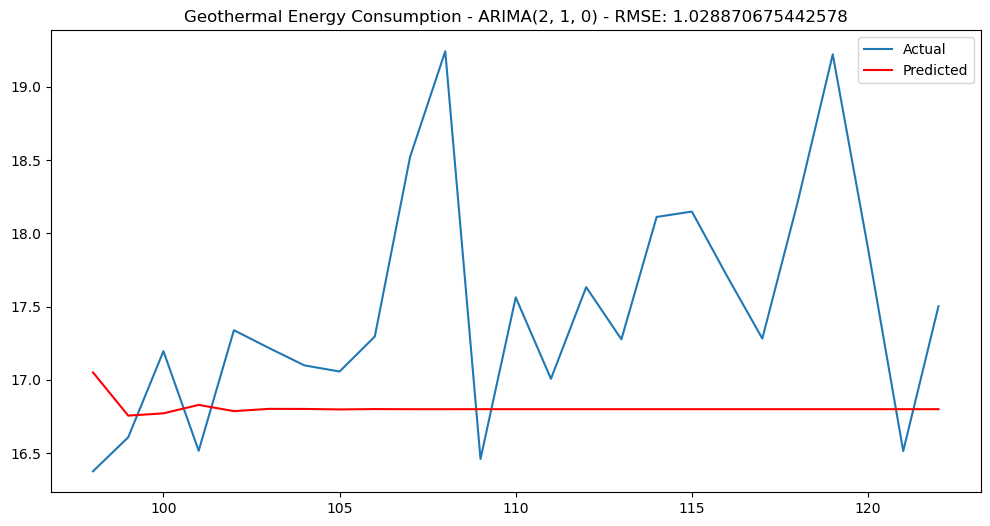


ARIMA Results for Total Biomass Energy Consumption:
ARIMA(1, 1, 1) RMSE: 32.0826294019657


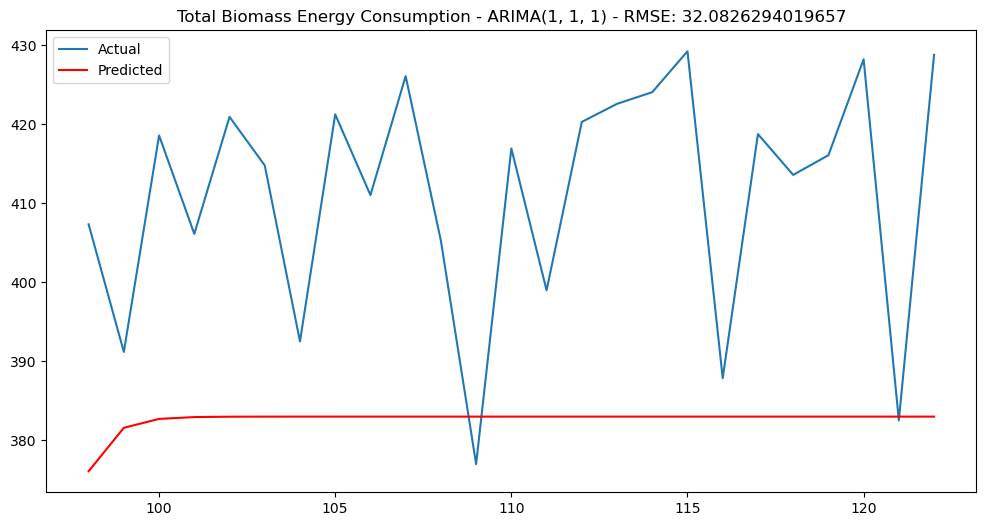

ARIMA(1, 1, 2) RMSE: 33.28174864661995


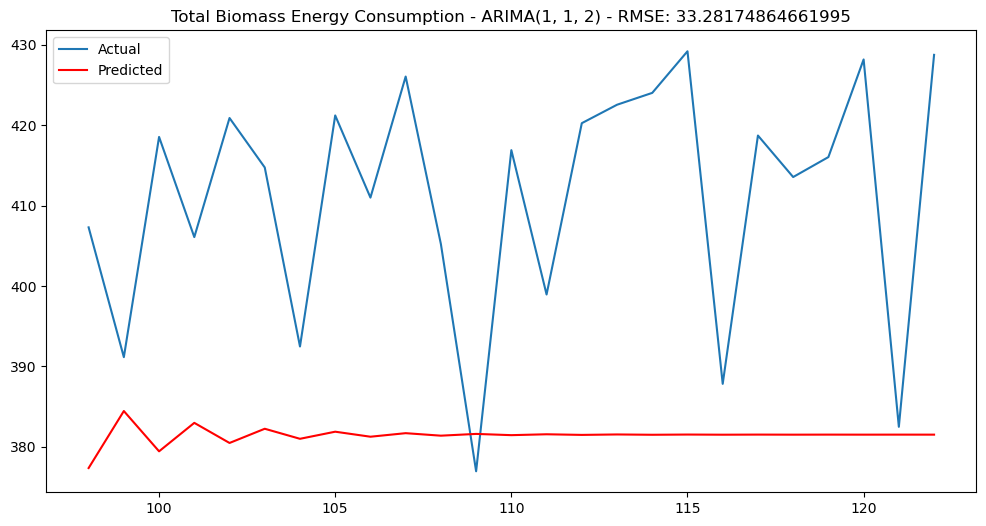

ARIMA(2, 1, 1) RMSE: 31.314307587766454


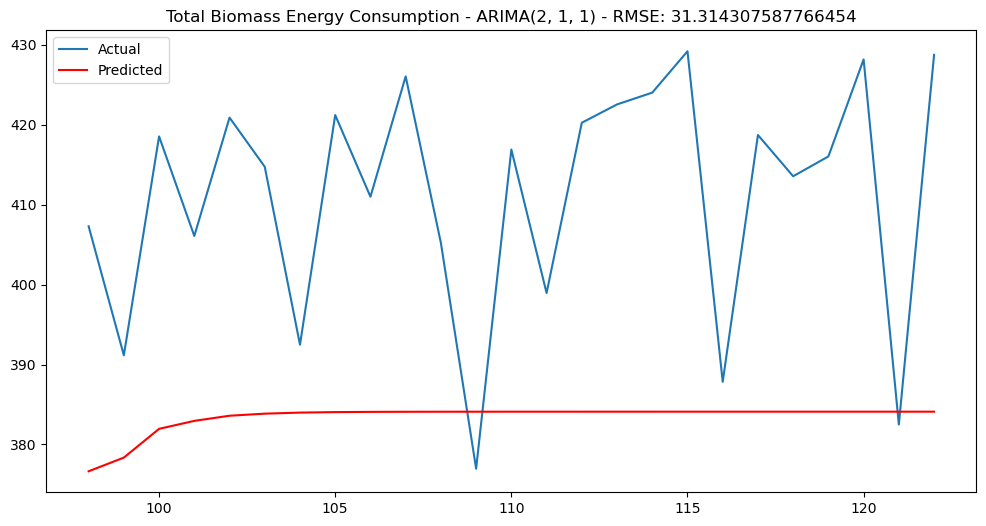

ARIMA(2, 1, 2) RMSE: 31.47066346793496


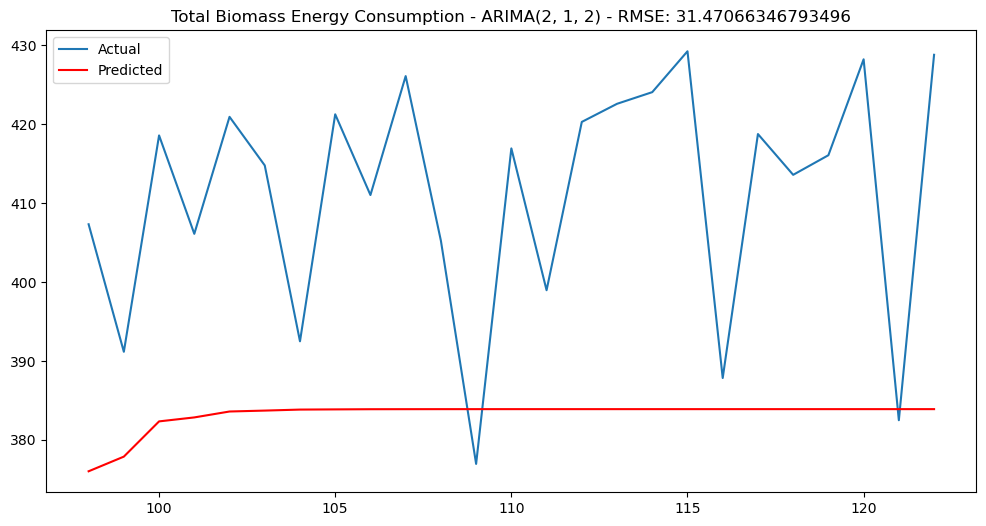

ARIMA(0, 1, 1) RMSE: 34.70810774351902


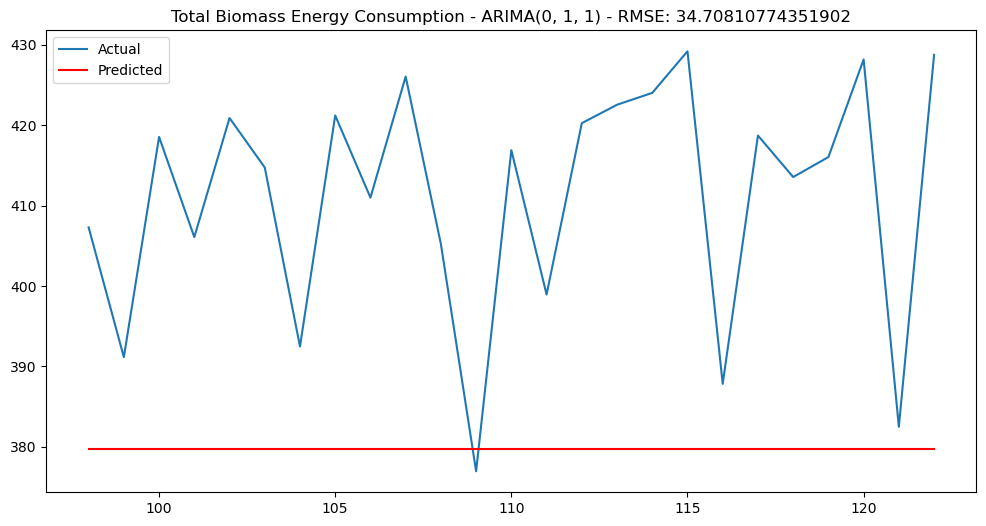

ARIMA(0, 1, 2) RMSE: 32.79742455313511


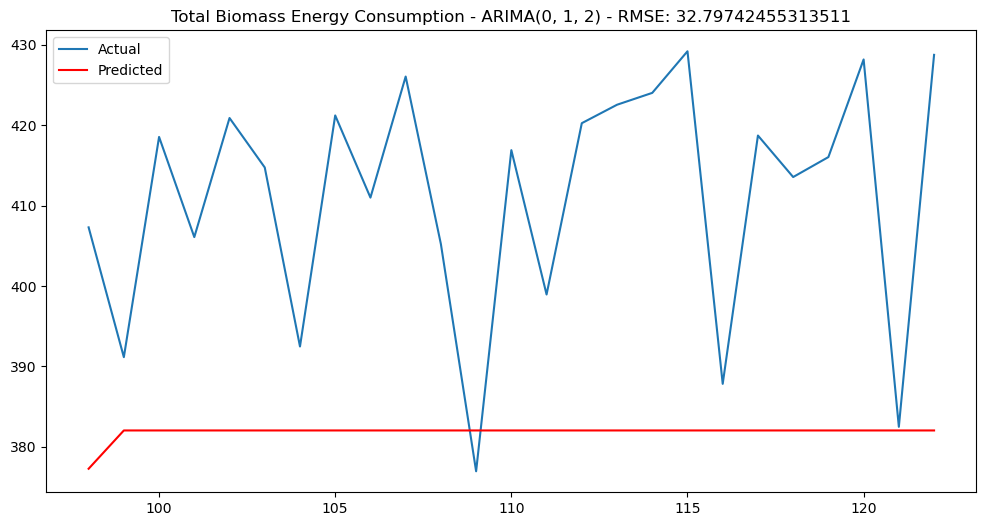

ARIMA(1, 1, 0) RMSE: 52.411495353203996


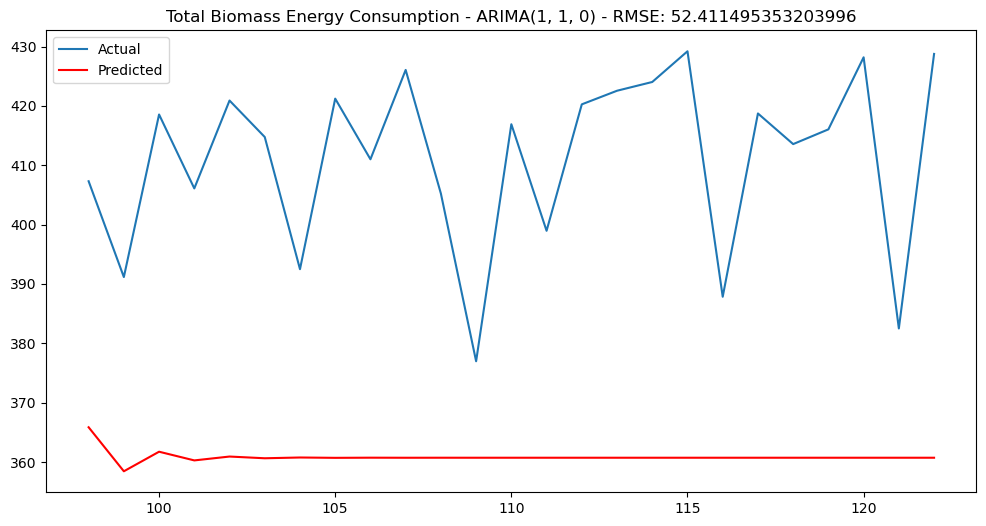

ARIMA(2, 1, 0) RMSE: 46.9924282425302


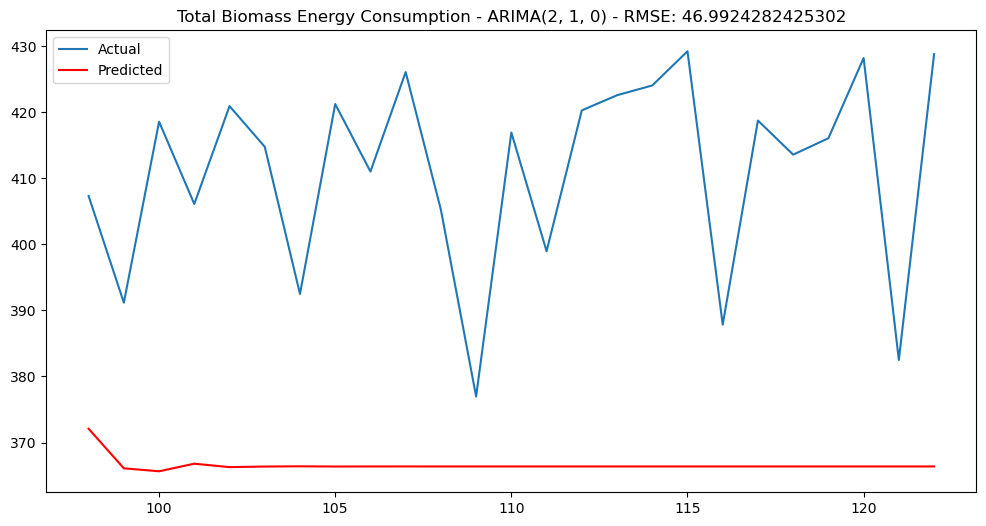

In [220]:
# Evaluate all combinations
for column in df_REN_New.columns:
    print(f'\nARIMA Results for {column}:')
    for order in orders:
        try:
            rmse, predictions, test = compute_rmse(df_REN_New[column], order)
            print(f'ARIMA{order} RMSE: {rmse}')
            plot_predictions(test, predictions, column, order, rmse)
        except Exception as e:
            print(f'Failed to fit ARIMA{order} for {column}. Reason: {str(e)}')



In [221]:
from pmdarima import auto_arima
import matplotlib.pyplot as plt
import numpy as np

def fit_and_plot_sarima(data, column, seasonal_period=12):
    """
    Fit and plot a SARIMA model for a given column (sector) in the data.
    
    Parameters:
    - data: DataFrame containing the time series data.
    - column: The column (sector) to model.
    - seasonal_period: The seasonal period for the SARIMA model.
    
    Returns:
    - best_model: The trained SARIMA model.
    """
    
    # Difference the data to make it stationary
    data_diff = data[column].diff().dropna()

    # Fit the SARIMA model on the differenced data
    best_model = auto_arima(data_diff, seasonal=True, m=seasonal_period, trace=True, error_action='ignore', suppress_warnings=True, stepwise=True)
    print(best_model.summary())

    # Split the data for visualization (using 80% as the training set)
    train_size = int(len(data[column]) * 0.8)
    train, test = data[column][0:train_size], data[column][train_size:len(data[column])]

    # Predict the differences using the best model
    predictions = best_model.predict(n_periods=len(test))

    # Revert the differencing to get predictions on the original scale
   # predictions = np.r_[train.iloc[-1], train.iloc[-1] + np.cumsum(differenced_predictions)].astype(float)[1:]

    # Plot the results
    plt.figure(figsize=(12, 6))
    plt.plot(train.index, train, label="Train")
    plt.plot(test.index, test, label="Test")
    plt.plot(test.index, predictions, color='red', label="Predictions")
    plt.title(f"SARIMA Predictions vs Actual for {column}")
    plt.legend()
    plt.show()
    
    return best_model

# Example usage:
# fit_and_plot_sarima(df_merged, 'sector_name_here')


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=0.49 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=709.194, Time=0.01 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=698.612, Time=0.09 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=701.890, Time=0.07 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=707.210, Time=0.01 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=707.394, Time=0.03 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=699.142, Time=0.25 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=699.556, Time=0.16 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=701.978, Time=0.11 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=inf, Time=0.86 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=696.863, Time=0.06 sec
 ARIMA(0,0,0)(2,1,0)[12] intercept   : AIC=698.129, Time=0.18 sec
 ARIMA(0,0,0)(1,1,1)[12] intercept   : AIC=698.250, Time=0.16 sec
 ARIMA(0,0,0)(0,1,1)[12] intercept   : AIC=700.467, Time=0.07 sec
 ARIMA(0,0,0)(2,1,1)[12] intercept   : AI

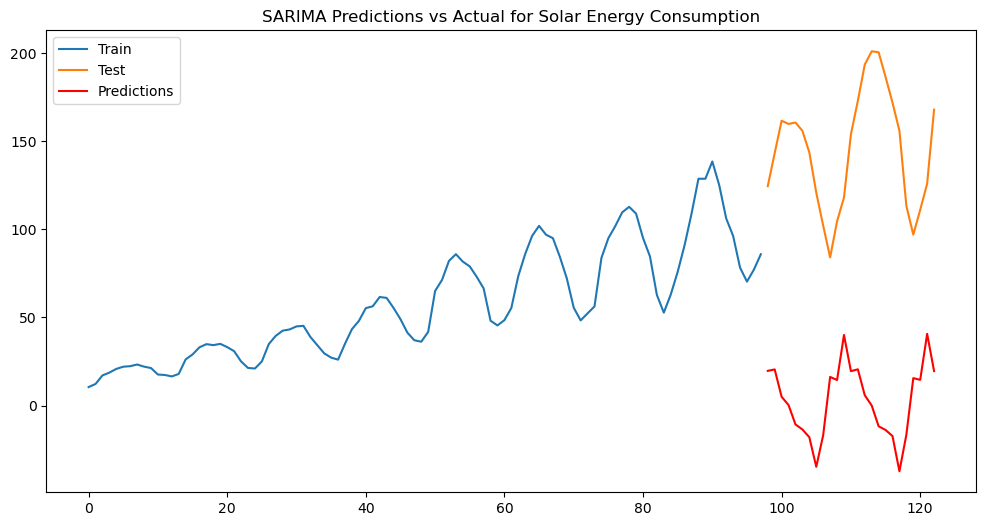

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1180.097, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1162.075, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1171.220, Time=0.06 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1178.673, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1181.796, Time=0.02 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=1151.145, Time=0.17 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=1140.795, Time=0.33 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1138.821, Time=0.17 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=1171.388, Time=0.05 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=1140.795, Time=0.39 sec
 ARIMA(1,0,0)(0,0,2)[12] intercept   : AIC=1167.356, Time=0.18 sec
 ARIMA(1,0,0)(2,0,2)[12] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept

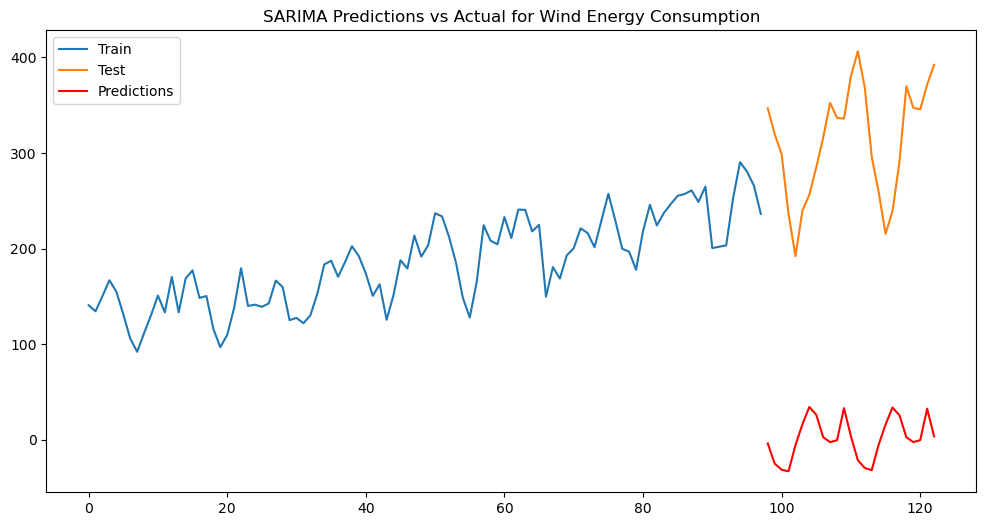

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=1064.903, Time=0.38 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1144.817, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1063.805, Time=0.06 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1099.560, Time=0.07 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1142.853, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1143.959, Time=0.04 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=1061.686, Time=0.16 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1061.106, Time=0.11 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=1099.567, Time=0.08 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=1061.604, Time=0.28 sec
 ARIMA(1,0,0)(0,0,2)[12] intercept   : AIC=1079.231, Time=0.23 sec
 ARIMA(1,0,0)(2,0,2)[12] intercept   : AIC=inf, Time=0.50 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1059.182, Time=0.09 sec
 ARIMA(0,0,0)(0,0,1)[12] inte

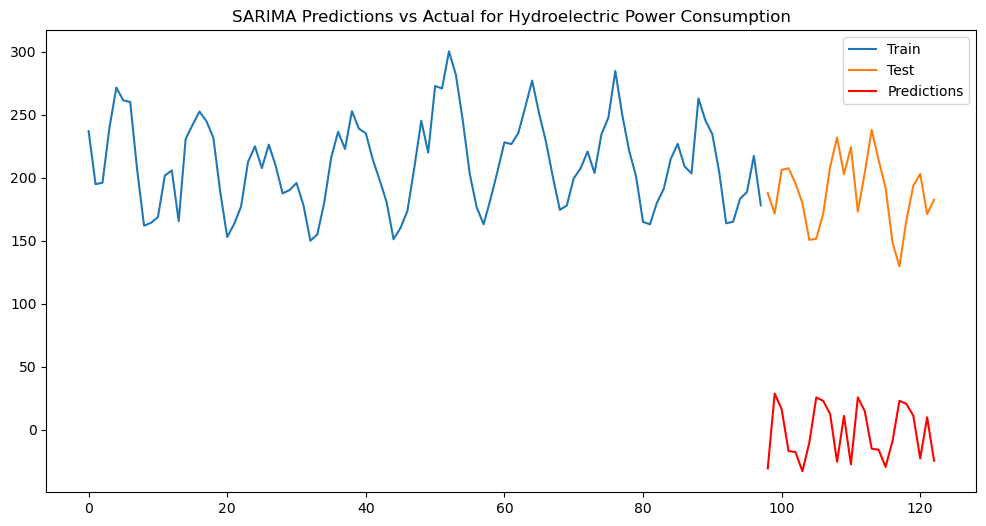

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.50 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=350.923, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=283.075, Time=0.05 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=280.370, Time=0.05 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=348.932, Time=0.00 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=290.263, Time=0.03 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(0,0,1)(0,0,2)[12] intercept   : AIC=273.318, Time=0.16 sec
 ARIMA(0,0,1)(1,0,2)[12] intercept   : AIC=251.889, Time=0.45 sec
 ARIMA(0,0,1)(2,0,2)[12] intercept   : AIC=inf, Time=0.74 sec
 ARIMA(0,0,1)(2,0,1)[12] intercept   : AIC=inf, Time=0.48 sec
 ARIMA(0,0,0)(1,0,2)[12] intercept   : AIC=263.915, Time=0.33 sec
 ARIMA(1,0,1)(1,0,2)[12] intercept   : AIC=238.929, Time=0.53 sec
 ARIMA(1,0,1)(0,0,2)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(1,0,1)(1,0,1)[12] intercept   : AIC=inf, Time=

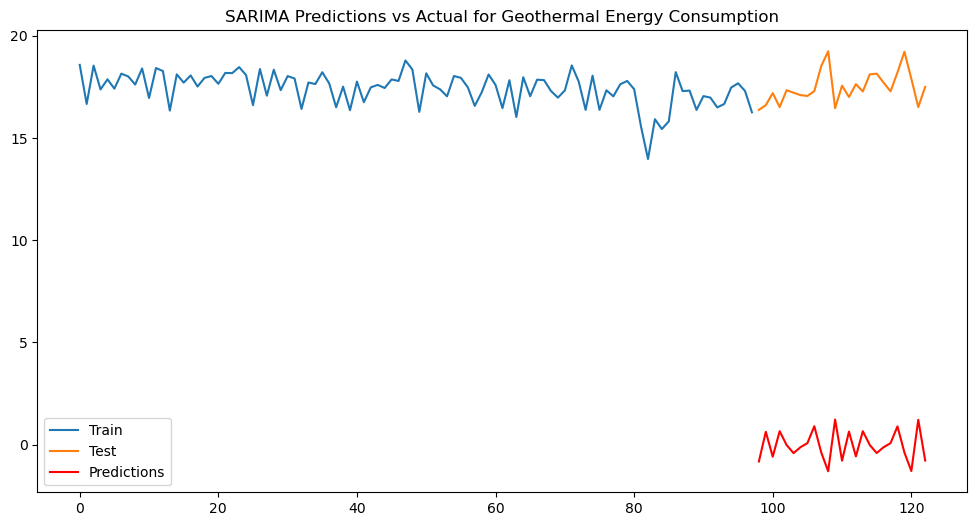

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1118.805, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1005.584, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1040.671, Time=0.07 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1116.826, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1086.192, Time=0.03 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=inf, Time=0.16 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.22 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=1049.567, Time=0.06 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=1008.226, Time=0.06 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=1003.461, Time=0.10 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=1084.486, Time=0.05 sec
 ARIMA(2,0,0)(2,0,0)[12] intercept   : AIC=inf, Time=0.19 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=i

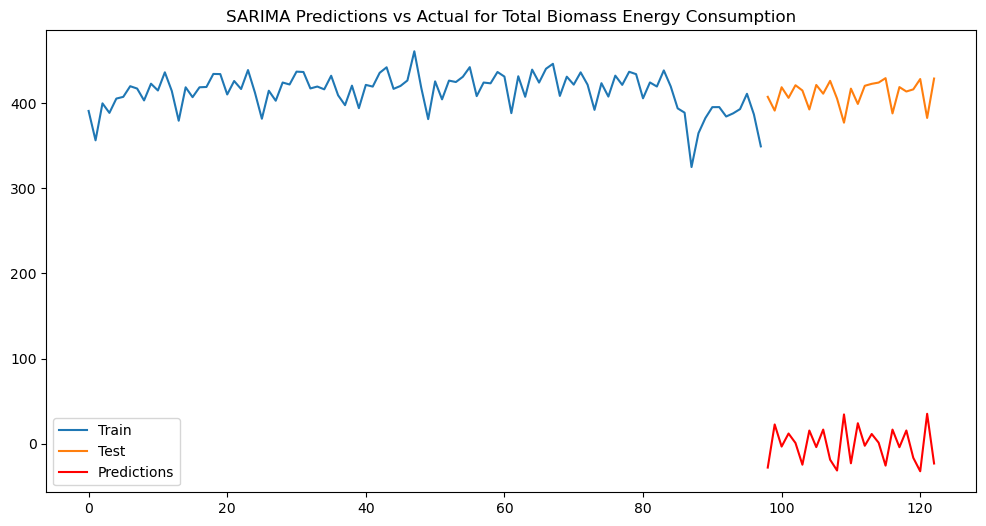

In [222]:
for column in df_REN_New.columns:
    if column != 'Month':
        fit_and_plot_sarima(df_REN_New, column)

In [223]:
import matplotlib.pyplot as plt
from pmdarima import auto_arima
from statsmodels.tsa.statespace.sarimax import SARIMAX

In [224]:
def fit_sarima1(data, sector_name):
    # Determine the best SARIMA order with auto_arima
    best_fit = auto_arima(data[sector_name], seasonal=True, m=12, trace=True,
                          error_action='ignore', suppress_warnings=True, stepwise=True)
    
    print(f"Best SARIMA order for {sector_name}: {best_fit.order}")
    print(f"Best seasonal order for {sector_name}: {best_fit.seasonal_order}")
    
    # Fit the SARIMA model using the best orders
    model = SARIMAX(data[sector_name], order=best_fit.order, seasonal_order=best_fit.seasonal_order)
    model_fit = model.fit(disp=0)
    
    # Get in-sample predictions to visualize fit
    predictions = model_fit.get_prediction(start=1, end=len(data)).predicted_mean

    
     # Compute MAPE
    mape = ((abs(data[sector_name] - predictions) / data[sector_name]) * 100).mean()
    print(f"Mean Absolute Percentage Error for {sector_name}: {mape:.2f}%")

    # Accuracy in percentage
    accuracy = 100 - mape
    print(f"Accuracy for {sector_name}: {accuracy:.2f}%")
    
    
    
    # Plot actual vs predicted values
    plt.figure(figsize=(12, 6))
    plt.plot(data[sector_name], label="Actual")
    
    plt.plot(data.index, predictions, color='red', label="Predicted")
    plt.title(f"{sector_name} - Actual vs Predicted")
    plt.legend()
    plt.show()

    return model_fit

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=0.54 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=709.194, Time=0.01 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=698.612, Time=0.09 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=701.890, Time=0.08 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=707.210, Time=0.01 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=707.394, Time=0.03 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=699.142, Time=0.17 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=699.556, Time=0.15 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=701.978, Time=0.07 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=inf, Time=0.84 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=696.863, Time=0.06 sec
 ARIMA(0,0,0)(2,1,0)[12] intercept   : AIC=698.129, Time=0.13 sec
 ARIMA(0,0,0)(1,1,1)[12] intercept   : AIC=698.250, Time=0.11 sec
 ARIMA(0,0,0)(0,1,1)[12] intercept   : AIC=700.467, Time=0.05 sec
 ARIMA(0,0,0)(2,1,1)[12] intercept   : AI

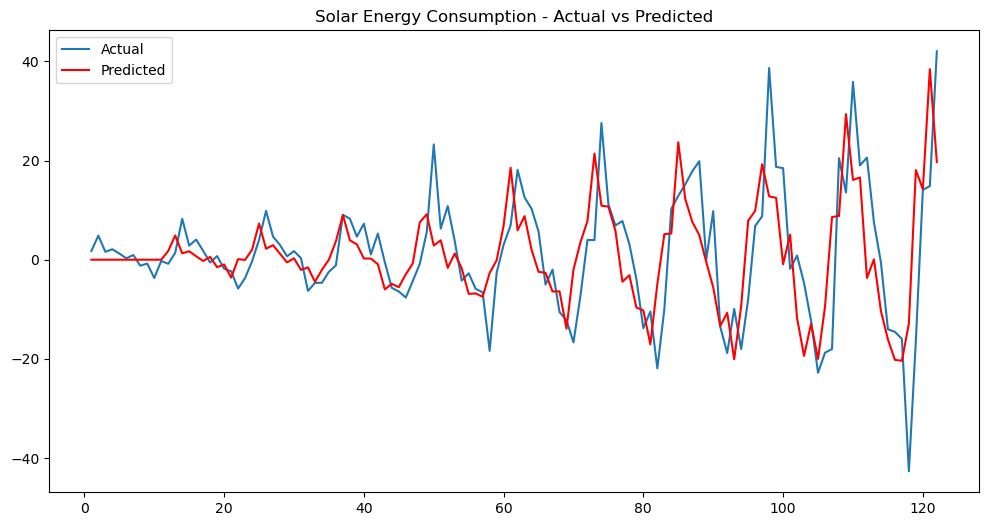

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1180.097, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1162.075, Time=0.08 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1171.220, Time=0.07 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1178.673, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1181.796, Time=0.02 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=1151.145, Time=0.16 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=1140.795, Time=0.33 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1138.821, Time=0.15 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=1171.388, Time=0.05 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=1140.795, Time=0.32 sec
 ARIMA(1,0,0)(0,0,2)[12] intercept   : AIC=1167.356, Time=0.16 sec
 ARIMA(1,0,0)(2,0,2)[12] intercept   : AIC=inf, Time=0.37 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.22 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept

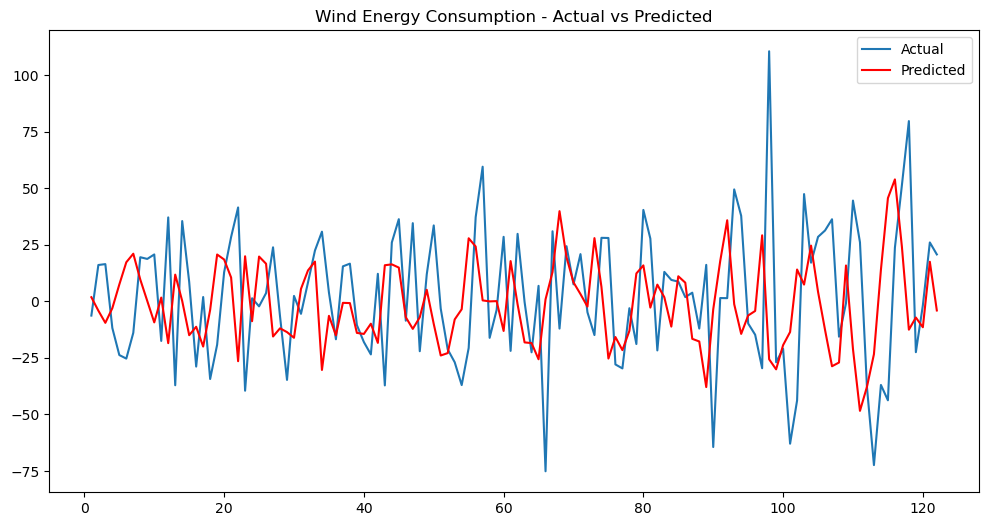

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=1064.903, Time=0.39 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1144.817, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1063.805, Time=0.06 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1099.560, Time=0.08 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1142.853, Time=0.00 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1143.959, Time=0.03 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=1061.686, Time=0.16 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=0.44 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1061.106, Time=0.10 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=1099.567, Time=0.08 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=1061.604, Time=0.27 sec
 ARIMA(1,0,0)(0,0,2)[12] intercept   : AIC=1079.231, Time=0.23 sec
 ARIMA(1,0,0)(2,0,2)[12] intercept   : AIC=inf, Time=0.48 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1059.182, Time=0.08 sec
 ARIMA(0,0,0)(0,0,1)[12] inte

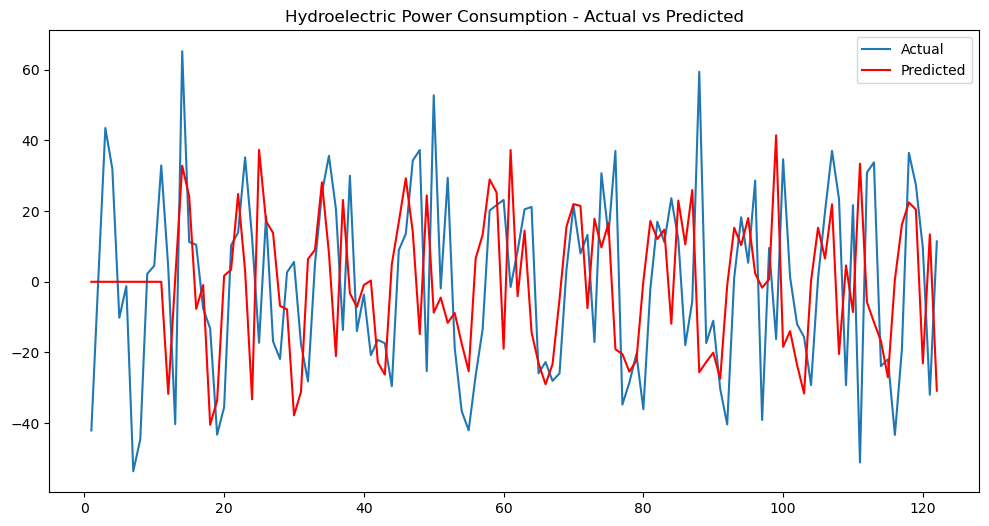

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.58 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=350.923, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=283.075, Time=0.05 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=280.370, Time=0.06 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=348.932, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=290.263, Time=0.03 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(0,0,1)(0,0,2)[12] intercept   : AIC=273.318, Time=0.18 sec
 ARIMA(0,0,1)(1,0,2)[12] intercept   : AIC=251.889, Time=0.50 sec
 ARIMA(0,0,1)(2,0,2)[12] intercept   : AIC=inf, Time=0.67 sec
 ARIMA(0,0,1)(2,0,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(0,0,0)(1,0,2)[12] intercept   : AIC=263.915, Time=0.29 sec
 ARIMA(1,0,1)(1,0,2)[12] intercept   : AIC=238.929, Time=0.49 sec
 ARIMA(1,0,1)(0,0,2)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(1,0,1)(1,0,1)[12] intercept   : AIC=inf, Time=

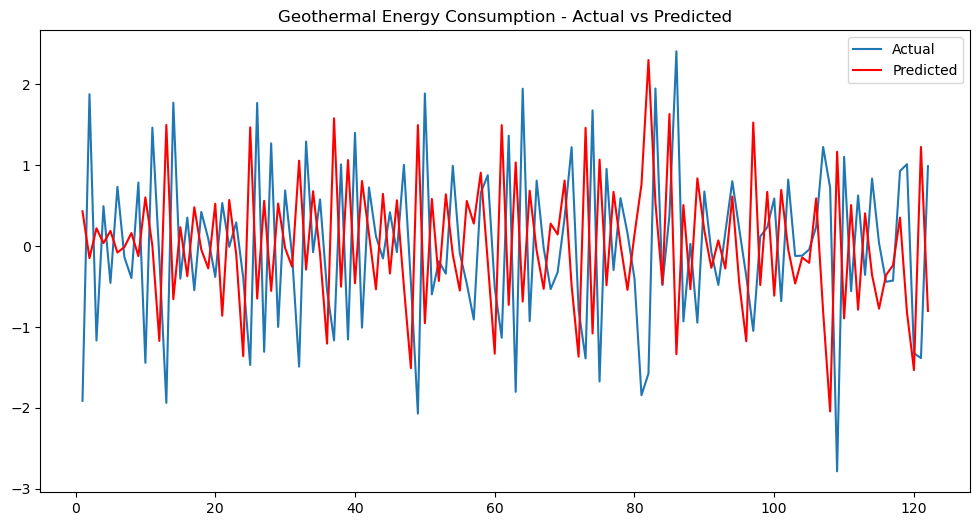

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1118.805, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1005.584, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1040.671, Time=0.07 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1116.826, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1086.192, Time=0.03 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=inf, Time=0.15 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=1049.567, Time=0.07 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=1008.226, Time=0.06 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=1003.461, Time=0.10 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=1084.486, Time=0.05 sec
 ARIMA(2,0,0)(2,0,0)[12] intercept   : AIC=inf, Time=0.20 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=i

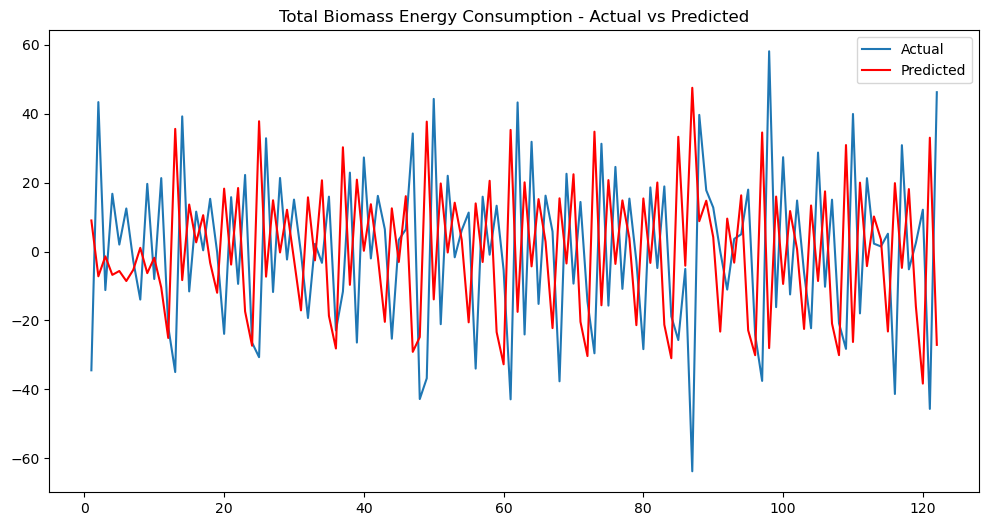

In [225]:
# Loop through all sectors and fit SARIMA model
for column in df_RE_diff.columns:
    if column != 'Month':
        fit_sarima1(df_RE_diff, column)

In [226]:
from sklearn.model_selection import TimeSeriesSplit

def fit_sarima_cv(data, sector_name, n_splits=5):
    tscv = TimeSeriesSplit(n_splits=n_splits)
    
    mape_scores = []
    
    for train_index, test_index in tscv.split(data):
        train, test = data[sector_name].iloc[train_index], data[sector_name].iloc[test_index]
        
        best_fit = auto_arima(train, seasonal=True, m=12, trace=True,
                              error_action='ignore', suppress_warnings=True, stepwise=True)

        print(f"Best SARIMA order for {sector_name}: {best_fit.order}")
        print(f"Best seasonal order for {sector_name}: {best_fit.seasonal_order}")

        model = SARIMAX(train, order=best_fit.order, seasonal_order=best_fit.seasonal_order)
        model_fit = model.fit(disp=0)
        
        predictions = model_fit.get_forecast(steps=len(test)).predicted_mean

        # Compute the MAPE (Mean Absolute Percentage Error) for this split
        mape = ((abs(test - predictions) / test) * 100).mean()
        mape_scores.append(mape)

        plt.figure(figsize=(12, 6))
        plt.plot(train, label="Training Data")
        plt.plot(test.index, test.values, label="Actual Test Data")
        plt.plot(test.index, predictions, color='red', label="Predicted Test Data")
        plt.title(f"{sector_name} - Training, Actual vs Predicted Test Data")
        plt.legend()
        plt.show()

    # Calculate average MAPE across all splits
    average_mape = np.mean(mape_scores)
    print(f"Average MAPE for {sector_name}: {average_mape:.2f}%")
    
    return average_mape


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=16.000, Time=0.11 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=41.597, Time=0.01 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=inf, Time=0.15 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=44.202, Time=0.04 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=39.674, Time=0.01 sec
 ARIMA(2,0,2)(0,1,1)[12] intercept   : AIC=14.000, Time=0.09 sec
 ARIMA(2,0,2)(0,1,0)[12] intercept   : AIC=12.000, Time=0.07 sec
 ARIMA(2,0,2)(1,1,0)[12] intercept   : AIC=14.000, Time=0.09 sec
 ARIMA(1,0,2)(0,1,0)[12] intercept   : AIC=10.000, Time=0.08 sec
 ARIMA(1,0,2)(1,1,0)[12] intercept   : AIC=12.000, Time=0.09 sec
 ARIMA(1,0,2)(0,1,1)[12] intercept   : AIC=12.000, Time=0.10 sec
 ARIMA(1,0,2)(1,1,1)[12] intercept   : AIC=14.000, Time=0.11 sec
 ARIMA(0,0,2)(0,1,0)[12] intercept   : AIC=inf, Time=0.06 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=43.374, Time=0.05 sec
 ARIMA(1,0,3)(0,1,0)[12] intercept   : AIC=inf, Time=

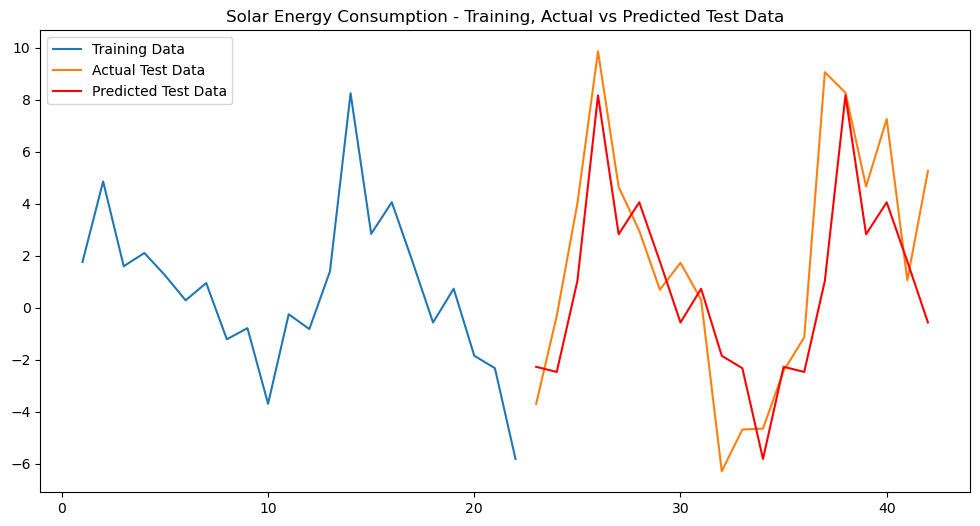

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=0.21 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=135.822, Time=0.01 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=139.088, Time=0.03 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=138.949, Time=0.03 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=134.610, Time=0.01 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=137.451, Time=0.02 sec
 ARIMA(0,0,0)(0,1,1)[12] intercept   : AIC=137.359, Time=0.02 sec
 ARIMA(0,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.14 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=137.300, Time=0.02 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=137.248, Time=0.02 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=inf, Time=0.11 sec

Best model:  ARIMA(0,0,0)(0,1,0)[12]          
Total fit time: 0.654 seconds
Best SARIMA order for Solar Energy Consumption: (0, 0, 0)
Best seasonal order for Solar Energy Consumption: (0, 1, 0, 12)


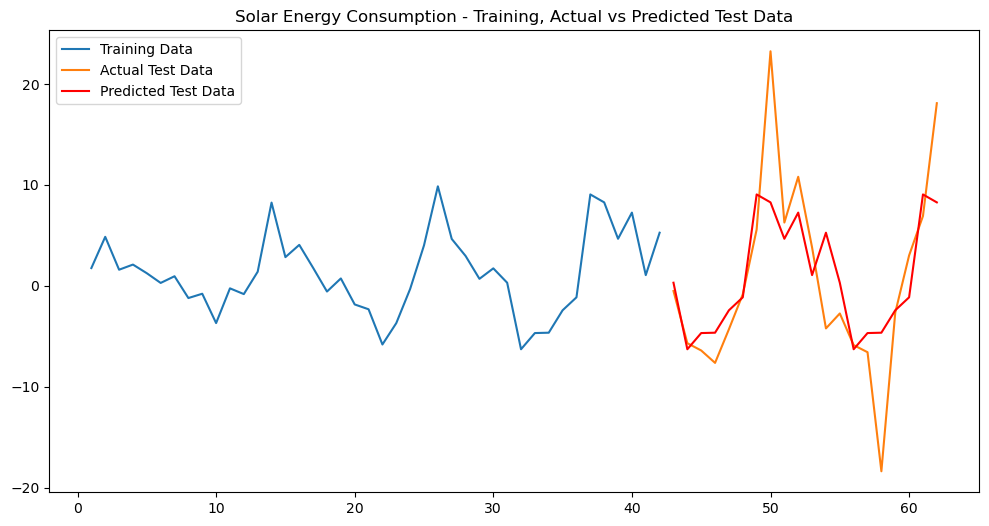

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=276.217, Time=0.01 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=278.677, Time=0.05 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=278.716, Time=0.05 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=274.225, Time=0.01 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=276.812, Time=0.03 sec
 ARIMA(0,0,0)(0,1,1)[12] intercept   : AIC=276.892, Time=0.04 sec
 ARIMA(0,0,0)(1,1,1)[12] intercept   : AIC=278.809, Time=0.06 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=278.216, Time=0.03 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=278.216, Time=0.02 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=inf, Time=0.10 sec

Best model:  ARIMA(0,0,0)(0,1,0)[12]          
Total fit time: 0.814 seconds
Best SARIMA order for Solar Energy Consumption: (0, 0, 0)
Best seasonal order for Solar Energy Consumption: (0, 1, 0, 12)


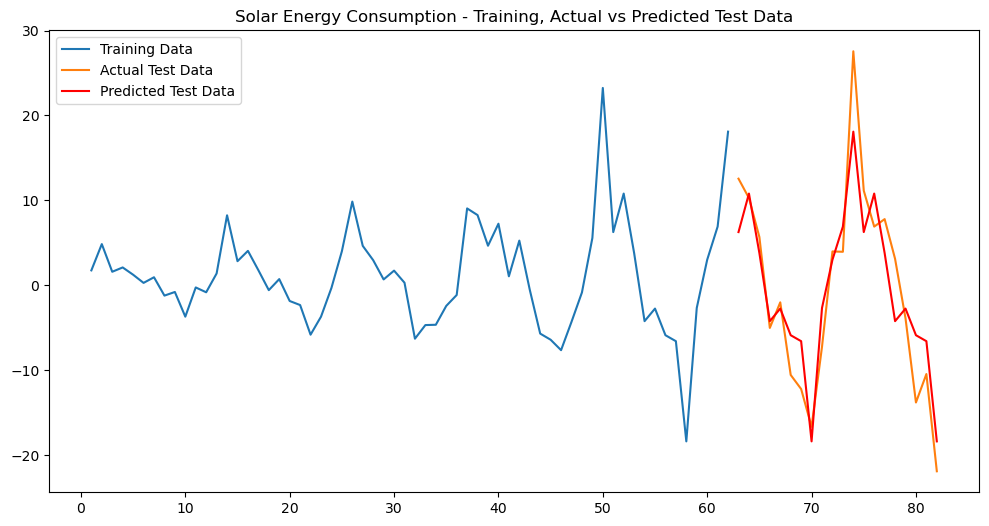

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=0.48 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=390.695, Time=0.01 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=392.616, Time=0.06 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=393.087, Time=0.06 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=388.697, Time=0.01 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=390.616, Time=0.04 sec
 ARIMA(0,0,0)(0,1,1)[12] intercept   : AIC=391.132, Time=0.04 sec
 ARIMA(0,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=392.100, Time=0.02 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=392.050, Time=0.02 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=inf, Time=0.15 sec

Best model:  ARIMA(0,0,0)(0,1,0)[12]          
Total fit time: 1.315 seconds
Best SARIMA order for Solar Energy Consumption: (0, 0, 0)
Best seasonal order for Solar Energy Consumption: (0, 1, 0, 12)


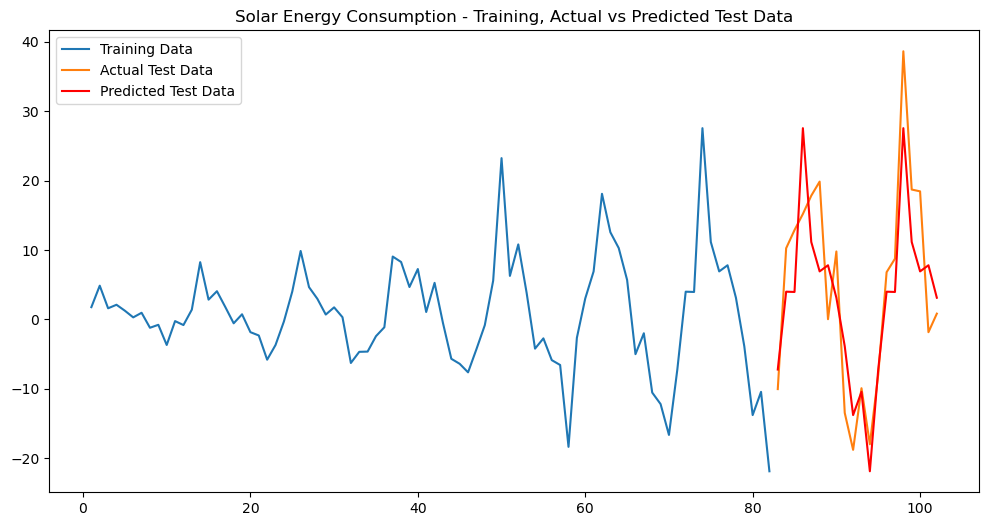

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=0.50 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=555.815, Time=0.01 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=549.377, Time=0.07 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=552.105, Time=0.06 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=553.922, Time=0.01 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=555.718, Time=0.03 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=549.067, Time=0.16 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=inf, Time=0.64 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=548.034, Time=0.16 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=552.151, Time=0.09 sec
 ARIMA(1,0,0)(1,1,2)[12] intercept   : AIC=550.026, Time=0.30 sec
 ARIMA(1,0,0)(0,1,2)[12] intercept   : AIC=550.520, Time=0.14 sec
 ARIMA(1,0,0)(2,1,2)[12] intercept   : AIC=inf, Time=0.92 sec
 ARIMA(0,0,0)(1,1,1)[12] intercept   : AIC=546.215, Time=0.16 sec
 ARIMA(0,0,0)(0,1,1)[12] intercept   : AIC=55

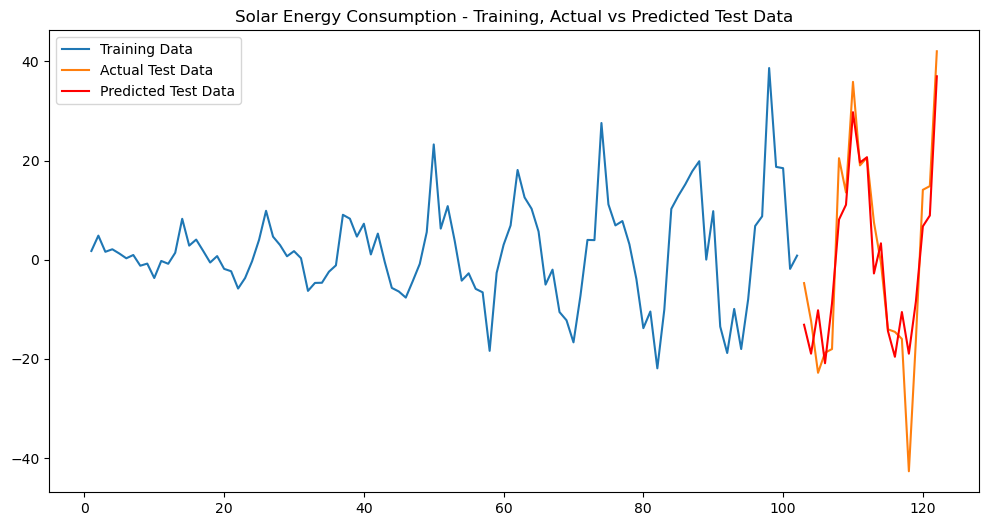

Average MAPE for Solar Energy Consumption: 100.81%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=16.000, Time=0.13 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=89.458, Time=0.01 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=inf, Time=0.17 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.11 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=87.458, Time=0.01 sec
 ARIMA(2,0,2)(0,1,1)[12] intercept   : AIC=14.000, Time=0.11 sec
 ARIMA(2,0,2)(0,1,0)[12] intercept   : AIC=12.000, Time=0.05 sec
 ARIMA(2,0,2)(1,1,0)[12] intercept   : AIC=14.000, Time=0.10 sec
 ARIMA(1,0,2)(0,1,0)[12] intercept   : AIC=10.000, Time=0.05 sec
 ARIMA(1,0,2)(1,1,0)[12] intercept   : AIC=12.000, Time=0.10 sec
 ARIMA(1,0,2)(0,1,1)[12] intercept   : AIC=12.000, Time=0.10 sec
 ARIMA(1,0,2)(1,1,1)[12] intercept   : AIC=14.000, Time=0.13 sec
 ARIMA(0,0,2)(0,1,0)[12] intercept   : AIC=86.048, Time=0.14 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=inf, Time=0.05 sec
 ARIM

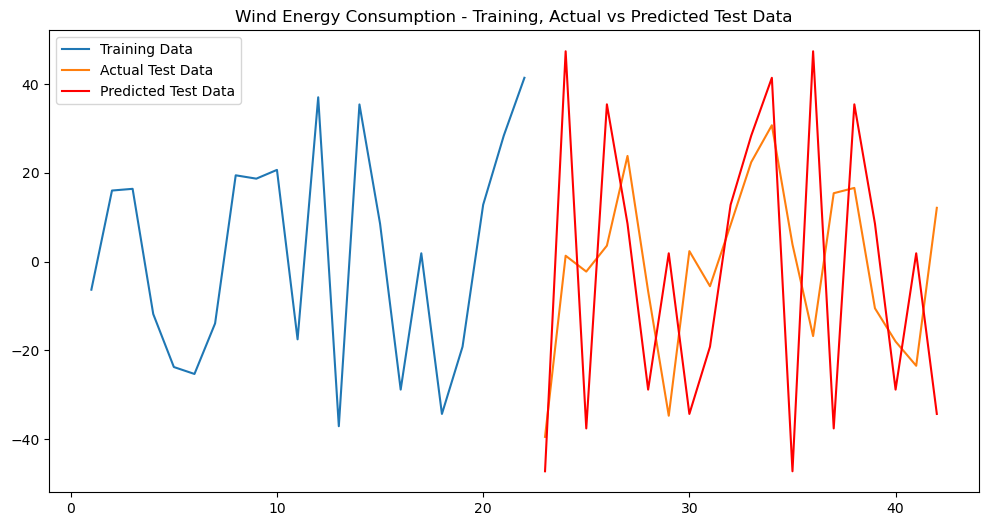

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.22 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=381.331, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=373.666, Time=0.05 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=375.912, Time=0.04 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=379.355, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=383.272, Time=0.02 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=374.863, Time=0.08 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=374.894, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=376.264, Time=0.06 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=376.862, Time=0.12 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=374.029, Time=0.03 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=374.260, Time=0.05 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=inf, Time=0.13 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=372.173, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AI

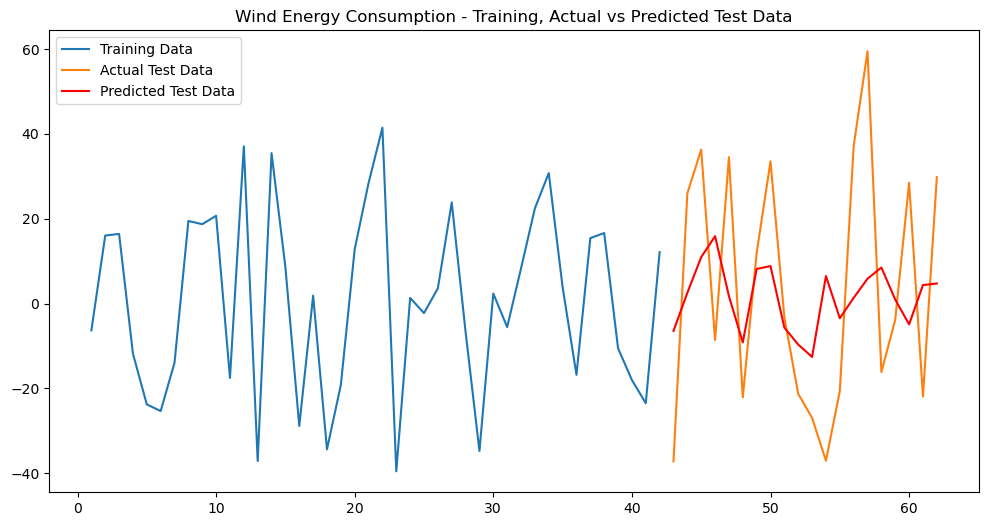

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.30 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=574.877, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=559.035, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=562.394, Time=0.06 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=573.153, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=576.818, Time=0.02 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=560.627, Time=0.15 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=557.180, Time=0.25 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=563.000, Time=0.06 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=inf, Time=0.51 sec
 ARIMA(1,0,0)(0,0,2)[12] intercept   : AIC=563.030, Time=0.14 sec
 ARIMA(1,0,0)(2,0,2)[12] intercept   : AIC=inf, Time=0.52 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=563.413, Time=0.08 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=554.53

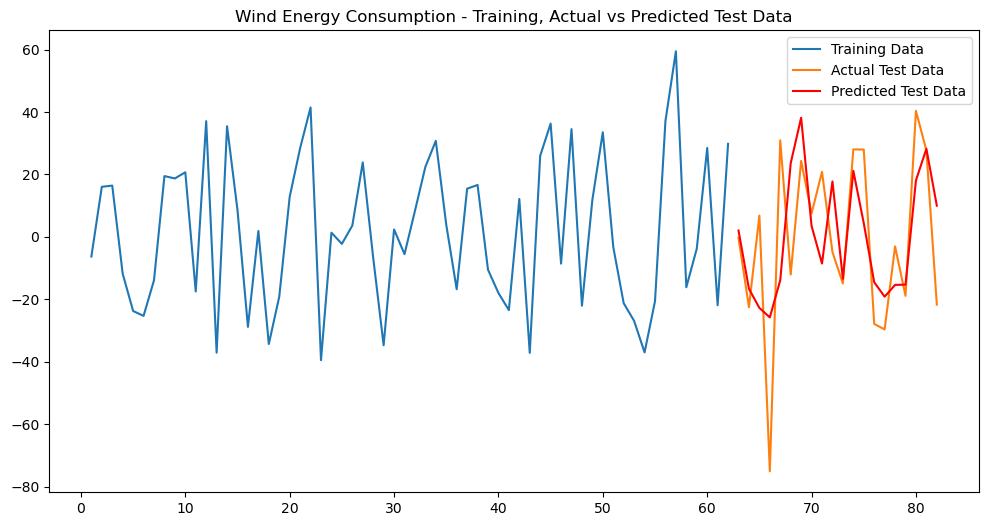

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.32 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=764.794, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=745.209, Time=0.06 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=751.477, Time=0.06 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=762.929, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=766.261, Time=0.02 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=742.724, Time=0.16 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(0,0,0)(2,0,0)[12] intercept   : AIC=754.584, Time=0.08 sec
 ARIMA(2,0,0)(2,0,0)[12] intercept   : AIC=737.933, Time=0.19 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=742.190, Time=0.09 sec
 ARIMA(2,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=0.55 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(3,0,0)(2,0,0)[12] intercept   : AIC=739.933, T

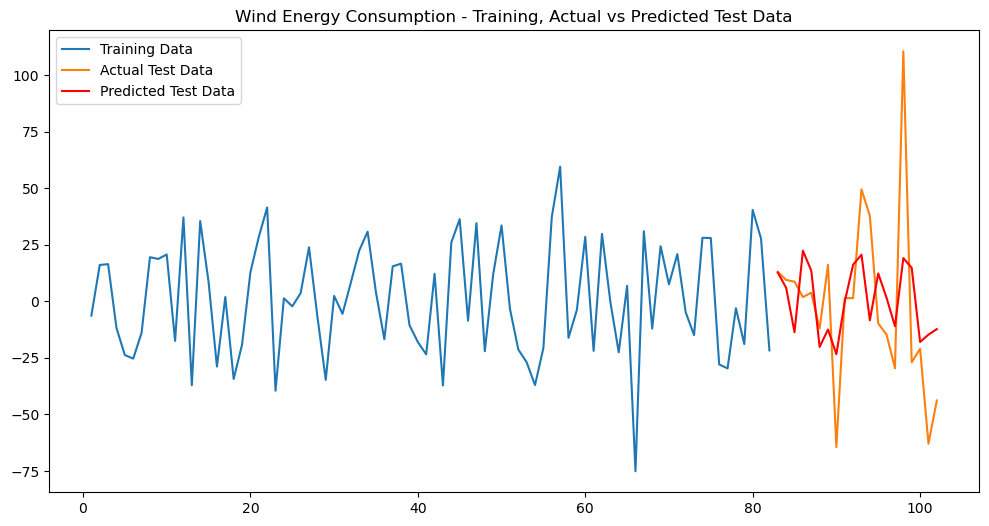

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.52 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=974.089, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=961.357, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=967.970, Time=0.07 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=972.121, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=975.698, Time=0.02 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=949.050, Time=0.13 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=936.545, Time=0.20 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(1,0,0)(2,0,2)[12] intercept   : AIC=938.861, Time=0.52 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=inf, Time=nan sec
 ARIMA(0,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(2,0,0)(2,0,1)[12] intercept   : AIC=934.683, Time=0.42 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(2,0,0)(2,0,0)[12] intercept   : AIC=947.300, Ti

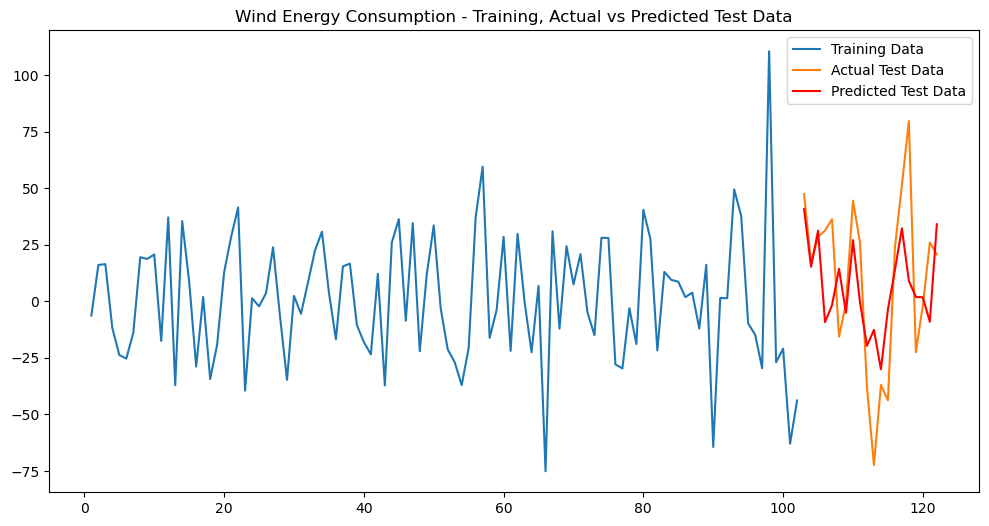

Average MAPE for Wind Energy Consumption: -24.20%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=16.000, Time=0.15 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=96.274, Time=0.01 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=99.782, Time=0.22 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.09 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=94.534, Time=0.01 sec
 ARIMA(2,0,2)(0,1,1)[12] intercept   : AIC=14.000, Time=0.09 sec
 ARIMA(2,0,2)(0,1,0)[12] intercept   : AIC=12.000, Time=0.06 sec
 ARIMA(2,0,2)(1,1,0)[12] intercept   : AIC=14.000, Time=0.10 sec
 ARIMA(1,0,2)(0,1,0)[12] intercept   : AIC=10.000, Time=0.06 sec
 ARIMA(1,0,2)(1,1,0)[12] intercept   : AIC=12.000, Time=0.09 sec
 ARIMA(1,0,2)(0,1,1)[12] intercept   : AIC=12.000, Time=0.08 sec
 ARIMA(1,0,2)(1,1,1)[12] intercept   : AIC=14.000, Time=0.10 sec
 ARIMA(0,0,2)(0,1,0)[12] intercept   : AIC=inf, Time=0.08 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=inf, Time=0.06 sec
 ARIMA

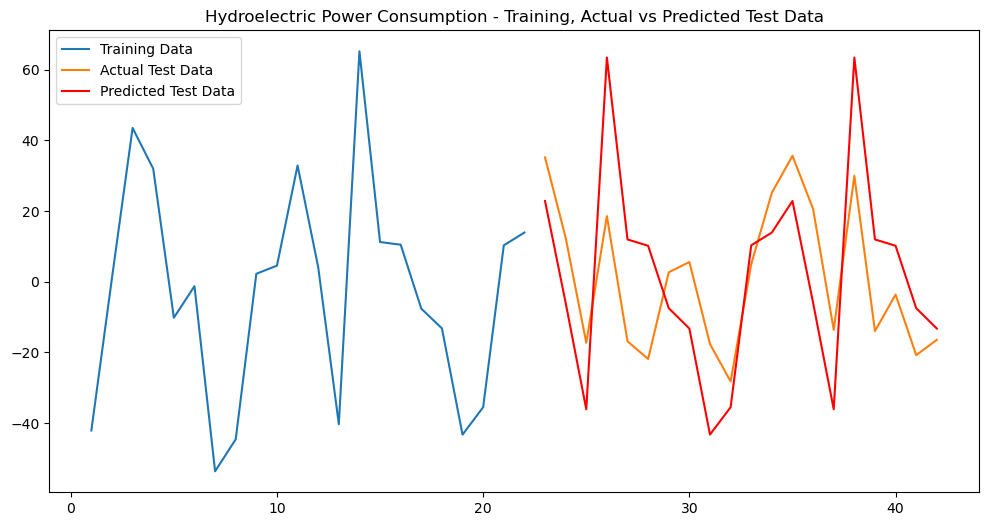

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=378.876, Time=0.23 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=397.510, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=382.686, Time=0.04 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=388.393, Time=0.04 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=395.563, Time=0.01 sec
 ARIMA(2,0,2)(0,0,1)[12] intercept   : AIC=inf, Time=0.15 sec
 ARIMA(2,0,2)(1,0,0)[12] intercept   : AIC=inf, Time=0.16 sec
 ARIMA(2,0,2)(2,0,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(2,0,2)(1,0,2)[12] intercept   : AIC=381.364, Time=0.43 sec
 ARIMA(2,0,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.10 sec
 ARIMA(2,0,2)(0,0,2)[12] intercept   : AIC=inf, Time=0.28 sec
 ARIMA(2,0,2)(2,0,0)[12] intercept   : AIC=inf, Time=0.37 sec
 ARIMA(2,0,2)(2,0,2)[12] intercept   : AIC=inf, Time=0.51 sec
 ARIMA(1,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(2,0,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.20 sec
 AR

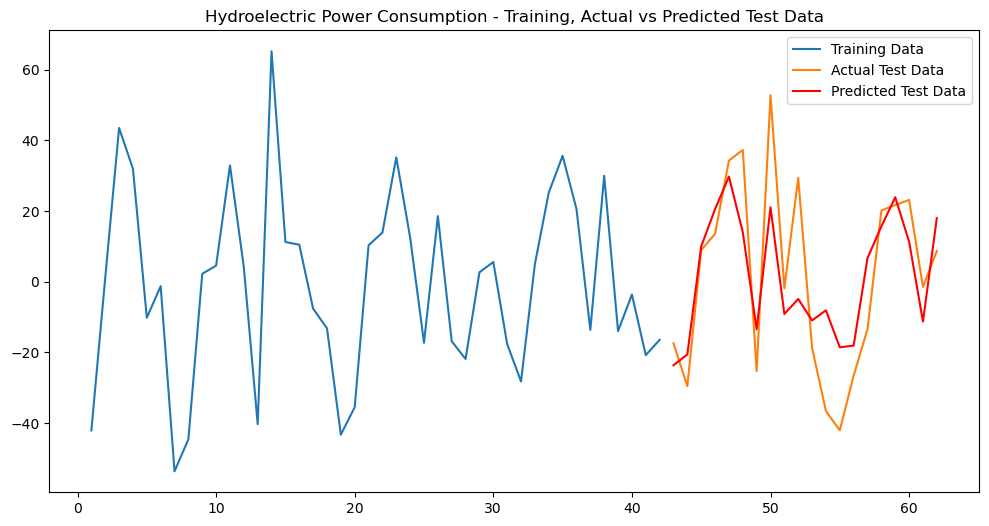

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.28 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=585.546, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=554.817, Time=0.06 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.11 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=583.546, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=584.545, Time=0.03 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=556.402, Time=0.14 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=555.174, Time=0.19 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.14 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=553.519, Time=0.05 sec
 ARIMA(0,0,0)(2,0,0)[12] intercept   : AIC=555.289, Time=0.11 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=554.214, Time=0.12 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.08 sec
 ARIMA(0,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=

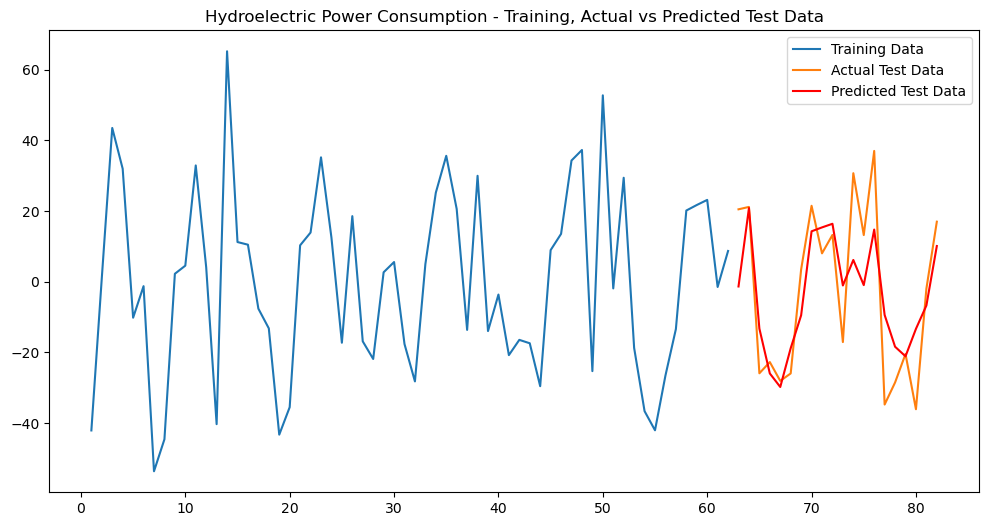

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=704.197, Time=0.32 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=768.901, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=716.985, Time=0.06 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.08 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=766.962, Time=0.01 sec
 ARIMA(2,0,2)(0,0,1)[12] intercept   : AIC=inf, Time=0.24 sec
 ARIMA(2,0,2)(1,0,0)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(2,0,2)(2,0,1)[12] intercept   : AIC=704.638, Time=0.56 sec
 ARIMA(2,0,2)(1,0,2)[12] intercept   : AIC=705.677, Time=0.58 sec
 ARIMA(2,0,2)(0,0,0)[12] intercept   : AIC=740.023, Time=0.09 sec
 ARIMA(2,0,2)(0,0,2)[12] intercept   : AIC=718.468, Time=0.50 sec
 ARIMA(2,0,2)(2,0,0)[12] intercept   : AIC=inf, Time=0.51 sec
 ARIMA(2,0,2)(2,0,2)[12] intercept   : AIC=inf, Time=0.68 sec
 ARIMA(1,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.24 sec
 ARIMA(2,0,1)(1,0,1)[12] intercept   : AIC=717.880, Time=

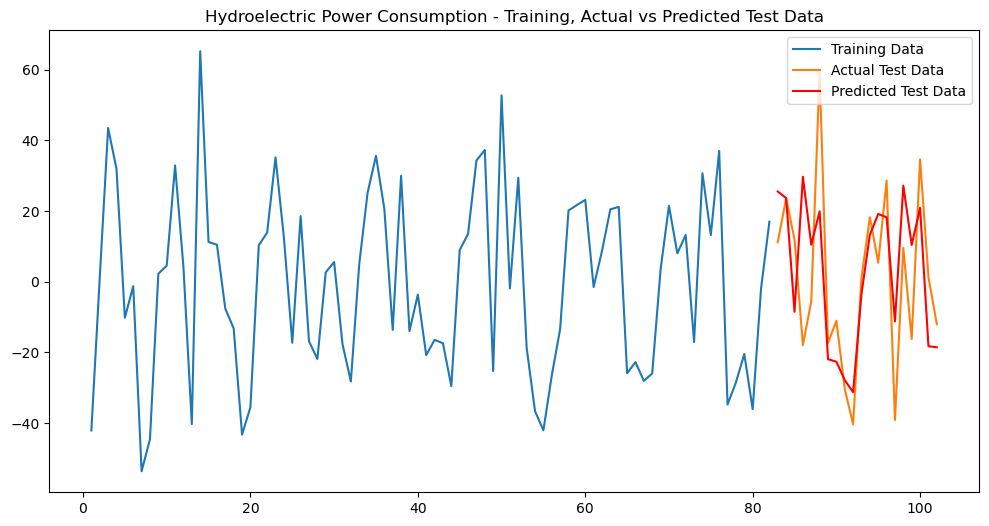

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=874.714, Time=0.36 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=953.861, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=893.479, Time=0.06 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=919.034, Time=0.07 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=951.887, Time=0.01 sec
 ARIMA(2,0,2)(0,0,1)[12] intercept   : AIC=897.757, Time=0.17 sec
 ARIMA(2,0,2)(1,0,0)[12] intercept   : AIC=881.780, Time=0.24 sec
 ARIMA(2,0,2)(2,0,1)[12] intercept   : AIC=876.492, Time=0.61 sec
 ARIMA(2,0,2)(1,0,2)[12] intercept   : AIC=876.688, Time=0.64 sec
 ARIMA(2,0,2)(0,0,0)[12] intercept   : AIC=918.404, Time=0.14 sec
 ARIMA(2,0,2)(0,0,2)[12] intercept   : AIC=891.652, Time=0.42 sec
 ARIMA(2,0,2)(2,0,0)[12] intercept   : AIC=inf, Time=0.70 sec
 ARIMA(2,0,2)(2,0,2)[12] intercept   : AIC=inf, Time=0.90 sec
 ARIMA(1,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(2,0,1)(1,0,1)[12] intercept   : AIC=89

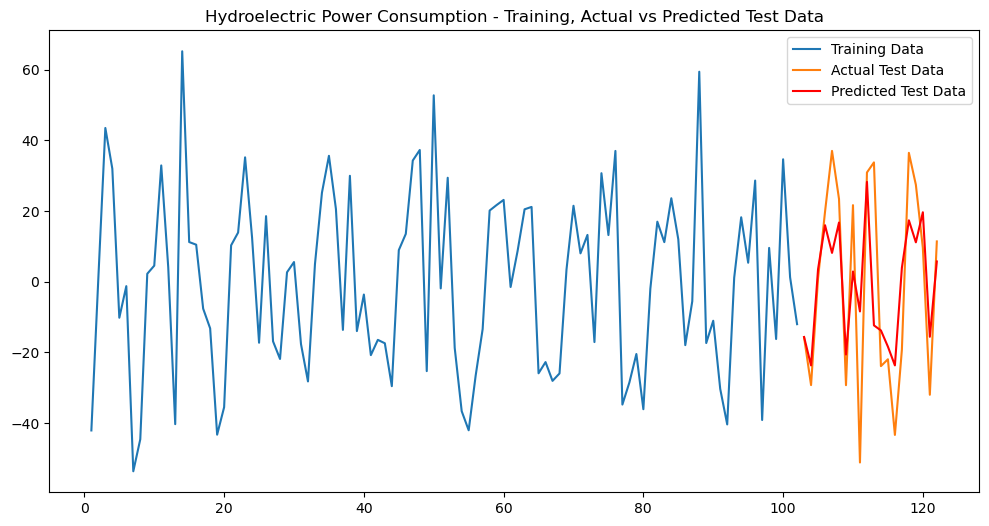

Average MAPE for Hydroelectric Power Consumption: 36.00%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=16.000, Time=0.12 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=19.147, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=inf, Time=0.17 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.10 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=17.975, Time=0.01 sec
 ARIMA(2,0,2)(0,1,1)[12] intercept   : AIC=14.000, Time=0.10 sec
 ARIMA(2,0,2)(0,1,0)[12] intercept   : AIC=12.000, Time=0.06 sec
 ARIMA(2,0,2)(1,1,0)[12] intercept   : AIC=14.000, Time=0.10 sec
 ARIMA(1,0,2)(0,1,0)[12] intercept   : AIC=10.000, Time=0.05 sec
 ARIMA(1,0,2)(1,1,0)[12] intercept   : AIC=12.000, Time=0.07 sec
 ARIMA(1,0,2)(0,1,1)[12] intercept   : AIC=12.000, Time=0.08 sec
 ARIMA(1,0,2)(1,1,1)[12] intercept   : AIC=14.000, Time=0.10 sec
 ARIMA(0,0,2)(0,1,0)[12] intercept   : AIC=19.374, Time=0.10 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=inf, Time=0.13 sec

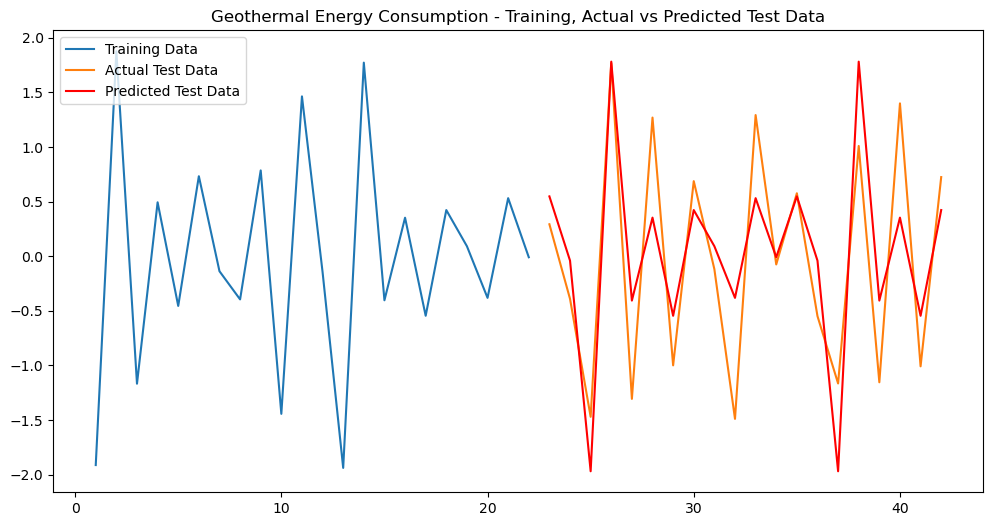

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=53.497, Time=0.01 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=48.906, Time=0.03 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.12 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=51.504, Time=0.01 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=46.988, Time=0.02 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=48.903, Time=0.04 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.19 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=44.217, Time=0.02 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=45.020, Time=0.06 sec
 ARIMA(2,0,0)(0,1,1)[12] intercept   : AIC=44.757, Time=0.06 sec
 ARIMA(2,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.18 sec
 ARIMA(3,0,0)(0,1,0)[12] intercept   : AIC=45.497, Time=0.03 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=43.416, Time=0.04 sec
 ARIMA(2,0,1)(1,1,0)[12] intercept   : AIC=44.378, Time=0.1

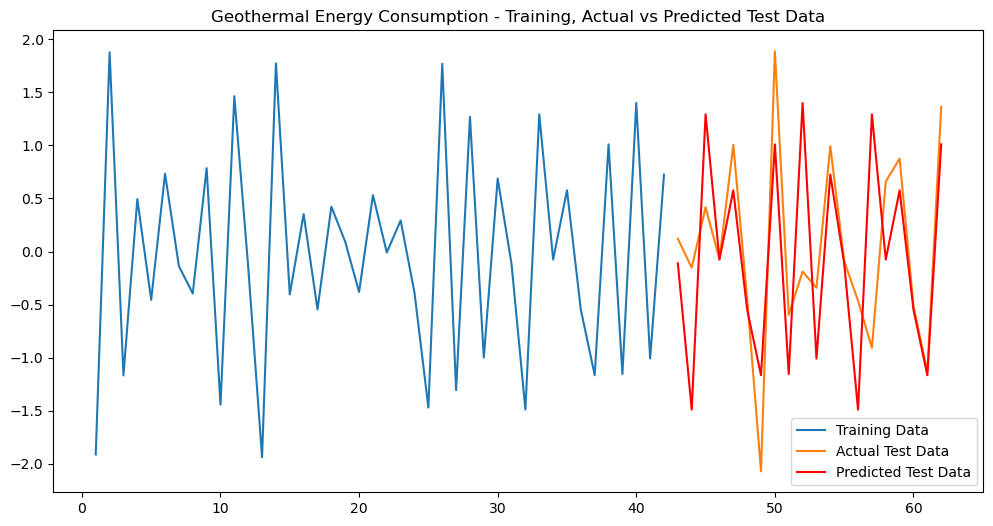

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=179.095, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=116.485, Time=0.04 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.13 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=177.104, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=149.599, Time=0.02 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=115.870, Time=0.11 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=0.30 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.15 sec
 ARIMA(0,0,0)(2,0,0)[12] intercept   : AIC=129.706, Time=0.07 sec
 ARIMA(2,0,0)(2,0,0)[12] intercept   : AIC=104.227, Time=0.16 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=106.829, Time=0.06 sec
 ARIMA(2,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=101.457, Time=0.23 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=123.352, T

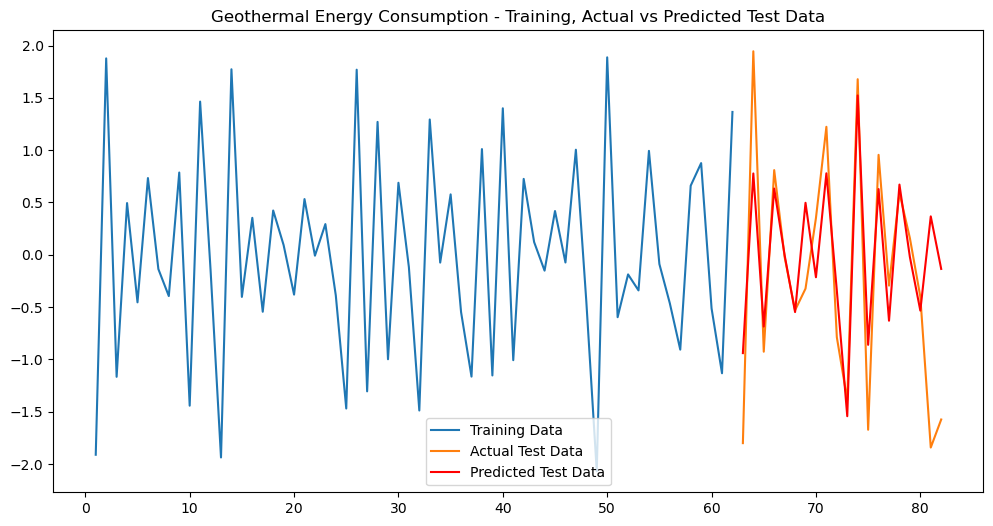

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=164.308, Time=0.27 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=241.584, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=174.491, Time=0.05 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.12 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=239.827, Time=0.01 sec
 ARIMA(2,0,2)(0,0,1)[12] intercept   : AIC=inf, Time=0.22 sec
 ARIMA(2,0,2)(1,0,0)[12] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(2,0,2)(2,0,1)[12] intercept   : AIC=163.122, Time=0.47 sec
 ARIMA(2,0,2)(2,0,0)[12] intercept   : AIC=inf, Time=0.48 sec
 ARIMA(2,0,2)(2,0,2)[12] intercept   : AIC=165.017, Time=0.60 sec
 ARIMA(2,0,2)(1,0,2)[12] intercept   : AIC=162.686, Time=0.53 sec
 ARIMA(2,0,2)(0,0,2)[12] intercept   : AIC=inf, Time=0.48 sec
 ARIMA(1,0,2)(1,0,2)[12] intercept   : AIC=161.685, Time=0.51 sec
 ARIMA(1,0,2)(0,0,2)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(1,0,2)(1,0,1)[12] intercept   : AIC=163.949, Time=

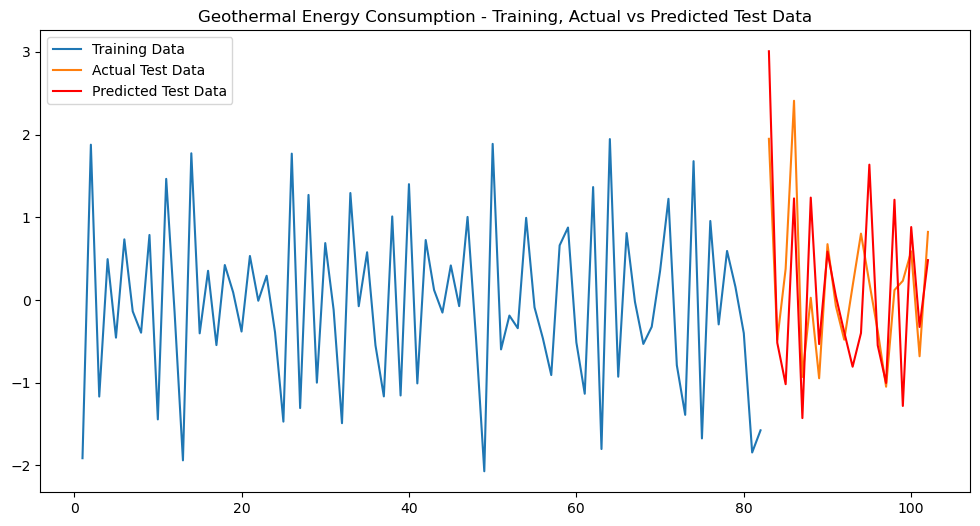

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.37 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=294.651, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=238.109, Time=0.05 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.18 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=292.666, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=260.999, Time=0.02 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=222.986, Time=0.12 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=220.001, Time=0.23 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=219.359, Time=0.15 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=249.447, Time=0.04 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=220.058, Time=0.28 sec
 ARIMA(1,0,0)(0,0,2)[12] intercept   : AIC=235.790, Time=0.11 sec
 ARIMA(1,0,0)(2,0,2)[12] intercept   : AIC=221.956, Time=0.50 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=225.127, Time=0.10 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AI

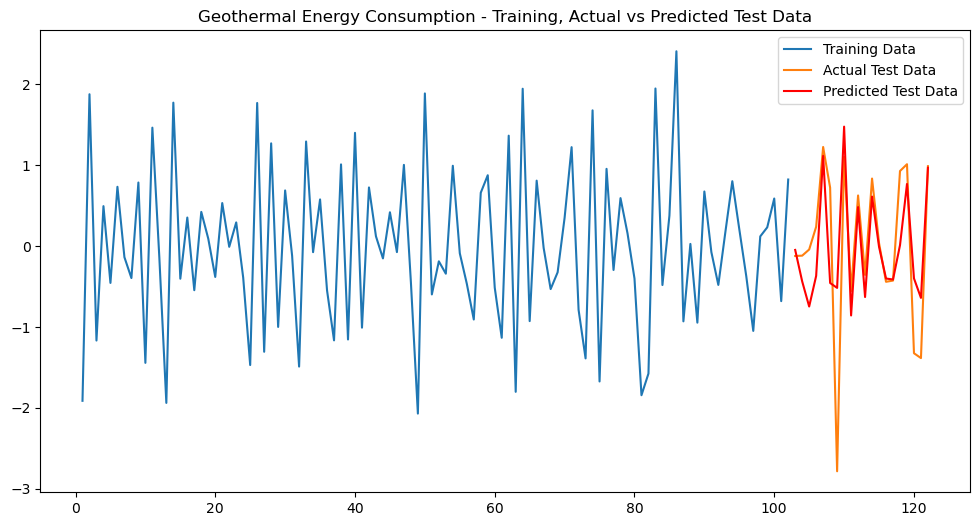

Average MAPE for Geothermal Energy Consumption: -47.11%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=16.000, Time=0.11 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=58.072, Time=0.01 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=61.984, Time=0.03 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.08 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=59.169, Time=0.01 sec
 ARIMA(2,0,2)(0,1,1)[12] intercept   : AIC=14.000, Time=0.09 sec
 ARIMA(2,0,2)(0,1,0)[12] intercept   : AIC=12.000, Time=0.05 sec
 ARIMA(2,0,2)(1,1,0)[12] intercept   : AIC=14.000, Time=0.09 sec
 ARIMA(1,0,2)(0,1,0)[12] intercept   : AIC=10.000, Time=0.06 sec
 ARIMA(1,0,2)(1,1,0)[12] intercept   : AIC=12.000, Time=0.09 sec
 ARIMA(1,0,2)(0,1,1)[12] intercept   : AIC=12.000, Time=0.09 sec
 ARIMA(1,0,2)(1,1,1)[12] intercept   : AIC=14.000, Time=0.10 sec
 ARIMA(0,0,2)(0,1,0)[12] intercept   : AIC=inf, Time=0.08 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=inf, Time=0.09 sec


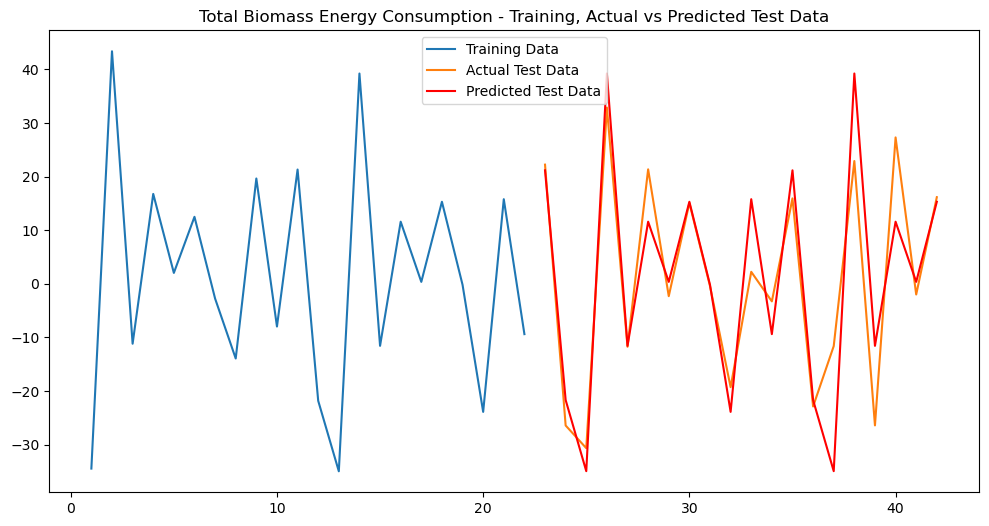

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=308.978, Time=0.15 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=375.161, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.05 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.08 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=373.279, Time=0.00 sec
 ARIMA(2,0,2)(0,0,1)[12] intercept   : AIC=inf, Time=0.16 sec
 ARIMA(2,0,2)(1,0,0)[12] intercept   : AIC=307.258, Time=0.10 sec
 ARIMA(2,0,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.10 sec
 ARIMA(2,0,2)(2,0,0)[12] intercept   : AIC=308.847, Time=0.18 sec
 ARIMA(2,0,2)(2,0,1)[12] intercept   : AIC=310.231, Time=0.45 sec
 ARIMA(1,0,2)(1,0,0)[12] intercept   : AIC=305.271, Time=0.09 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=364.362, Time=0.06 sec
 ARIMA(1,0,2)(2,0,0)[12] intercept   : AIC=306.909, Time=0.18 sec
 ARIMA(1,0,2)(1,0,1)[12] intercept   : AIC=307.028, Time=0.12 sec
 ARIMA(1,0,2)(0,0,1)[12] intercept   : AIC=inf, T

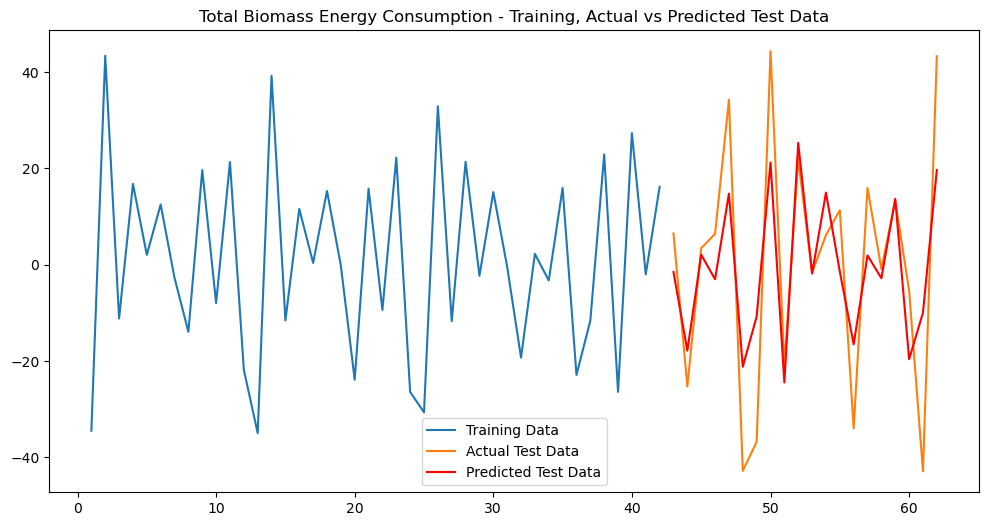

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=382.855, Time=0.01 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=371.539, Time=0.06 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.17 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=380.908, Time=0.01 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=380.659, Time=0.02 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=371.917, Time=0.17 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.22 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.14 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=378.071, Time=0.05 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=362.882, Time=0.10 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=371.068, Time=0.06 sec
 ARIMA(2,0,0)(2,1,0)[12] intercept   : AIC=363.240, Time=0.20 sec
 ARIMA(2,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=

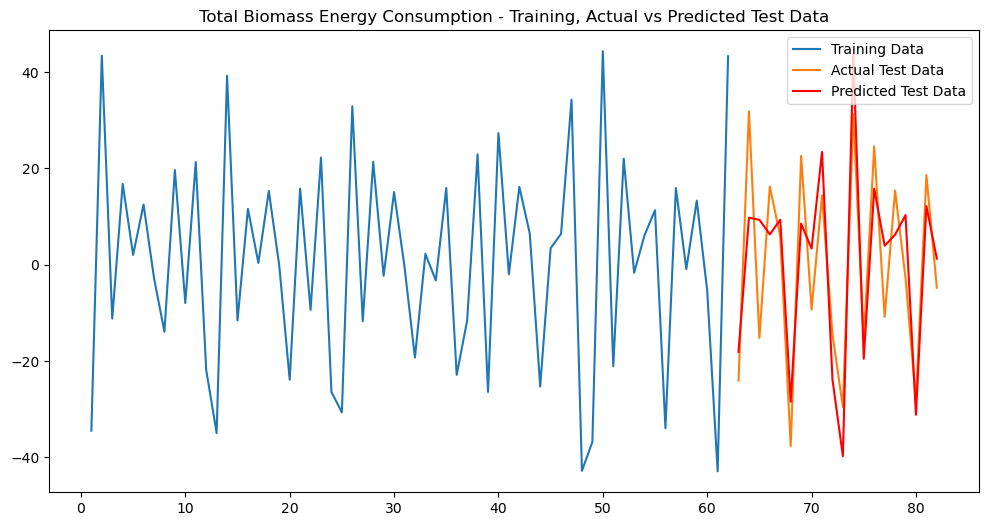

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=0.48 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=525.123, Time=0.01 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=506.808, Time=0.08 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=481.122, Time=0.08 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=523.217, Time=0.01 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=499.701, Time=0.03 sec
 ARIMA(0,0,1)(1,1,1)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(0,0,1)(0,1,2)[12] intercept   : AIC=inf, Time=0.35 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   : AIC=490.679, Time=0.06 sec
 ARIMA(0,0,1)(1,1,2)[12] intercept   : AIC=inf, Time=0.54 sec
 ARIMA(0,0,0)(0,1,1)[12] intercept   : AIC=510.335, Time=0.04 sec
 ARIMA(1,0,1)(0,1,1)[12] intercept   : AIC=483.121, Time=0.19 sec
 ARIMA(0,0,2)(0,1,1)[12] intercept   : AIC=483.120, Time=0.14 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=497.424, Time=0.10 sec
 ARIMA(1,0,2)(0,1,1)[12] intercept   : AIC=482.91

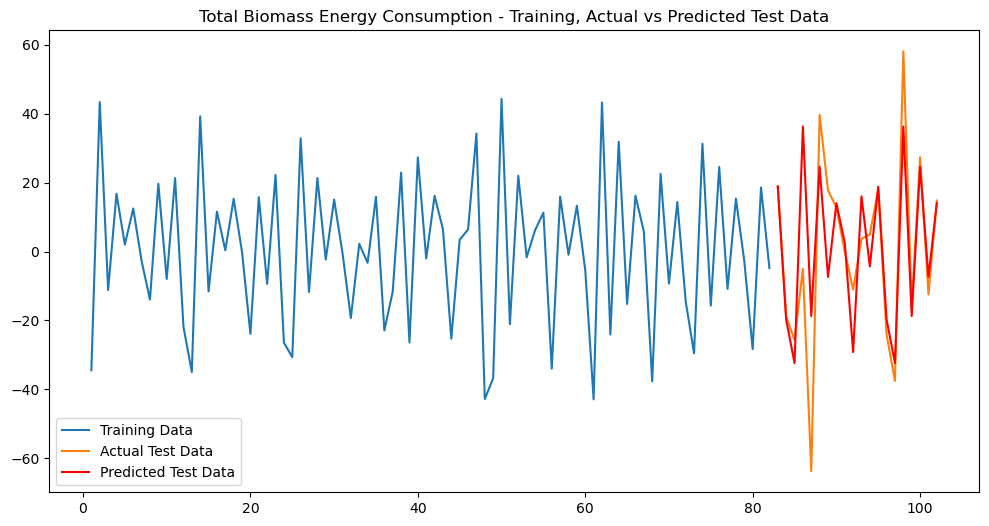

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=0.71 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=745.283, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=726.038, Time=0.15 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.10 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=743.283, Time=0.02 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=747.270, Time=0.04 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=719.092, Time=0.37 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=708.675, Time=0.42 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(1,0,0)(2,1,2)[12] intercept   : AIC=inf, Time=1.17 sec
 ARIMA(1,0,0)(1,1,2)[12] intercept   : AIC=inf, Time=0.94 sec
 ARIMA(0,0,0)(2,1,1)[12] intercept   : AIC=707.677, Time=0.29 sec
 ARIMA(0,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(0,0,0)(2,1,0)[12] intercept   : AIC=718.039, Time=0.19 sec
 ARIMA(0,0,0)(2,1,2)[12] intercept   : AIC=inf, Time=0.76

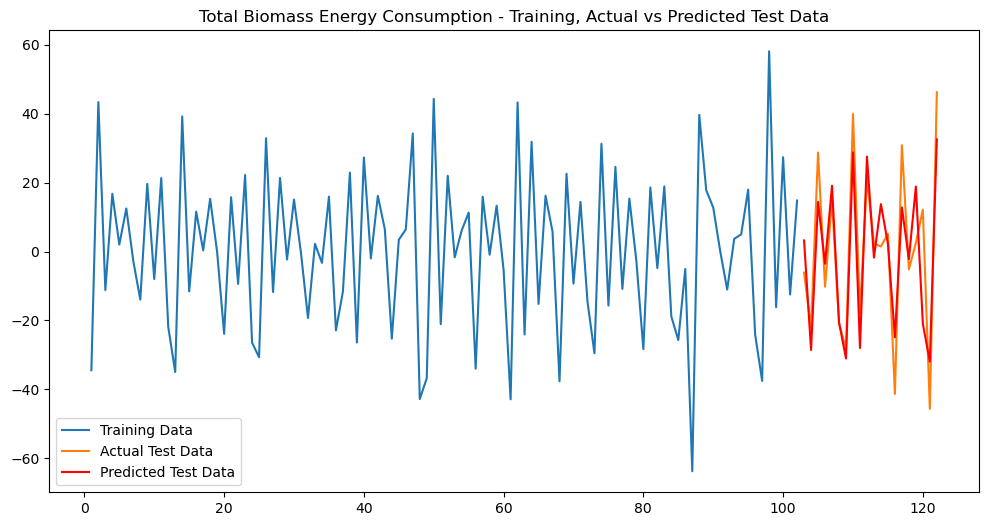

Average MAPE for Total Biomass Energy Consumption: 344.49%


In [227]:
# Loop through all sectors and fit SARIMA model
for column in df_RE_diff.columns:
    if column != 'Month':
        fit_sarima_cv(df_RE_diff, column, n_splits=5)

In [228]:
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import mean_squared_error, mean_absolute_error


def fit_sarima_cv_new(data, sector_name, n_splits=5):
    tscv = TimeSeriesSplit(n_splits=n_splits)
    
    mape_scores = []
    mse_scores = []
    rmse_scores = []
    mae_scores = []
    forecast_data = []

    for train_index, test_index in tscv.split(data):
        train, test = data[sector_name].iloc[train_index], data[sector_name].iloc[test_index]
        
        best_fit = auto_arima(train, seasonal=True, m=12, trace=True,
                              error_action='ignore', suppress_warnings=True, stepwise=True)

        print(f"Best SARIMA order for {sector_name}: {best_fit.order}")
        print(f"Best seasonal order for {sector_name}: {best_fit.seasonal_order}")

        model = SARIMAX(train, order=best_fit.order, seasonal_order=best_fit.seasonal_order)
        model_fit = model.fit(disp=0)
        
        predictions = model_fit.get_forecast(steps=len(test)).predicted_mean
        forecast_data.extend(predictions)

        # Compute the errors for this split
        mape = ((abs(test - predictions) / test) * 100).mean()
        mape_scores.append(mape)
        print(f"mape_scores  for {sector_name}: {mape}")
        
        mse = mean_squared_error(test, predictions)
        mse_scores.append(mse)
        
        rmse = np.sqrt(mse)
        rmse_scores.append(rmse)
        
        mae = mean_absolute_error(test, predictions)
        mae_scores.append(mae)

        plt.figure(figsize=(12, 6))
        plt.plot(train, label="Training Data")
        plt.plot(test.index, test.values, label="Actual Test Data")
        plt.plot(test.index, predictions, color='red', label="Predicted Test Data")
        plt.title(f"{sector_name} - Training, Actual vs Predicted Test Data")
        plt.legend()
        plt.show()

    # Calculate average errors across all splits
    average_mape = np.mean(mape_scores)
    average_mse = np.mean(mse_scores)
    average_rmse = np.mean(rmse_scores)
    average_mae = np.mean(mae_scores)

    print(f"Average MAPE for {sector_name}: {average_mape:.2f}%")
    print(f"Average MSE for {sector_name}: {average_mse:.2f}")
    print(f"Average RMSE for {sector_name}: {average_rmse:.2f}")
    print(f"Average MAE for {sector_name}: {average_mae:.2f}")

    # Return the results as a dictionary
    results = {
        "forecast": forecast_data,
        "average_mape": float(f"{average_mape:.2f}"),
        "average_mse": int(round(average_mse)),
        "average_rmse": int(round(average_rmse)),
        "average_mae": int(round(average_mae))
    }

    return results


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=16.000, Time=0.17 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=54.357, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=inf, Time=0.24 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.13 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=84.087, Time=0.01 sec
 ARIMA(2,0,2)(0,1,1)[12] intercept   : AIC=14.000, Time=0.13 sec
 ARIMA(2,0,2)(0,1,0)[12] intercept   : AIC=12.000, Time=0.08 sec
 ARIMA(2,0,2)(1,1,0)[12] intercept   : AIC=14.000, Time=0.13 sec
 ARIMA(1,0,2)(0,1,0)[12] intercept   : AIC=46.828, Time=0.14 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=41.678, Time=0.14 sec
 ARIMA(3,0,2)(0,1,0)[12] intercept   : AIC=14.000, Time=0.07 sec
 ARIMA(2,0,3)(0,1,0)[12] intercept   : AIC=45.737, Time=0.15 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=47.000, Time=0.07 sec
 ARIMA(1,0,3)(0,1,0)[12] intercept   : AIC=inf, Time=0.14 sec
 ARIMA(3,0,1)(0,1,0)[12] intercept   : AIC=41.941, Time=

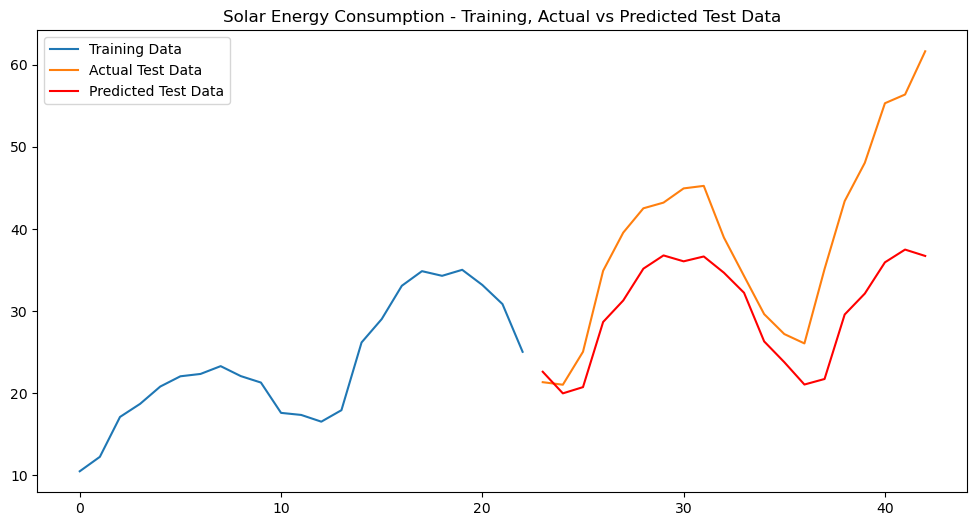

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=162.844, Time=0.01 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=142.527, Time=0.09 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.17 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=229.114, Time=0.02 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=141.652, Time=0.03 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=142.661, Time=0.06 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=144.487, Time=0.14 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=141.165, Time=0.05 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=142.511, Time=0.11 sec
 ARIMA(2,0,0)(0,1,1)[12] intercept   : AIC=142.523, Time=0.09 sec
 ARIMA(2,0,0)(1,1,1)[12] intercept   : AIC=144.511, Time=0.17 sec
 ARIMA(3,0,0)(0,1,0)[12] intercept   : AIC=142.408, Time=0.10 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=inf, Time=0.14 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=14

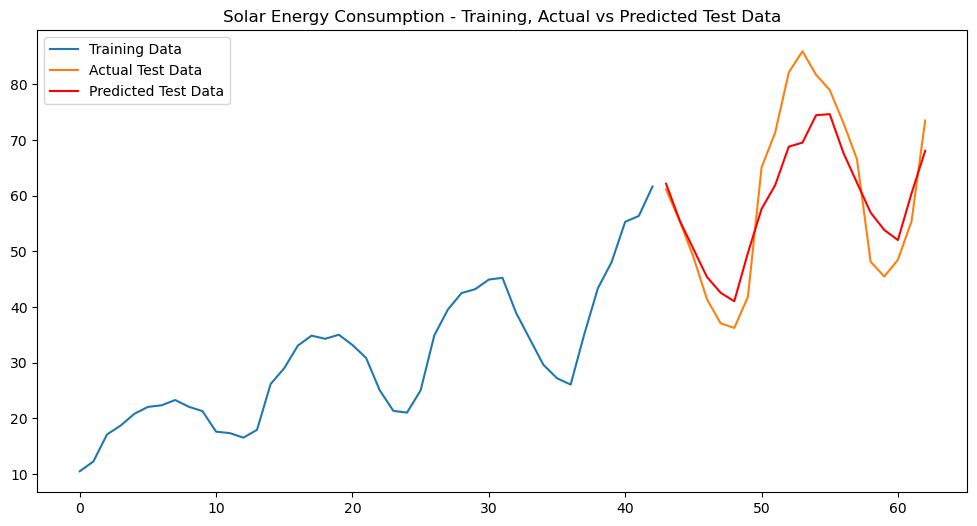

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=0.33 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=274.225, Time=0.01 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=276.727, Time=0.05 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=276.768, Time=0.05 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=274.864, Time=0.03 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=274.944, Time=0.05 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=276.863, Time=0.08 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=276.224, Time=0.02 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=276.224, Time=0.02 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=inf, Time=0.10 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=276.217, Time=0.01 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 0.790 seconds
Best SARIMA order for Solar Energy Consumption: (0, 1, 0)
Best seasonal order for Solar Energy Consumption: (0, 1, 0, 12)
mape_scores  for Solar Energy Consumpti

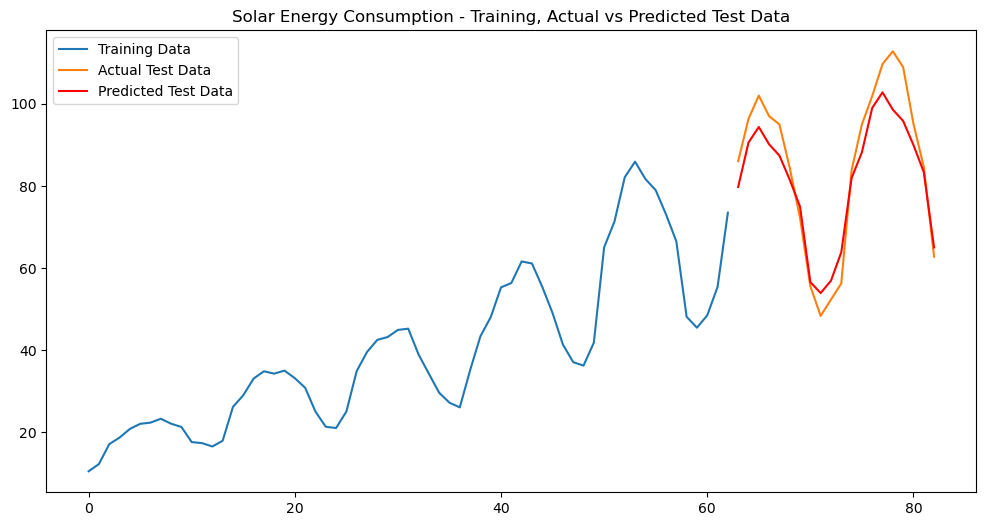

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=392.456, Time=0.58 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=445.794, Time=0.01 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=390.500, Time=0.13 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=412.832, Time=0.10 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=560.269, Time=0.02 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=389.303, Time=0.05 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=390.697, Time=0.10 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=392.139, Time=0.22 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=391.227, Time=0.05 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=391.239, Time=0.05 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=410.835, Time=0.04 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=392.664, Time=0.18 sec
 ARIMA(1,0,0)(0,1,0)[12]             : AIC=396.106, Time=0.02 sec

Best model:  ARIMA(1,0,0)(0,1,0)[12] intercept
Total fit time: 1.574 seconds
Best SARIMA order for

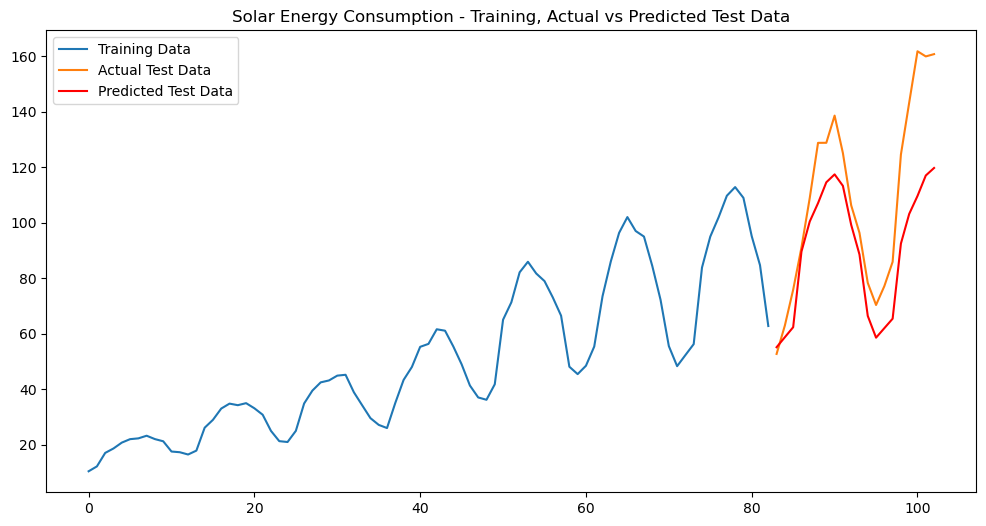

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=545.824, Time=0.40 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=553.922, Time=0.02 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=547.678, Time=0.05 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=550.388, Time=0.08 sec
 ARIMA(2,1,2)(0,1,1)[12]             : AIC=549.351, Time=0.17 sec
 ARIMA(2,1,2)(1,1,0)[12]             : AIC=547.587, Time=0.26 sec
 ARIMA(2,1,2)(2,1,1)[12]             : AIC=inf, Time=1.64 sec
 ARIMA(2,1,2)(1,1,2)[12]             : AIC=547.766, Time=0.69 sec
 ARIMA(2,1,2)(0,1,0)[12]             : AIC=550.638, Time=0.09 sec
 ARIMA(2,1,2)(0,1,2)[12]             : AIC=548.716, Time=0.65 sec
 ARIMA(2,1,2)(2,1,0)[12]             : AIC=547.240, Time=0.68 sec
 ARIMA(2,1,2)(2,1,2)[12]             : AIC=inf, Time=1.54 sec
 ARIMA(1,1,2)(1,1,1)[12]             : AIC=548.564, Time=0.33 sec
 ARIMA(2,1,1)(1,1,1)[12]             : AIC=548.432, Time=0.31 sec
 ARIMA(3,1,2)(1,1,1)[12]             : AI

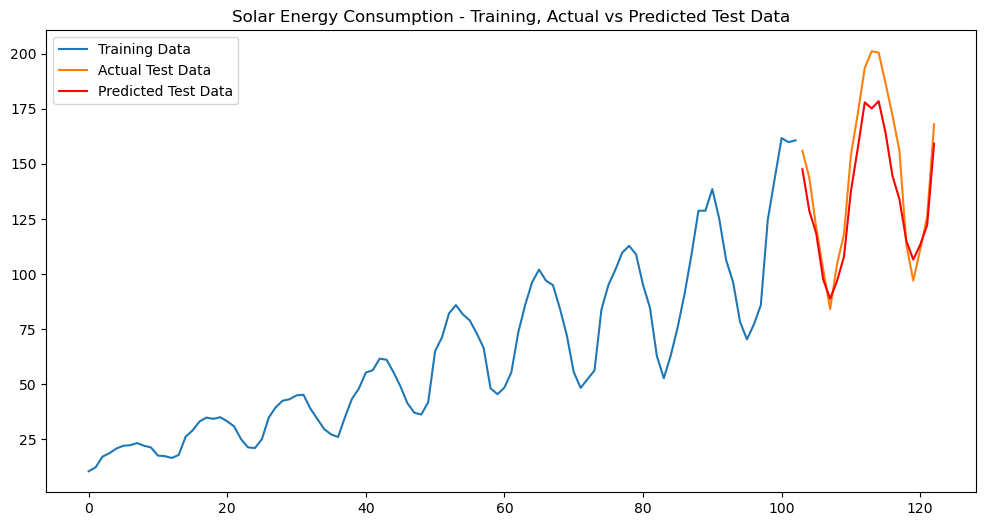

Average MAPE for Solar Energy Consumption: 12.30%
Average MSE for Solar Energy Consumption: 201.59
Average RMSE for Solar Energy Consumption: 12.72
Average MAE for Solar Energy Consumption: 10.41


In [229]:
# Example of usage Solar
results = fit_sarima_cv_new(df_REN_New, 'Solar Energy Consumption', n_splits=5)

In [230]:
# Accessing the results Solar
forecast_Solar = results['forecast']
mape_Solar = results['average_mape']
mse_Solar = results['average_mse']
rmse_Solar = results['average_rmse']
mae_Solar = results['average_mae']

In [231]:
#forecast_Solar

In [232]:
mape_Solar, mse_Solar,rmse_Solar,mae_Solar

(12.3, 202, 13, 10)

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=14245735.674, Time=0.09 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=88.899, Time=0.01 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=inf, Time=0.16 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.13 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=93.928, Time=0.01 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=90.899, Time=0.02 sec
 ARIMA(0,0,0)(0,1,1)[12] intercept   : AIC=90.899, Time=0.10 sec
 ARIMA(0,0,0)(1,1,1)[12] intercept   : AIC=92.899, Time=0.02 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=89.272, Time=0.02 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=inf, Time=0.04 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=inf, Time=0.05 sec

Best model:  ARIMA(0,0,0)(0,1,0)[12] intercept
Total fit time: 0.681 seconds
Best SARIMA order for Wind Energy Consumption: (0, 0, 0)
Best seasonal order for Wind Energy Consumption: (0, 1, 0, 12)
mape_scores  for Wind Energy Consumption: 13.19327

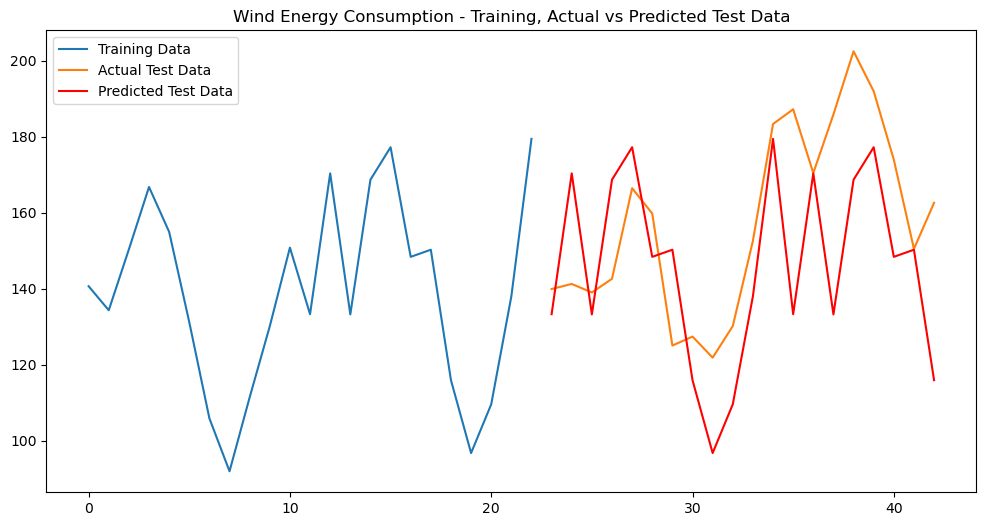

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=385.405, Time=0.28 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=406.333, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=377.061, Time=0.08 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=385.365, Time=0.05 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=554.819, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=384.127, Time=0.04 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=378.878, Time=0.20 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=378.932, Time=0.16 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=378.705, Time=0.04 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=397.943, Time=0.07 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=378.895, Time=0.15 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=378.893, Time=0.13 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=383.633, Time=0.08 sec
 ARIMA(2,0,1)(1,0,0)[12] intercept   

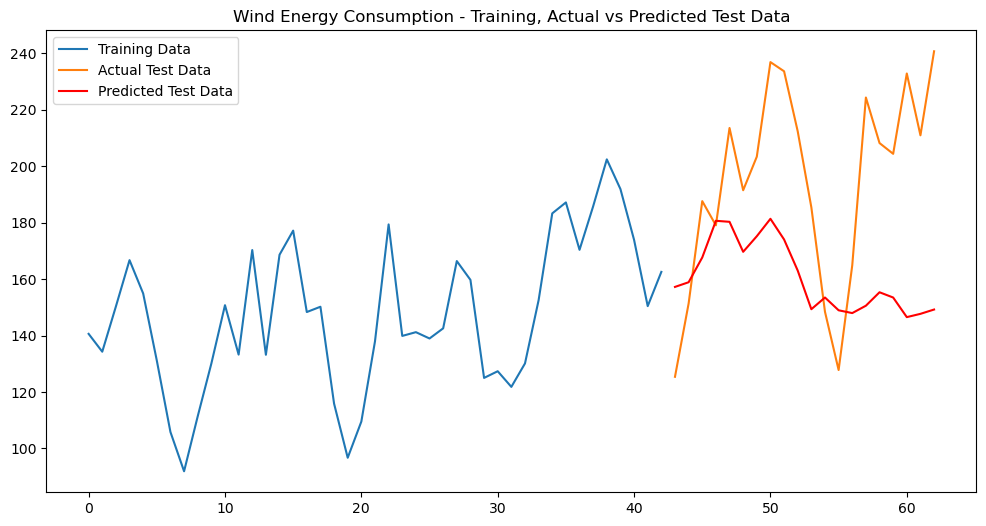

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=0.37 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=451.161, Time=0.01 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=449.382, Time=0.08 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=446.146, Time=0.08 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=474.479, Time=0.01 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=450.100, Time=0.04 sec
 ARIMA(0,0,1)(1,1,1)[12] intercept   : AIC=inf, Time=0.14 sec
 ARIMA(0,0,1)(0,1,2)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   : AIC=450.125, Time=0.08 sec
 ARIMA(0,0,1)(1,1,2)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(0,0,0)(0,1,1)[12] intercept   : AIC=446.872, Time=0.05 sec
 ARIMA(1,0,1)(0,1,1)[12] intercept   : AIC=444.033, Time=0.24 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=449.166, Time=0.06 sec
 ARIMA(1,0,1)(1,1,1)[12] intercept   : AIC=inf, Time=0.22 sec
 ARIMA(1,0,1)(0,1,2)[12] intercept   : AIC=inf, Time=

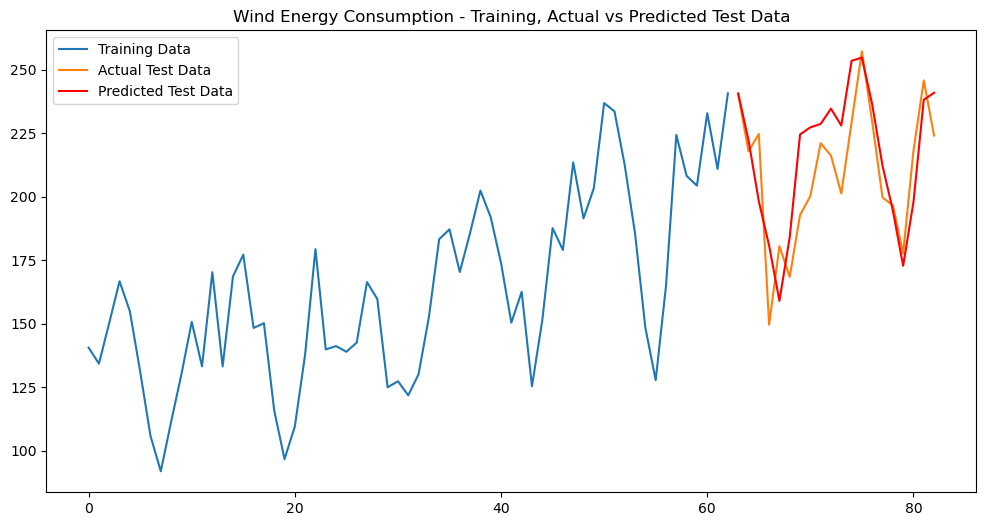

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=764.794, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=745.205, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=751.473, Time=0.06 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=762.929, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=766.261, Time=0.03 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=742.720, Time=0.16 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=754.580, Time=0.09 sec
 ARIMA(2,1,0)(2,0,0)[12] intercept   : AIC=737.930, Time=0.20 sec
 ARIMA(2,1,0)(1,0,0)[12] intercept   : AIC=742.185, Time=0.08 sec
 ARIMA(2,1,0)(2,0,1)[12] intercept   : AIC=inf, Time=0.61 sec
 ARIMA(2,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(3,1,0)(2,0,0)[12] intercept   : AIC=739.929, T

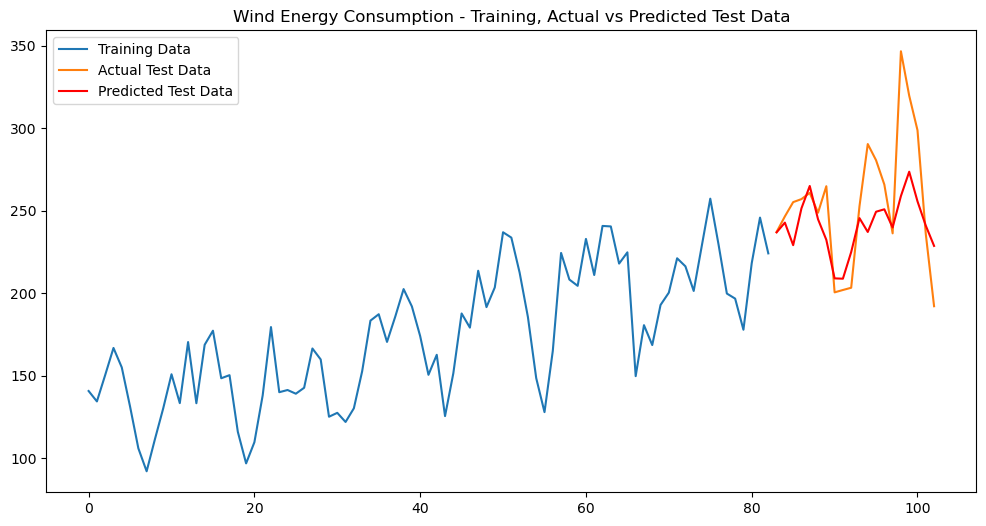

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=974.089, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=961.353, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=967.967, Time=0.09 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=972.121, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=975.698, Time=0.03 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=949.047, Time=0.15 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept   : AIC=936.546, Time=0.25 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(1,1,0)(2,0,2)[12] intercept   : AIC=inf, Time=0.66 sec
 ARIMA(1,1,0)(1,0,2)[12] intercept   : AIC=inf, Time=nan sec
 ARIMA(0,1,0)(2,0,1)[12] intercept   : AIC=inf, Time=0.37 sec
 ARIMA(2,1,0)(2,0,1)[12] intercept   : AIC=934.683, Time=0.42 sec
 ARIMA(2,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(2,1,0)(2,0,0)[12] intercept   : AIC=947.297, Time=0

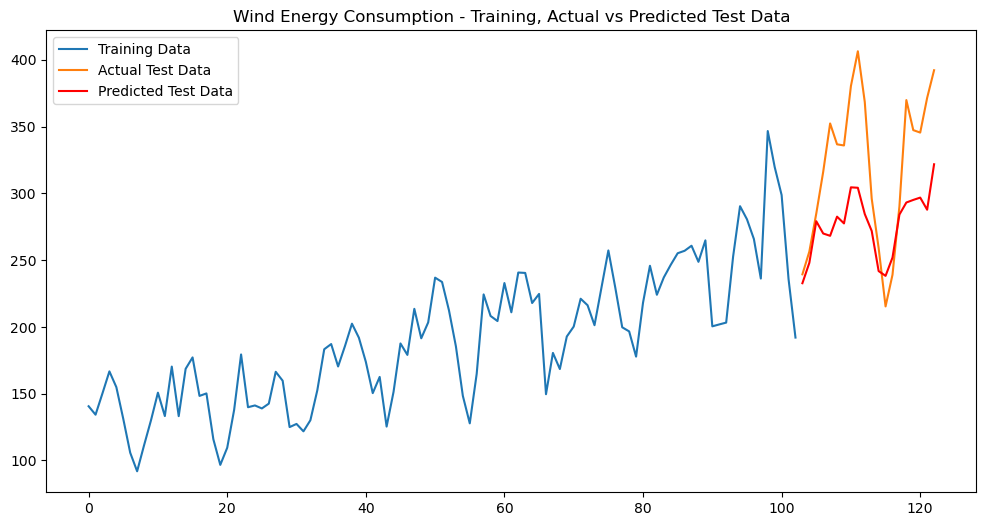

Average MAPE for Wind Energy Consumption: 12.46%
Average MSE for Wind Energy Consumption: 1493.76
Average RMSE for Wind Energy Consumption: 36.03
Average MAE for Wind Energy Consumption: 29.17


In [233]:
# Example of usage Wind
results_wind= fit_sarima_cv_new(df_REN_New, 'Wind Energy Consumption', n_splits=5)

In [234]:
# Accessing the results Wind
forecast_wind = results_wind['forecast']
mape_wind = results_wind['average_mape']
mse_wind = results_wind['average_mse']
rmse_wind = results_wind['average_rmse']
mae_wind = results_wind['average_mae']

In [235]:
mape_wind,mse_wind,rmse_wind,mae_wind

(12.46, 1494, 36, 29)

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=16.000, Time=0.12 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=99.886, Time=0.01 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=inf, Time=0.15 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=103.265, Time=0.05 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=100.461, Time=0.01 sec
 ARIMA(2,0,2)(0,1,1)[12] intercept   : AIC=14.000, Time=0.10 sec
 ARIMA(2,0,2)(0,1,0)[12] intercept   : AIC=12.000, Time=0.06 sec
 ARIMA(2,0,2)(1,1,0)[12] intercept   : AIC=14.000, Time=0.09 sec
 ARIMA(1,0,2)(0,1,0)[12] intercept   : AIC=inf, Time=0.12 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=inf, Time=0.11 sec
 ARIMA(3,0,2)(0,1,0)[12] intercept   : AIC=14.000, Time=0.06 sec
 ARIMA(2,0,3)(0,1,0)[12] intercept   : AIC=inf, Time=0.13 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=inf, Time=0.06 sec
 ARIMA(1,0,3)(0,1,0)[12] intercept   : AIC=inf, Time=0.08 sec
 ARIMA(3,0,1)(0,1,0)[12] intercept   : AIC=inf, Time=0.12 sec
 

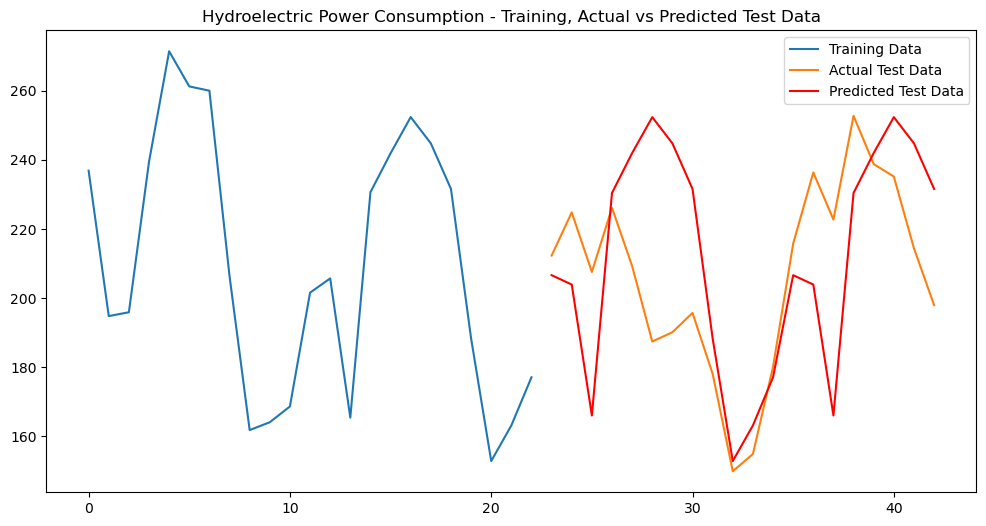

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=390.746, Time=0.22 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=425.427, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=385.581, Time=0.12 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=393.177, Time=0.05 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=584.122, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=401.455, Time=0.02 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=393.473, Time=0.22 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=387.295, Time=0.14 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=391.189, Time=0.09 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=0.28 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=410.945, Time=0.12 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=382.314, Time=0.16 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=395.866, Time=0.03 sec
 ARIMA(2,0,0)(2,0,0)[12] intercept   : AIC=391.126, Time=0.27 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   

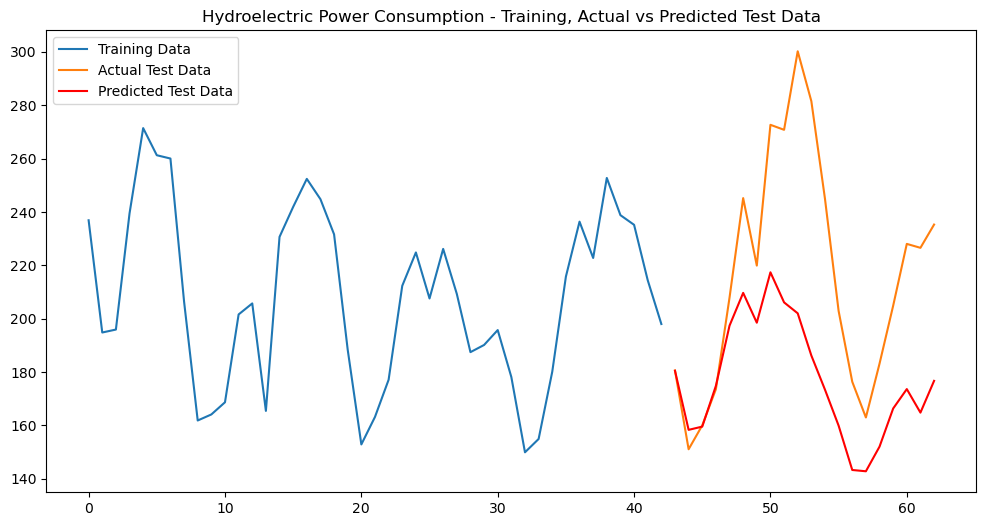

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=554.943, Time=0.28 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=635.007, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=556.069, Time=0.11 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.11 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=856.785, Time=0.01 sec
 ARIMA(2,0,2)(0,0,1)[12] intercept   : AIC=inf, Time=0.21 sec
 ARIMA(2,0,2)(1,0,0)[12] intercept   : AIC=556.480, Time=0.21 sec
 ARIMA(2,0,2)(2,0,1)[12] intercept   : AIC=inf, Time=0.49 sec
 ARIMA(2,0,2)(1,0,2)[12] intercept   : AIC=inf, Time=0.77 sec
 ARIMA(2,0,2)(0,0,0)[12] intercept   : AIC=577.280, Time=0.23 sec
 ARIMA(2,0,2)(0,0,2)[12] intercept   : AIC=inf, Time=0.49 sec
 ARIMA(2,0,2)(2,0,0)[12] intercept   : AIC=560.193, Time=0.44 sec
 ARIMA(2,0,2)(2,0,2)[12] intercept   : AIC=inf, Time=0.65 sec
 ARIMA(1,0,2)(1,0,1)[12] intercept   : AIC=555.041, Time=0.30 sec
 ARIMA(2,0,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.26

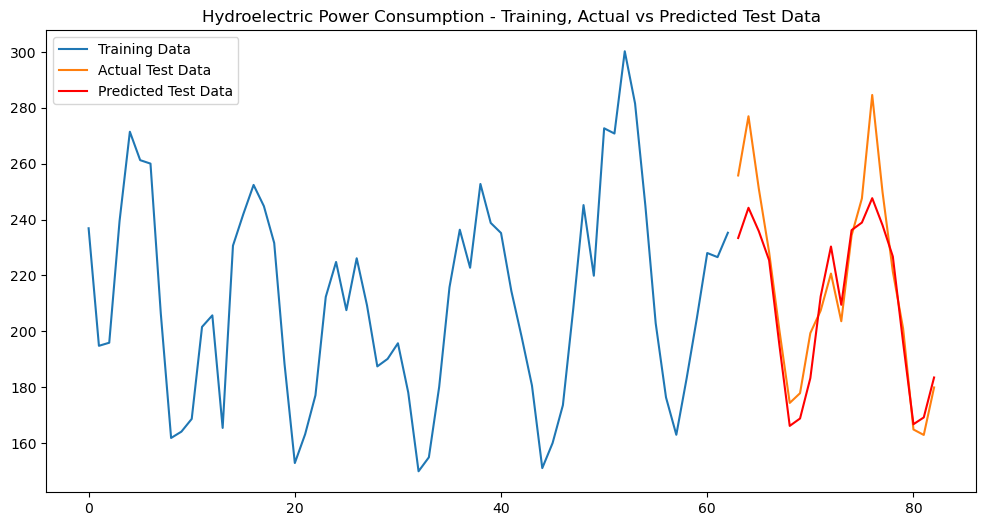

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=719.823, Time=0.42 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=834.723, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=714.057, Time=0.20 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.15 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1129.303, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=769.561, Time=0.03 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=714.438, Time=0.43 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=712.353, Time=0.33 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.15 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=0.82 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=727.423, Time=0.80 sec
 ARIMA(1,0,0)(0,0,2)[12] intercept   : AIC=730.050, Time=0.44 sec
 ARIMA(1,0,0)(2,0,2)[12] intercept   : AIC=inf, Time=0.55 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.12 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=710.858, 

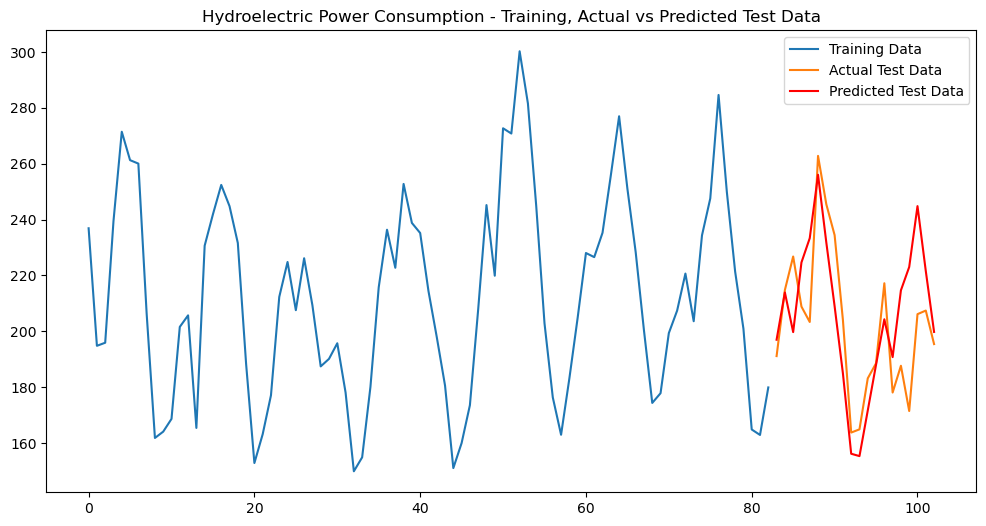

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.52 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1025.579, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=886.997, Time=0.18 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=924.706, Time=0.11 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1398.944, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=950.331, Time=0.04 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=895.683, Time=0.63 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=890.280, Time=0.38 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=910.445, Time=0.16 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=0.67 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=953.140, Time=0.15 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=887.086, Time=0.29 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=887.793, Time=0.28 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=905.134, Time=0.33 sec
 ARIMA(2,0,1)(1,0,0)[12] intercept   : 

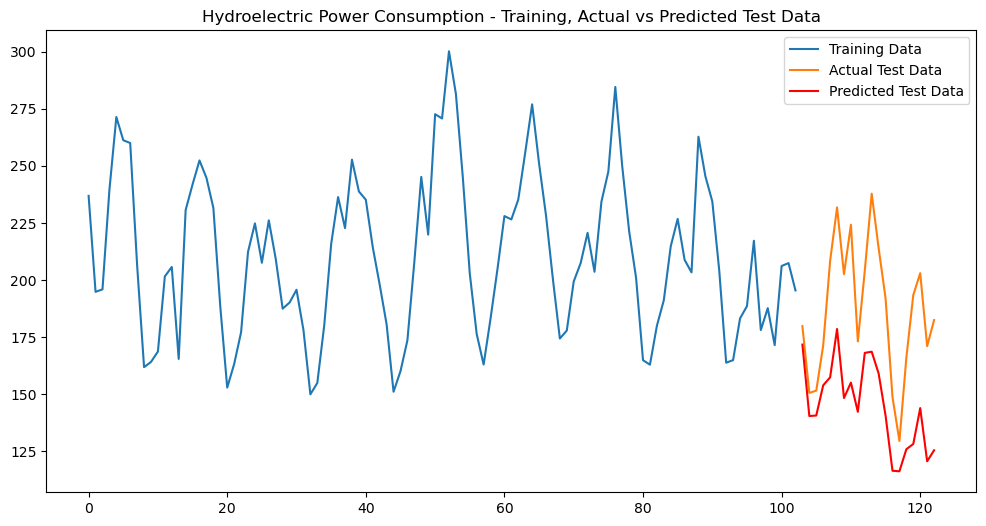

Average MAPE for Hydroelectric Power Consumption: 12.68%
Average MSE for Hydroelectric Power Consumption: 1240.19
Average RMSE for Hydroelectric Power Consumption: 32.43
Average MAE for Hydroelectric Power Consumption: 26.76


In [236]:
# Example of usage Hydroelectric
results_Hydr = fit_sarima_cv_new(df_REN_New, 'Hydroelectric Power Consumption', n_splits=5)

In [237]:
# Accessing the results Hydroelectric
forecast_Hydr = results_Hydr['forecast']
mape_Hydr = results_Hydr['average_mape']
mse_Hydr = results_Hydr['average_mse']
rmse_Hydr = results_Hydr['average_rmse']
mae_Hydr = results_Hydr['average_mae']

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=39.869, Time=0.27 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=43.239, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=36.919, Time=0.10 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.08 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=199.807, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=35.226, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=34.617, Time=0.08 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=36.638, Time=0.18 sec
 ARIMA(1,0,0)(0,0,2)[12] intercept   : AIC=inf, Time=0.19 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=38.352, Time=0.32 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.08 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=33.970, Time=0.17 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=34.547, Time=0.13 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=35.957, Time=0.19 sec
 ARIMA(2,0,0)(0,0,2)[12] intercept   : AIC=35.809, Time

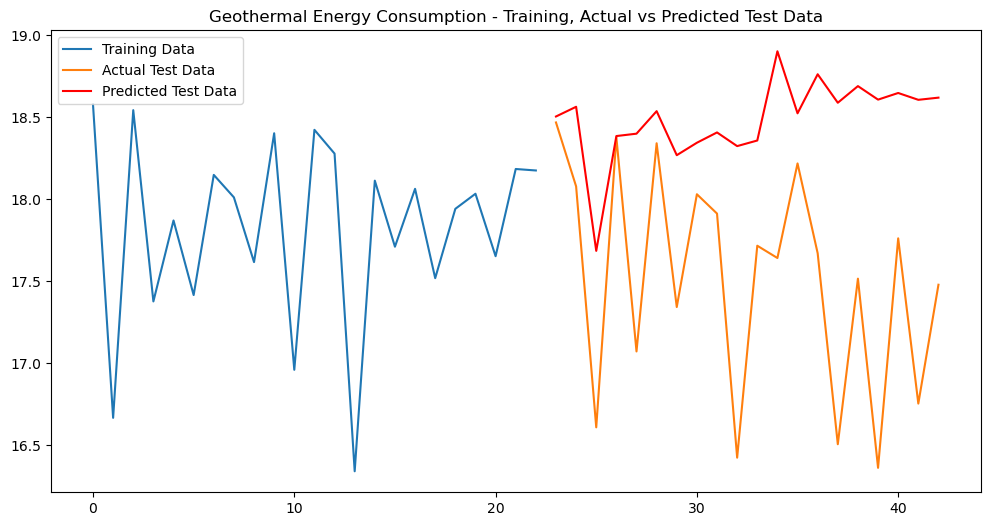

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=69.138, Time=0.45 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=125.816, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=73.402, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=123.843, Time=0.02 sec
 ARIMA(2,1,2)(0,0,1)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(2,1,2)(1,0,0)[12] intercept   : AIC=66.653, Time=0.31 sec
 ARIMA(2,1,2)(0,0,0)[12] intercept   : AIC=86.759, Time=0.08 sec
 ARIMA(2,1,2)(2,0,0)[12] intercept   : AIC=inf, Time=0.49 sec
 ARIMA(2,1,2)(2,0,1)[12] intercept   : AIC=70.496, Time=0.59 sec
 ARIMA(1,1,2)(1,0,0)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(2,1,1)(1,0,0)[12] intercept   : AIC=65.774, Time=0.14 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=84.755, Time=0.04 sec
 ARIMA(2,1,1)(2,0,0)[12] intercept   : AIC=67.737, Time=0.37 sec
 ARIMA(2,1,1)(1,0,1)[12] intercept   : AIC=67.630, Time=0

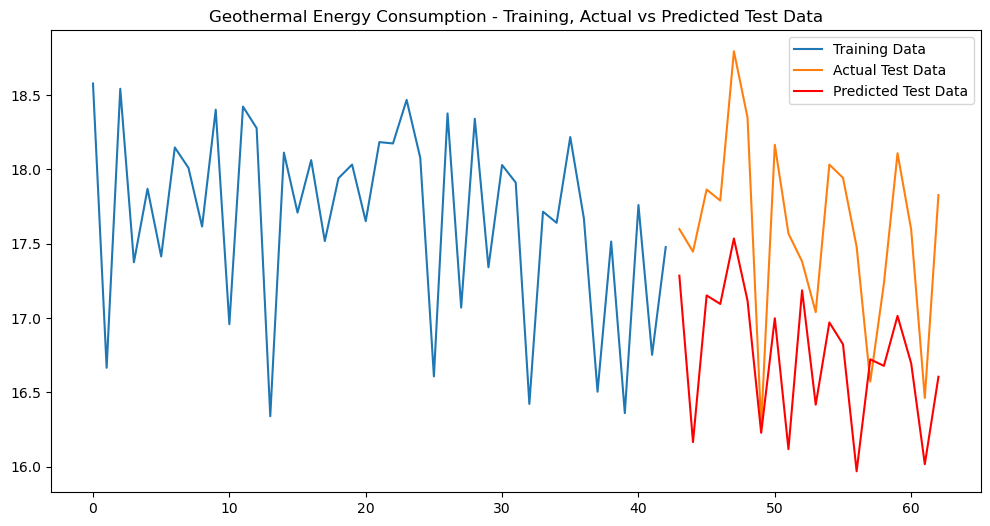

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=179.095, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=116.485, Time=0.05 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=177.104, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=149.599, Time=0.02 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=115.870, Time=0.12 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept   : AIC=113.632, Time=0.35 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.19 sec
 ARIMA(1,1,0)(2,0,2)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(1,1,0)(1,0,2)[12] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(0,1,0)(2,0,1)[12] intercept   : AIC=128.356, Time=0.19 sec
 ARIMA(2,1,0)(2,0,1)[12] intercept   : AIC=inf, Time=0.51 sec
 ARIMA(1,1,1)(2,0,1)[12] intercept   : AIC=inf, Time=0.56 sec
 ARIMA(0,1,1)(2,0,1)[12] intercept   : AIC=95.606, Time=0.75 

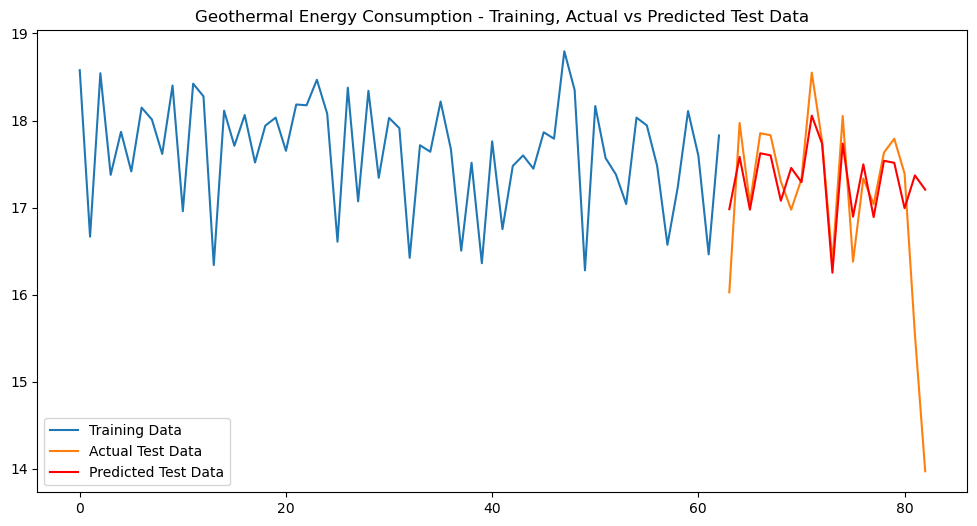

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=164.301, Time=0.30 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=241.584, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=174.491, Time=0.05 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=239.827, Time=0.01 sec
 ARIMA(2,1,2)(0,0,1)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(2,1,2)(1,0,0)[12] intercept   : AIC=inf, Time=0.28 sec
 ARIMA(2,1,2)(2,0,1)[12] intercept   : AIC=163.184, Time=0.56 sec
 ARIMA(2,1,2)(2,0,0)[12] intercept   : AIC=inf, Time=0.55 sec
 ARIMA(2,1,2)(2,0,2)[12] intercept   : AIC=165.016, Time=0.70 sec
 ARIMA(2,1,2)(1,0,2)[12] intercept   : AIC=161.853, Time=0.69 sec
 ARIMA(2,1,2)(0,0,2)[12] intercept   : AIC=inf, Time=0.52 sec
 ARIMA(1,1,2)(1,0,2)[12] intercept   : AIC=161.792, Time=0.67 sec
 ARIMA(1,1,2)(0,0,2)[12] intercept   : AIC=inf, Time=0.53 sec
 ARIMA(1,1,2)(1,0,1)[12] intercept   : AIC=164.091, Time=

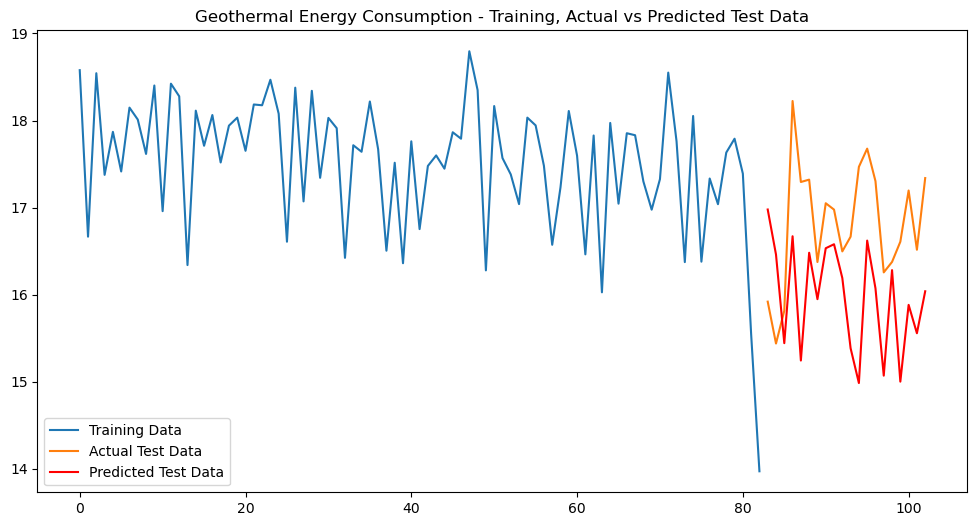

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.50 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=294.651, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=238.109, Time=0.05 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=292.666, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=260.999, Time=0.02 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=222.986, Time=0.15 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept   : AIC=220.001, Time=0.27 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=219.359, Time=0.21 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=249.447, Time=0.05 sec
 ARIMA(1,1,0)(1,0,2)[12] intercept   : AIC=220.058, Time=0.33 sec
 ARIMA(1,1,0)(0,0,2)[12] intercept   : AIC=235.790, Time=0.11 sec
 ARIMA(1,1,0)(2,0,2)[12] intercept   : AIC=221.956, Time=0.48 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=225.127, Time=0.16 sec
 ARIMA(2,1,0)(1,0,1)[12] intercept   : AI

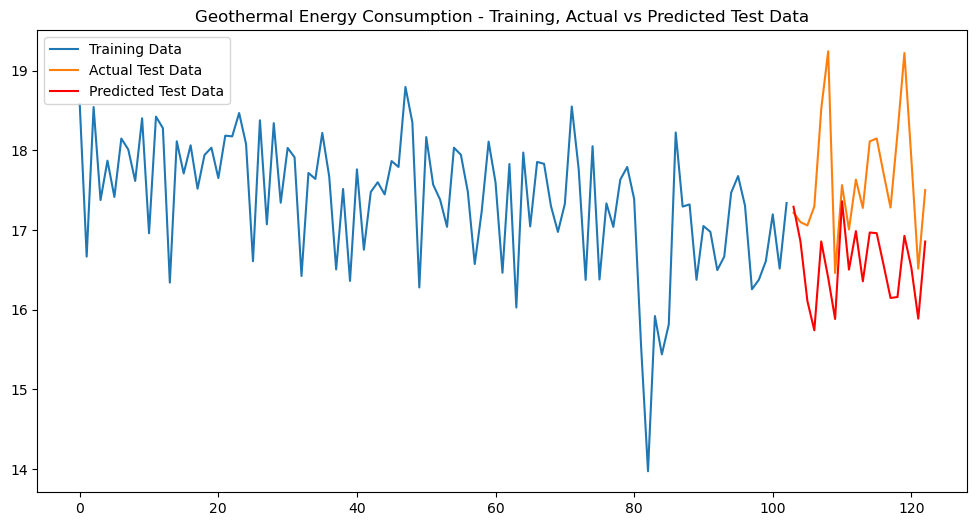

Average MAPE for Geothermal Energy Consumption: 5.20%
Average MSE for Geothermal Energy Consumption: 1.25
Average RMSE for Geothermal Energy Consumption: 1.11
Average MAE for Geothermal Energy Consumption: 0.90


In [238]:
# Example of usage Geothermal
results_Geo = fit_sarima_cv_new(df_REN_New, 'Geothermal Energy Consumption', n_splits=5)

In [239]:
# Accessing the results Geothermal
forecast_Geo = results_Geo['forecast']
mape_Geo = results_Geo['average_mape']
mse_Geo = results_Geo['average_mse']
rmse_Geo = results_Geo['average_rmse']
mae_Geo = results_Geo['average_mae']

In [240]:
mape_Geo,mse_Geo,rmse_Geo,mae_Geo

(5.2, 1, 1, 1)

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=69.279, Time=0.33 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=59.169, Time=0.01 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=62.799, Time=0.03 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=62.690, Time=0.03 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=61.169, Time=0.02 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=61.169, Time=0.02 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=63.169, Time=0.02 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=60.799, Time=0.01 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=60.690, Time=0.01 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=62.668, Time=0.02 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=58.072, Time=0.01 sec
 ARIMA(0,1,0)(1,1,0)[12] intercept   : AIC=60.072, Time=0.01 sec
 ARIMA(0,1,0)(0,1,1)[12] intercept   : AIC=60.072, Time=0.01 sec
 ARIMA(0,1,0)(1,1,1)[12] intercept   : AIC=62.072, Time=0.02 sec
 ARIMA(1,1,0)(0,1,0)[12] intercept   : AIC=59.9

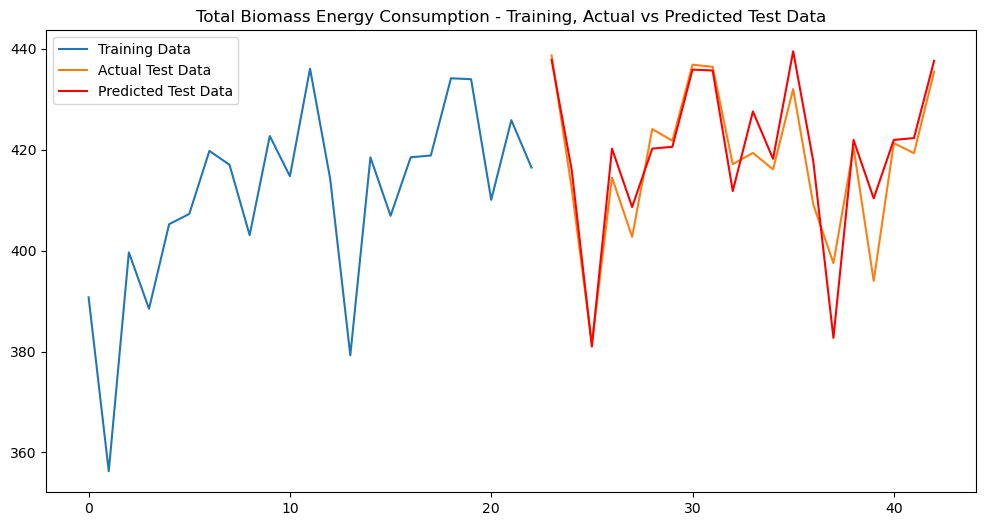

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=0.32 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=201.798, Time=0.01 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=203.635, Time=0.03 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=201.682, Time=0.03 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=199.954, Time=0.02 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=201.638, Time=0.03 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=inf, Time=0.17 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=201.254, Time=0.02 sec
 ARIMA(0,1,2)(0,1,0)[12]             : AIC=200.431, Time=0.02 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=202.250, Time=0.02 sec
 ARIMA(1,1,2)(0,1,0)[12]             : AIC=201.830, Time=0.04 sec
 ARIMA(0,1,1)(0,1,0)[12] intercept   : AIC=199.529, Time=0.02 sec
 ARIMA(0,1,1)(1,1,0)[12] intercept   : AIC=201.492, Time=0.04 sec
 ARIMA(0,1,1)(0,1,1)[12] intercept   : AIC=201.496, Time=0.05 sec
 ARIMA(0,1,1)(1,1,1)[12] intercept   : AI

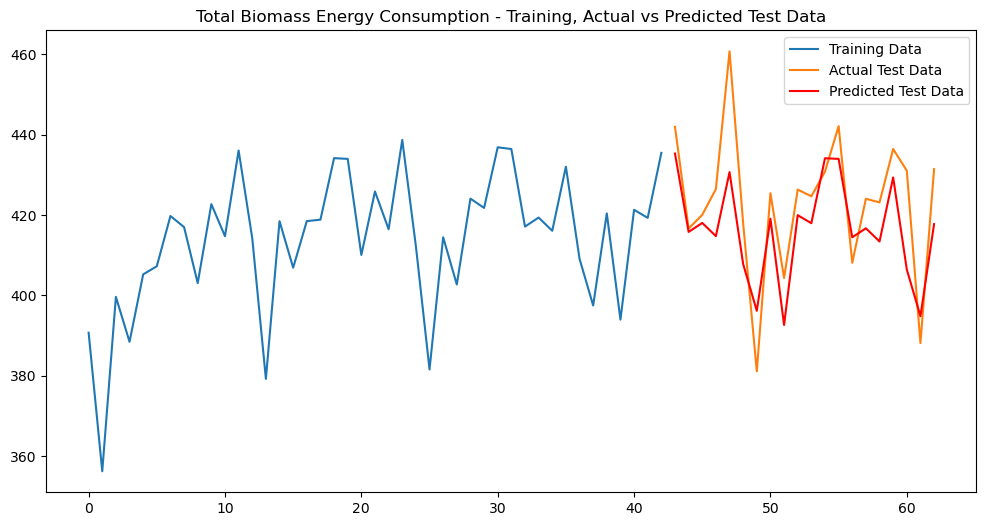

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=0.31 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=380.908, Time=0.01 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=369.723, Time=0.04 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.14 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=378.752, Time=0.02 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=370.104, Time=0.12 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=inf, Time=0.19 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=inf, Time=0.16 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=inf, Time=0.59 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=376.125, Time=0.05 sec
 ARIMA(2,1,0)(1,1,0)[12]             : AIC=361.203, Time=0.09 sec
 ARIMA(2,1,0)(0,1,0)[12]             : AIC=369.247, Time=0.04 sec
 ARIMA(2,1,0)(2,1,0)[12]             : AIC=361.602, Time=0.17 sec
 ARIMA(2,1,0)(1,1,1)[12]             : AIC=inf, Time=0.27 sec
 ARIMA(2,1,0)(0,1,1)[12]             : AIC=inf, Time=0.16

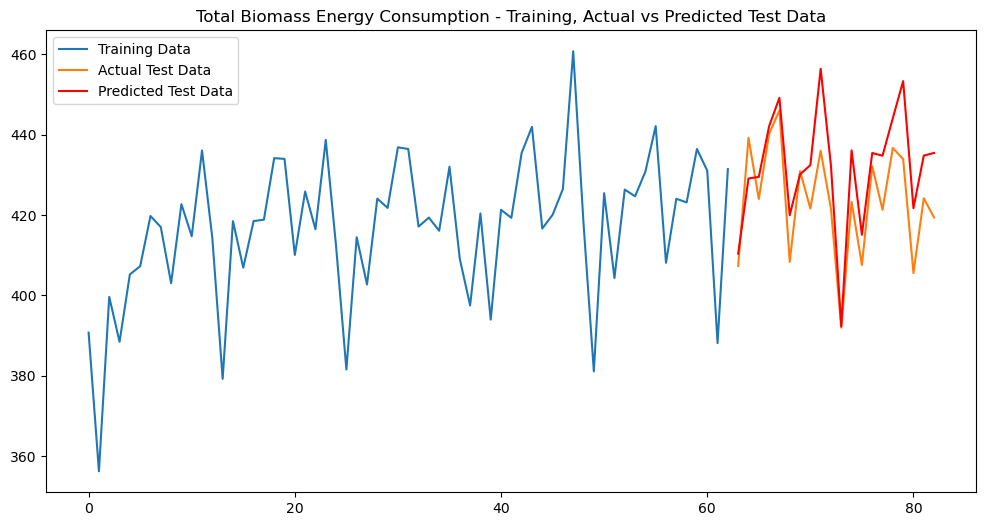

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=0.30 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=523.217, Time=0.01 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=505.118, Time=0.06 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=483.475, Time=0.08 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=499.415, Time=0.03 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=484.962, Time=0.14 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=484.857, Time=0.16 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=490.602, Time=0.06 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=486.803, Time=0.32 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=508.596, Time=0.06 sec
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=485.461, Time=0.12 sec
 ARIMA(0,1,2)(0,1,1)[12]             : AIC=485.450, Time=0.13 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=496.316, Time=0.07 sec
 ARIMA(1,1,2)(0,1,1)[12]             : AIC=486.907, Time=0.18 sec
 ARIMA(0,1,1)(0,1,1)[12] intercept   

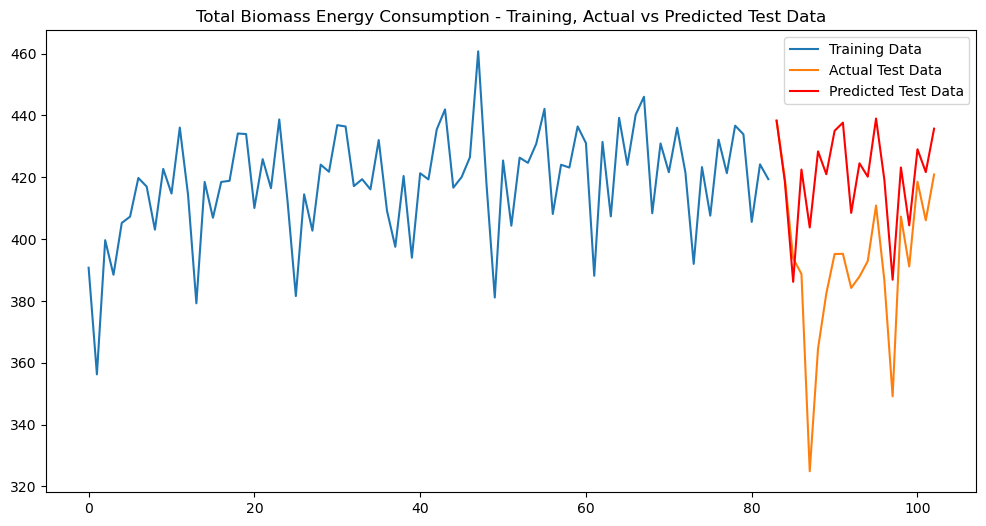

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=862.858, Time=0.60 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=927.478, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=891.398, Time=0.26 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=885.921, Time=0.16 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1535.605, Time=0.02 sec
 ARIMA(2,0,2)(0,0,1)[12] intercept   : AIC=883.758, Time=0.50 sec
 ARIMA(2,0,2)(1,0,0)[12] intercept   : AIC=860.710, Time=0.51 sec
 ARIMA(2,0,2)(0,0,0)[12] intercept   : AIC=909.527, Time=0.28 sec
 ARIMA(2,0,2)(2,0,0)[12] intercept   : AIC=871.881, Time=0.78 sec
 ARIMA(2,0,2)(2,0,1)[12] intercept   : AIC=879.153, Time=0.73 sec
 ARIMA(1,0,2)(1,0,0)[12] intercept   : AIC=860.309, Time=0.29 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=907.793, Time=0.07 sec
 ARIMA(1,0,2)(2,0,0)[12] intercept   : AIC=865.662, Time=0.51 sec
 ARIMA(1,0,2)(1,0,1)[12] intercept   : AIC=868.485, Time=0.44 sec
 ARIMA(1,0,2)(0,0,1)[12] interce

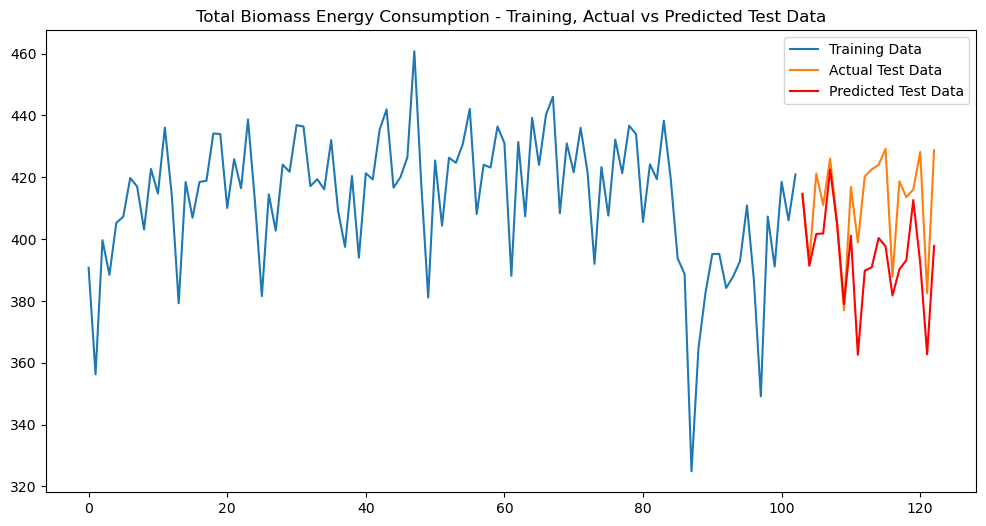

Average MAPE for Total Biomass Energy Consumption: 3.46%
Average MSE for Total Biomass Energy Consumption: 388.44
Average RMSE for Total Biomass Energy Consumption: 17.04
Average MAE for Total Biomass Energy Consumption: 13.86


In [241]:
# Example of usage Biomass
results_Bio = fit_sarima_cv_new(df_REN_New, 'Total Biomass Energy Consumption', n_splits=5)

In [242]:
# Accessing the results Biomass
forecast_Bio = results_Bio['forecast']
mape_Bio = results_Bio['average_mape']
mse_Bio = results_Bio['average_mse']
rmse_Bio = results_Bio['average_rmse']
mae_Bio = results_Bio['average_mae']

In [247]:
mape_Bio,mse_Bio,rmse_Bio,mae_Bio

(3.46, 388, 17, 14)

In [248]:
last_date_RE = df_REN_New['Month'].max()
forecast_dates_RE = [(last_date_RE + pd.DateOffset(months=j)).date() for j in range(1, 101)]

In [249]:
last_date_RE

Timestamp('2023-03-31 00:00:00')

In [250]:
#forecast_dates_RE

In [251]:
df_REN_New = df_REN_New.rename(columns= {'Solar Energy Consumption': 'Solar',
    'Wind Energy Consumption': 'Wind',
    'Hydroelectric Power Consumption': 'Hydroelectric',
    'Geothermal Energy Consumption': 'Geothermal',
    'Total Biomass Energy Consumption': 'Biomass'                                    
})

In [252]:
df_REN_New.columns

Index(['Month', 'Solar', 'Wind', 'Hydroelectric', 'Geothermal', 'Biomass'], dtype='object')

In [253]:
df_forecast_RE = pd.DataFrame({
    'Month': forecast_dates_RE,
    'Solar':forecast_Solar,
    'Wind':forecast_wind,
    'Hydroelectric':forecast_Hydr,
    'Geothermal':forecast_Geo,
    'Biomass':forecast_Bio
})
    

In [254]:
df_forecast_RE.head()

,Month,Solar,Wind,Hydroelectric,Geothermal,Biomass
0,2023-04-30,22.619203,133.260,206.649813,18.504316,437.796
1,2023-05-31,19.987504,170.318,203.934522,18.563552,415.963
2,2023-06-30,20.746812,133.208,166.048878,17.684701,380.973
3,2023-07-31,28.675971,168.651,230.441270,18.384984,420.217
4,2023-08-31,31.295705,177.205,241.987037,18.399480,408.638


In [255]:
df_forecast_RE.tail()

,Month,Solar,Wind,Hydroelectric,Geothermal,Biomass
95,2031-03-31,115.058410,293.212238,125.854223,16.158710,393.194083
96,2031-04-30,106.592916,295.150204,128.146083,16.926402,412.649156
97,2031-05-31,113.320264,296.883804,143.873251,16.527358,392.319011
98,2031-06-30,122.228916,287.820526,120.576364,15.887333,362.747877
99,2031-07-31,159.209441,321.844199,125.379639,16.855244,397.808574


In [256]:
df_final_RE = pd.concat([df_REN_New, df_forecast_RE], ignore_index=True)

In [257]:
df_final_RE.tail()

,Month,Solar,Wind,Hydroelectric,Geothermal,Biomass
218,2031-03-31,115.058410,293.212238,125.854223,16.158710,393.194083
219,2031-04-30,106.592916,295.150204,128.146083,16.926402,412.649156
220,2031-05-31,113.320264,296.883804,143.873251,16.527358,392.319011
221,2031-06-30,122.228916,287.820526,120.576364,15.887333,362.747877
222,2031-07-31,159.209441,321.844199,125.379639,16.855244,397.808574


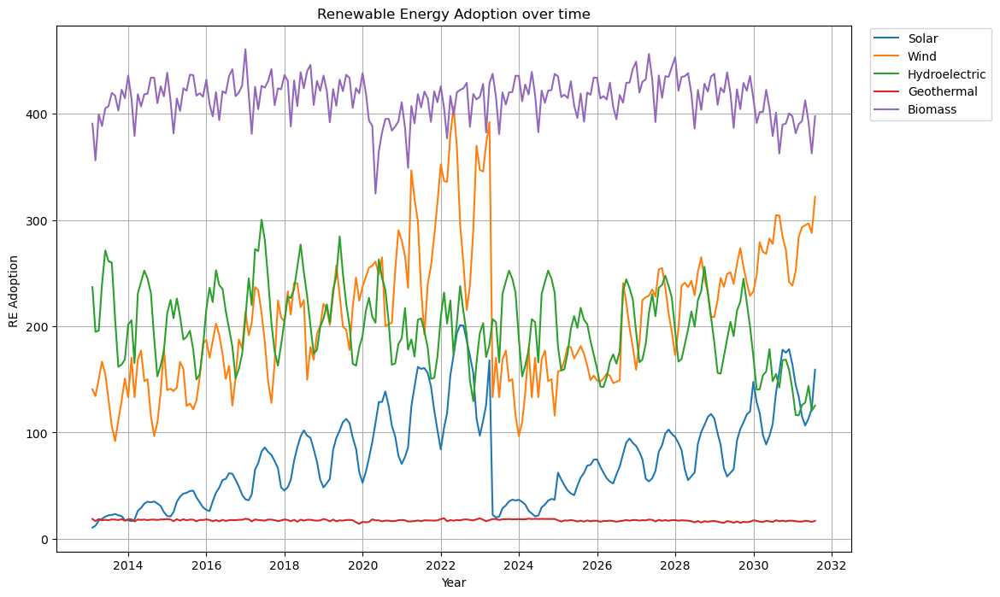

In [258]:
# Set 'Month' as index
#df_final.set_index('Month', inplace=True)

#Now we can check timeseries for all sectors
df_final_RE.set_index('Month').plot(figsize=(12,8))
plt.title('Renewable Energy Adoption over time')
plt.legend(loc ='upper center', bbox_to_anchor =(1.1,1.0), ncol=1, borderaxespad =0.2)
plt.xlabel('Year')
plt.ylabel('RE Adoption ')
plt.grid(True)
# Draw the vertical line to denote the boundary
#ax.axvline(x=boundary_date, color='gray', linestyle='--', label='Boundary between actual and prediction')

plt.show()

In [259]:
df_REN_New.head()

,Month,Solar,Wind,Hydroelectric,Geothermal,Biomass
0,2013-01-31,10.501,140.620,236.889,18.578,390.743
1,2013-02-28,12.261,134.295,194.813,16.666,356.257
2,2013-03-31,17.116,150.325,195.918,18.543,399.652
3,2013-04-30,18.712,166.741,239.451,17.376,388.467
4,2013-05-31,20.817,154.933,271.442,17.870,405.242


In [267]:
df_REN_New.tail()

,Month,Solar,Wind,Hydroelectric,Geothermal,Biomass
118,2022-11-30,113.371,369.911,165.952,18.210,413.563
119,2022-12-31,97.043,347.413,193.419,19.222,416.046
120,2023-01-31,111.130,345.584,203.008,17.898,428.189
121,2023-02-28,125.968,371.578,171.028,16.514,382.496
122,2023-03-31,167.991,392.279,182.453,17.502,428.760


In [268]:
import itertools
from statsmodels.tsa.statespace.sarimax import SARIMAX

# Assuming df_REN_New['Solar Energy Consumption'] contains your solar series

# Define the p, d and q parameters to take any value between 0 and 2
p = d = q = range(0, 3)

# Generate all different combinations of p, q, and d triplets
pdq = list(itertools.product(p, d, q))

# Generate all different combinations of seasonal p, q, and d triplets
seasonal_pdq = [(x[0], x[1], x[2], 12) for x in pdq]

min_aic = float('inf')
best_order = best_seasonal_order = None

for param in pdq:
    for param_seasonal in seasonal_pdq:
        try:
            mod = SARIMAX(df_REN_New['Solar'],
                          order=param,
                          seasonal_order=param_seasonal,
                          enforce_stationarity=False,
                          enforce_invertibility=False)
            
            results = mod.fit()
            
            if results.aic < min_aic:
                min_aic = results.aic
                best_order = param
                best_seasonal_order = param_seasonal

        except:
            continue

print(f"Best ARIMA order: {best_order} with seasonal order {best_seasonal_order}")

# Build the model with the best parameters
mod = SARIMAX(df_REN_New['Solar'],
              order=best_order,
              seasonal_order=best_seasonal_order,
              enforce_stationarity=False,
              enforce_invertibility=False)
results = mod.fit()

# Forecast the next 12 months
forecast = results.get_forecast(steps=12)


Best ARIMA order: (0, 1, 2) with seasonal order (0, 2, 2, 12)


In [262]:
forecast

In [269]:
print(df_REN_New.index.min())
print(df_REN_New.index.max())

0
122


In [270]:
forecast_data = []

In [271]:
def fit_sarima_with_forecast(data, sector_name, forecast_steps=100):
    # Determine the best SARIMA order with auto_arima
    best_fit = auto_arima(data[sector_name], seasonal=True, m=12, trace=True,
                          error_action='ignore', suppress_warnings=True, stepwise=True)
    
    print(f"Best SARIMA order for {sector_name}: {best_fit.order}")
    print(f"Best seasonal order for {sector_name}: {best_fit.seasonal_order}")
    
    # Fit the SARIMA model using the best orders
    model = SARIMAX(data[sector_name], order=best_fit.order, seasonal_order=best_fit.seasonal_order)
    model_fit = model.fit(disp=0)
    
    # Get in-sample predictions to visualize fit
    predictions = model_fit.get_prediction(start=1, end=len(data)).predicted_mean
    
    # Compute MAPE
    mape = ((abs(data[sector_name] - predictions) / data[sector_name]) * 100).mean()
    print(f"Mean Absolute Percentage Error for {sector_name}: {mape:.2f}%")
    
    # Accuracy in percentage
    accuracy = 100 - mape
    print(f"Accuracy for {sector_name}: {accuracy:.2f}%")
    
    mse = mean_squared_error(data[sector_name], predictions)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(data[sector_name], predictions)  
        
       
        
    
    # Out-of-sample forecasting for 'forecast_steps' into the future
    forecast = model_fit.get_forecast(steps=forecast_steps).predicted_mean

    # Plot actual vs predicted values and forecasts
    plt.figure(figsize=(12, 6))
    plt.plot(data[sector_name], label="Actual")
    plt.plot(data.index, predictions, color='red', label="Predicted")
    plt.plot(np.arange(len(data), len(data) + forecast_steps), forecast, color='green', label="Forecast")
    plt.title(f"{sector_name} - Actual vs Predicted vs Forecasted")
    plt.legend()
    plt.show()

    
    print(f"MAPE for {sector_name}: {mape:.2f}%")
    print(f"Accuracy for {sector_name}: {accuracy:.2f}%")
    print(f"MSE for {sector_name}: {mse:.2f}")
    print(f"RMSE for {sector_name}: {rmse:.2f}")
    print(f"MAE for {sector_name}: {mae:.2f}")
  
    
    # Return the results as a dictionary
    results = {
       
        "forecast": forecast,
        "mape": float(f"{mape:.2f}"),
        "Accuracy": float(f"{accuracy:.2f}"), 
        "mse": int(round(mse)),
        "rmse": int(round(rmse)),
        "mae": int(round(mae))
        
        
    }

    return results
   

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=697.709, Time=0.49 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=707.210, Time=0.00 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=696.706, Time=0.06 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=699.973, Time=0.05 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=705.413, Time=0.78 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=697.184, Time=0.08 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=697.613, Time=0.11 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=700.063, Time=0.07 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=inf, Time=0.61 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=694.956, Time=0.03 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=696.186, Time=0.08 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=696.314, Time=0.08 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=698.559, Time=0.06 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=inf, Time=0.50 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AI

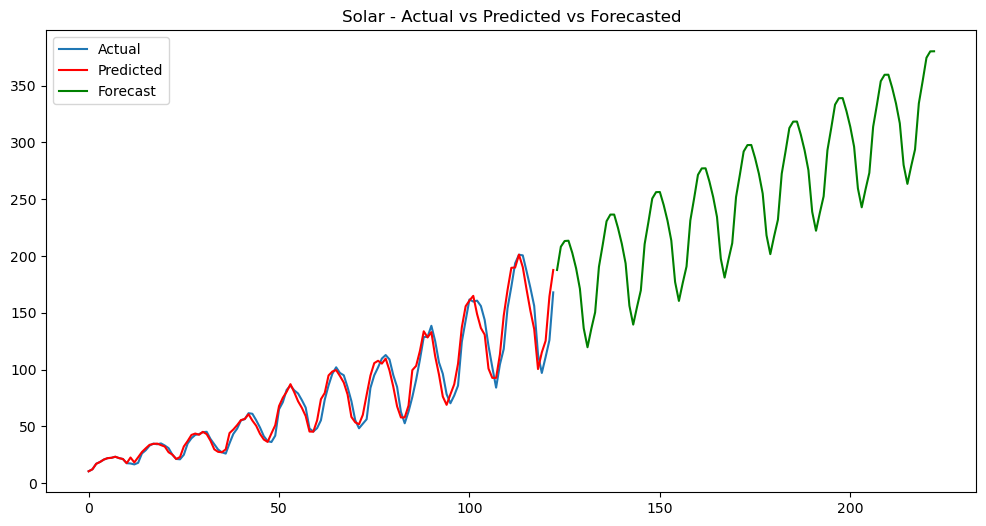

MAPE for Solar: 5.60%
Accuracy for Solar: 94.40%
MSE for Solar: 96.61
RMSE for Solar: 9.83
MAE for Solar: 6.84


In [272]:
results_Solar = fit_sarima_with_forecast(df_REN_New, 'Solar')

In [273]:
# Accessing the results for Solar
forecast_Solar_new = results_Solar ['forecast']
MAPE_Solar = results_Solar ['mape']
Accuracy_Solar = results_Solar ['Accuracy']
MSE_Solar = results_Solar ['mse']
RMSE_Solar = results_Solar ['rmse']
MAE_Solar = results_Solar ['mae']

In [274]:
MAPE_Solar, Accuracy_Solar , MSE_Solar,RMSE_Solar, MAE_Solar


(5.6, 94.4, 97, 10, 7)

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.49 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1180.097, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1162.071, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1171.217, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1178.673, Time=0.00 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1181.796, Time=0.03 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=1151.142, Time=0.19 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept   : AIC=1140.794, Time=0.35 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=1138.820, Time=0.20 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=1171.386, Time=0.06 sec
 ARIMA(1,1,0)(1,0,2)[12] intercept   : AIC=1140.794, Time=0.40 sec
 ARIMA(1,1,0)(0,0,2)[12] intercept   : AIC=1167.352, Time=0.24 sec
 ARIMA(1,1,0)(2,0,2)[12] intercept   : AIC=inf, Time=0.44 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.22 sec
 ARIMA(2,1,0)(1,0,1)[12] intercept

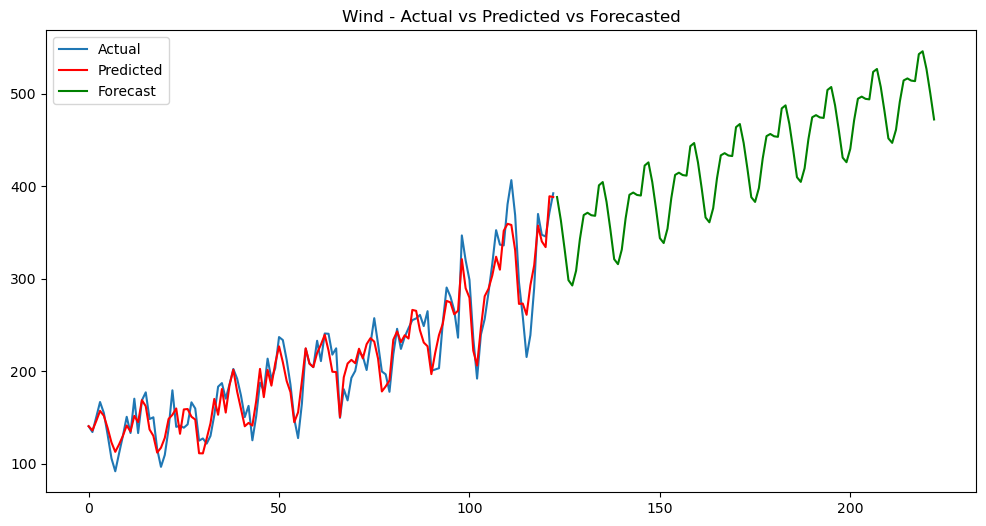

MAPE for Wind: 9.06%
Accuracy for Wind: 90.94%
MSE for Wind: 326.55
RMSE for Wind: 18.07
MAE for Wind: 14.64


In [275]:
results_Wind = fit_sarima_with_forecast(df_REN_New, 'Wind')

In [276]:
# Accessing the results for Wind
forecast_Wind_new = results_Wind ['forecast']
MAPE_Wind = results_Wind ['mape']
Accuracy_Wind = results_Solar ['Accuracy']
MSE_Wind = results_Wind ['mse']
RMSE_Wind = results_Wind ['rmse']
MAE_Wind = results_Wind ['mae']



In [277]:
MAPE_Wind,Accuracy_Wind,MSE_Wind,RMSE_Wind,MAE_Wind

(9.06, 94.4, 327, 18, 15)

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1097.027, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1005.180, Time=0.20 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1052.681, Time=0.09 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1833.209, Time=0.00 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1082.331, Time=0.03 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=1067.653, Time=0.56 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=1042.477, Time=0.20 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=1043.870, Time=0.66 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=1059.966, Time=0.21 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=1047.085, Time=0.23 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=1029.585, Time=0.23 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=1020.016, Time=0.19 sec
 ARIMA(2,0,1)(1,0,0)[12] inte

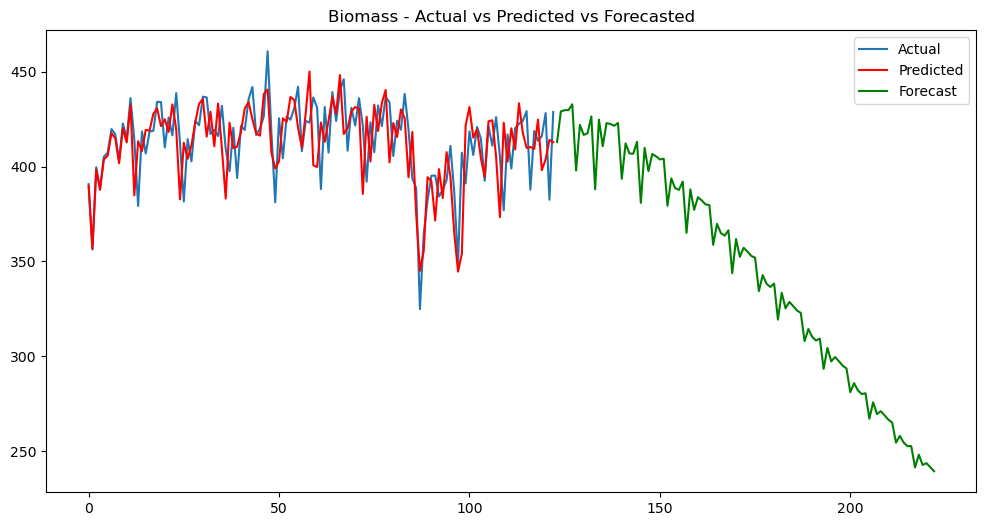

MAPE for Biomass: 2.55%
Accuracy for Biomass: 97.45%
MSE for Biomass: 319.44
RMSE for Biomass: 17.87
MAE for Biomass: 14.23


In [288]:
results_Biomass = fit_sarima_with_forecast(df_REN_New, 'Biomass')

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=350.923, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=283.075, Time=0.05 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=280.370, Time=0.07 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=348.932, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=290.263, Time=0.02 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.28 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=273.318, Time=0.14 sec
 ARIMA(0,1,1)(1,0,2)[12] intercept   : AIC=251.964, Time=0.47 sec
 ARIMA(0,1,1)(2,0,2)[12] intercept   : AIC=inf, Time=0.73 sec
 ARIMA(0,1,1)(2,0,1)[12] intercept   : AIC=inf, Time=0.48 sec
 ARIMA(0,1,0)(1,0,2)[12] intercept   : AIC=263.915, Time=0.40 sec
 ARIMA(1,1,1)(1,0,2)[12] intercept   : AIC=238.958, Time=0.84 sec
 ARIMA(1,1,1)(0,0,2)[12] intercept   : AIC=inf, Time=0.72 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=238.004, T

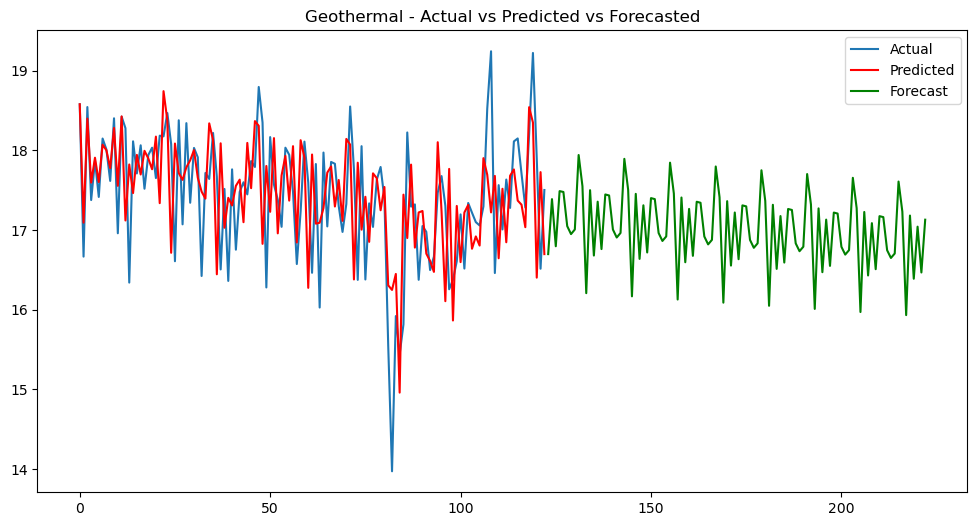

MAPE for Geothermal: 2.57%
Accuracy for Geothermal: 97.43%
MSE for Geothermal: 0.63
RMSE for Geothermal: 0.79
MAE for Geothermal: 0.64


In [289]:
results_Geothermal = fit_sarima_with_forecast(df_REN_New, 'Geothermal')

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.48 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1225.782, Time=0.00 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1054.649, Time=0.19 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1105.286, Time=0.08 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1665.827, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1138.113, Time=0.02 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=1053.051, Time=0.44 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=0.55 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1053.609, Time=0.27 sec
 ARIMA(0,0,0)(2,0,0)[12] intercept   : AIC=1138.256, Time=0.37 sec
 ARIMA(2,0,0)(2,0,0)[12] intercept   : AIC=1062.781, Time=0.54 sec
 ARIMA(1,0,1)(2,0,0)[12] intercept   : AIC=1067.291, Time=0.49 sec
 ARIMA(0,0,1)(2,0,0)[12] intercept   : AIC=1122.025, Time=0.45 sec
 ARIMA(2,0,1)(2,0,0)[12] intercept   : AIC=inf, Time=0.56 sec
 ARIMA(1,0,0)(2,0,0)[12]          

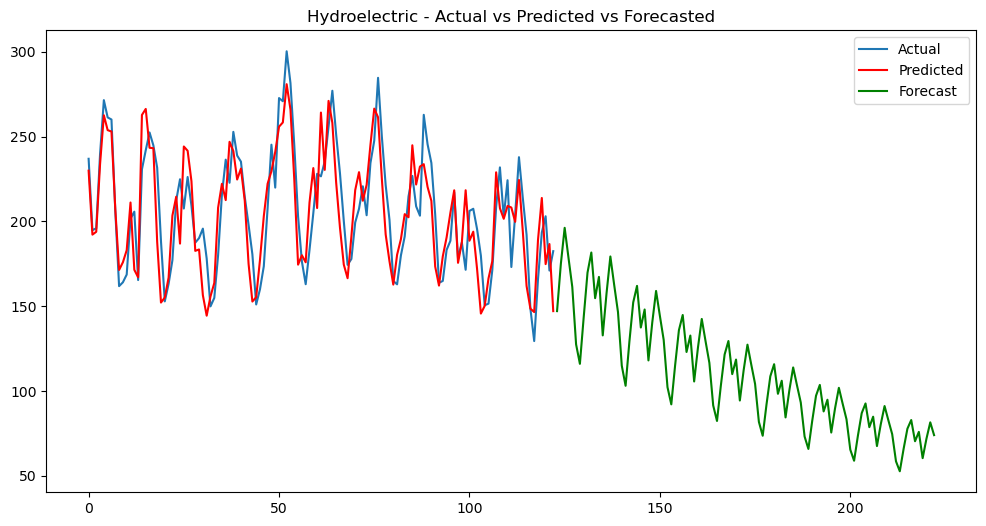

MAPE for Hydroelectric: 6.45%
Accuracy for Hydroelectric: 93.55%
MSE for Hydroelectric: 410.19
RMSE for Hydroelectric: 20.25
MAE for Hydroelectric: 16.96


In [290]:
results_Hydroelectric = fit_sarima_with_forecast(df_REN_New, 'Hydroelectric')

In [291]:
df_forecast_RE_New = pd.DataFrame({
    'Month': forecast_dates_RE,
    'Solar':forecast_Solar_new,
    'Wind':forecast_Wind_new,
    'Hydroelectric':forecast_Hydr,
    'Geothermal':forecast_Geo,
    'Biomass':forecast_Bio
})
    

In [292]:
df_forecast_RE_New.head()

,Month,Solar,Wind,Hydroelectric,Geothermal,Biomass
123,2023-04-30,187.686084,388.212475,206.649813,18.504316,437.796
124,2023-05-31,208.197193,363.088417,203.934522,18.563552,415.963
125,2023-06-30,213.194596,331.517155,166.048878,17.684701,380.973
126,2023-07-31,213.464985,298.351641,230.441270,18.384984,420.217
127,2023-08-31,202.754984,292.643074,241.987037,18.399480,408.638


In [293]:
df_forecast_RE_New.tail()

,Month,Solar,Wind,Hydroelectric,Geothermal,Biomass
218,2031-03-31,334.355810,542.576909,125.854223,16.158710,393.194083
219,2031-04-30,353.924430,545.685507,128.146083,16.926402,412.649156
220,2031-05-31,374.484355,526.625102,143.873251,16.527358,392.319011
221,2031-06-30,380.128211,500.348042,120.576364,15.887333,362.747877
222,2031-07-31,380.213579,472.012411,125.379639,16.855244,397.808574


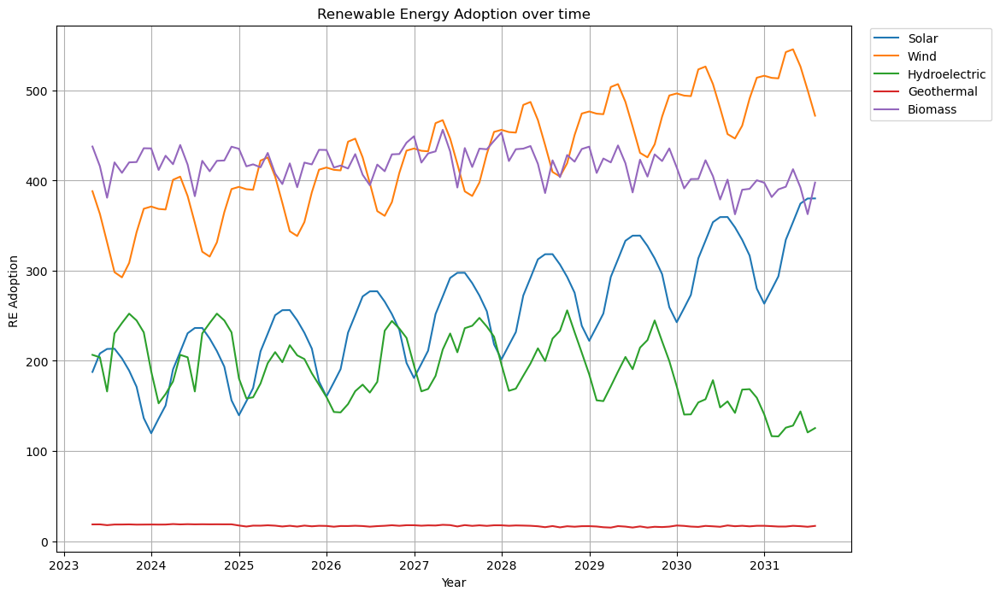

In [294]:
# Set 'Month' as index
#df_final.set_index('Month', inplace=True)

#Now we can check timeseries for all sectors
df_forecast_RE_New.set_index('Month').plot(figsize=(12,8))
plt.title('Renewable Energy Adoption over time')
plt.legend(loc ='upper center', bbox_to_anchor =(1.1,1.0), ncol=1, borderaxespad =0.2)
plt.xlabel('Year')
plt.ylabel('RE Adoption ')
plt.grid(True)
# Draw the vertical line to denote the boundary
#ax.axvline(x=boundary_date, color='gray', linestyle='--', label='Boundary between actual and prediction')

plt.show()

In [295]:
df_final_RE_new = pd.concat([df_REN_New, df_forecast_RE_New], ignore_index=True)

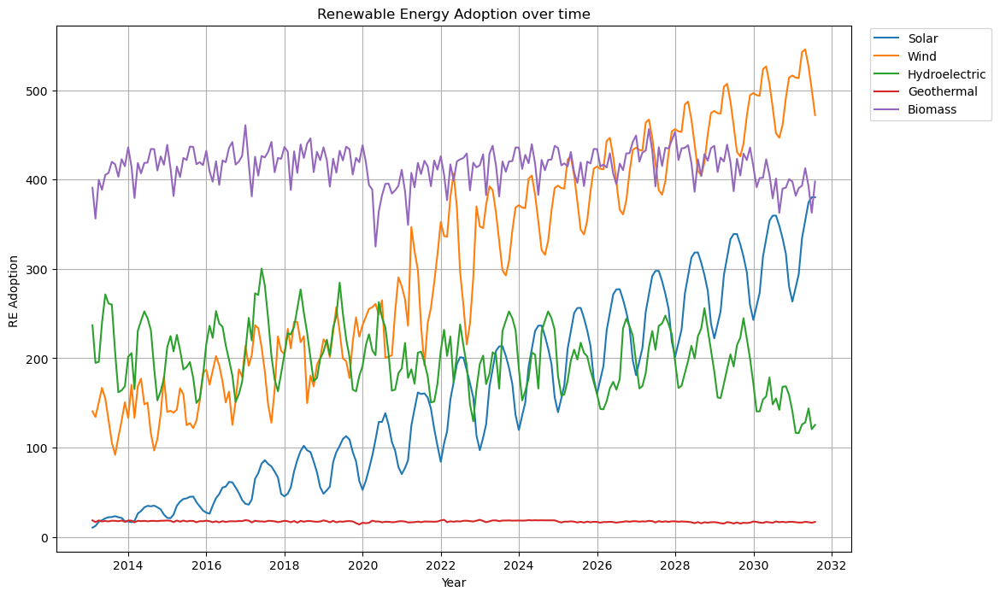

In [296]:
#Now we can check timeseries for all sectors
df_final_RE_new.set_index('Month').plot(figsize=(12,8))
plt.title('Renewable Energy Adoption over time')
plt.legend(loc ='upper center', bbox_to_anchor =(1.1,1.0), ncol=1, borderaxespad =0.2)
plt.xlabel('Year')
plt.ylabel('RE Adoption ')
plt.grid(True)

plt.show()

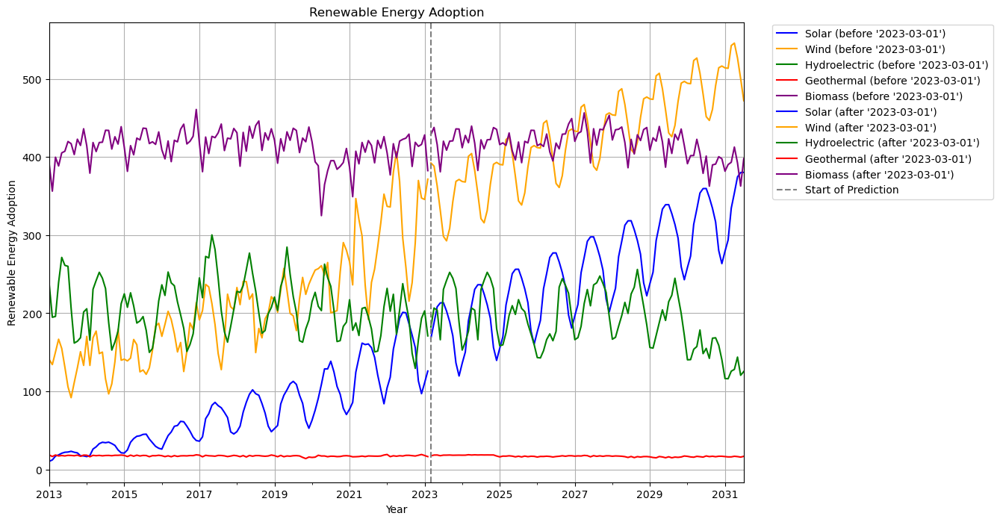

In [297]:
# Convert 'Month' column to datetime (if it's not already)
df_final_RE_new['Month'] = pd.to_datetime(df_final_RE_new['Month'])

# Define a color mapping for each sector before and after the date
color_map = {
    'Solar': {'before': 'blue', 'after': 'blue'},
    'Wind': {'before': 'orange', 'after': 'orange'},
    'Hydroelectric': {'before': 'green', 'after': 'green'},
    'Geothermal': {'before': 'red', 'after': 'red'},
    'Biomass': {'before': 'purple', 'after': 'purple'}
}

# Split the data
df_before = df_final_RE_new[df_final_RE_new['Month'] <= '2023-03-01']
df_after = df_final_RE_new[df_final_RE_new['Month'] > '2023-03-01']

fig, ax = plt.subplots(figsize=(12,8))

# Plot data before the date
for column in df_before.columns:
    if column != 'Month' and column in color_map:
        df_before.set_index('Month')[column].plot(ax=ax, color=color_map[column]['before'], label=column + " (before '2023-03-01')")

# Plot data after the date
for column in df_after.columns:
    if column != 'Month' and column in color_map:
        df_after.set_index('Month')[column].plot(ax=ax, color=color_map[column]['after'], label=column + " (after '2023-03-01')")

# Add a vertical line at '2023-03-01'
ax.axvline('2023-03-01', color='gray', linestyle='--', label='Start of Prediction')

plt.title('Renewable Energy Adoption')
plt.legend(loc='upper center', bbox_to_anchor=(1.2,1.0), ncol=1, borderaxespad=0.2)
plt.xlabel('Year')
plt.ylabel('Renewable Energy Adoption')
plt.grid(True)
plt.show()
